In [943]:
from scipy.stats import norm, ttest_1samp,ttest_ind,chi2_contingency,kstest,norm, ttest_rel, shapiro

import numpy as np
import pandas as pd
from scipy import stats

import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder, MinMaxScaler, StandardScaler


In [944]:
data = pd.read_csv('delhivery_data.csv')

In [945]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)


In [946]:
data=data[data['data']=='training']
data

,data,trip_creation_time,route_schedule_uuid,route_type,trip_uuid,source_center,source_name,destination_center,destination_name,od_start_time,od_end_time,start_scan_to_end_scan,is_cutoff,cutoff_factor,cutoff_timestamp,actual_distance_to_destination,actual_time,osrm_time,osrm_distance,factor,segment_actual_time,segment_osrm_time,segment_osrm_distance,segment_factor
0,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3297ef,Carting,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,2018-09-20 04:47:45.236797,86.0,True,9,2018-09-20 04:27:55,10.435660,14.0,11.0,11.9653,1.272727,14.0,11.0,11.9653,1.272727
1,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3297ef,Carting,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,2018-09-20 04:47:45.236797,86.0,True,18,2018-09-20 04:17:55,18.936842,24.0,20.0,21.7243,1.200000,10.0,9.0,9.7590,1.111111
2,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3297ef,Carting,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,2018-09-20 04:47:45.236797,86.0,True,27,2018-09-20 04:01:19.505586,27.637279,40.0,28.0,32.5395,1.428571,16.0,7.0,10.8152,2.285714
3,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3297ef,Carting,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,2018-09-20 04:47:45.236797,86.0,True,36,2018-09-20 03:39:57,36.118028,62.0,40.0,45.5620,1.550000,21.0,12.0,13.0224,1.750000
4,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3297ef,Carting,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,2018-09-20 04:47:45.236797,86.0,False,39,2018-09-20 03:33:55,39.386040,68.0,44.0,54.2181,1.545455,6.0,5.0,3.9153,1.200000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
144862,training,2018-09-20 16:24:28.436231,thanos::sroute:f0569d2f-4e20-4c31-8542-67b86d55f058,Carting,trip-153746066843555182,IND131028AAB,Sonipat_Kundli_H (Haryana),IND000000ACB,Gurgaon_Bilaspur_HB (Haryana),2018-09-20 16:24:28.436231,2018-09-20 23:32:09.618069,427.0,True,45,2018-09-20 21:57:20,45.258278,94.0,60.0,67.9280,1.566667,12.0,12.0,8.1858,1.000000
144863,training,2018-09-20 16:24:28.436231,thanos::sroute:f0569d2f-4e20-4c31-8542-67b86d55f058,Carting,trip-153746066843555182,IND131028AAB,Sonipat_Kundli_H (Haryana),IND000000ACB,Gurgaon_Bilaspur_HB (Haryana),2018-09-20 16:24:28.436231,2018-09-20 23:32:09.618069,427.0,True,54,2018-09-20 21:31:18,54.092531,120.0,76.0,85.6829,1.578947,26.0,21.0,17.3725,1.238095
144864,training,2018-09-20 16:24:28.436231,thanos::sroute:f0569d2f-4e20-4c31-8542-67b86d55f058,Carting,trip-153746066843555182,IND131028AAB,Sonipat_Kundli_H (Haryana),IND000000ACB,Gurgaon_Bilaspur_HB (Haryana),2018-09-20 16:24:28.436231,2018-09-20 23:32:09.618069,427.0,True,63,2018-09-20 21:11:18,66.163591,140.0,88.0,97.0933,1.590909,20.0,34.0,20.7053,0.588235
144865,training,2018-09-20 16:24:28.436231,thanos::sroute:f0569d2f-4e20-4c31-8542-67b86d55f058,Carting,trip-153746066843555182,IND131028AAB,Sonipat_Kundli_H (Haryana),IND000000ACB,Gurgaon_Bilaspur_HB (Haryana),2018-09-20 16:24:28.436231,2018-09-20 23:32:09.618069,427.0,True,72,2018-09-20 20:53:19,73.680667,158.0,98.0,111.2709,1.612245,17.0,27.0,18.8885,0.629630


### Column definitions
``
data - tells whether the data is testing or training data
trip_creation_time – Timestamp of trip creation
route_schedule_uuid – Unique Id for a particular route schedule
route_type – Transportation type
FTL – Full Truck Load: FTL shipments get to the destination sooner, as the truck is making no other pickups or drop-offs along the way
Carting: Handling system consisting of small vehicles (carts)
trip_uuid - Unique ID given to a particular trip (A trip may include different source and destination centers)
source_center - Source ID of trip origin
source_name - Source Name of trip origin
destination_cente – Destination ID
destination_name – Destination Name
od_start_time – Trip start time
od_end_time – Trip end time
start_scan_to_end_scan – Time taken to deliver from source to destination
is_cutoff – Unknown field
cutoff_factor – Unknown field
cutoff_timestamp – Unknown field
actual_distance_to_destination – Distance in Kms between source and destination warehouse
actual_time – Actual time taken to complete the delivery (Cumulative)
osrm_time – An open-source routing engine time calculator which computes the shortest path between points in a given map (Includes usual traffic, distance through major and minor roads) and gives the time (Cumulative)
osrm_distance – An open-source routing engine which computes the shortest path between points in a given map (Includes usual traffic, distance through major and minor roads) (Cumulative)
factor – Unknown field
segment_actual_time – This is a segment time. Time taken by the subset of the package delivery
segment_osrm_time – This is the OSRM segment time. Time taken by the subset of the package delivery
segment_osrm_distance – This is the OSRM distance. Distance covered by subset of the package delivery
segment_factor – Unknown field
``

## 1. a) Handle missing values in the data.


In [947]:
data.describe()

,start_scan_to_end_scan,cutoff_factor,actual_distance_to_destination,actual_time,osrm_time,osrm_distance,factor,segment_actual_time,segment_osrm_time,segment_osrm_distance,segment_factor
count,104858.000000,104858.000000,104858.000000,104858.000000,104858.000000,104858.000000,104858.000000,104858.000000,104858.000000,104858.000000,104858.000000
mean,944.954119,229.039167,230.286725,410.314263,210.743444,280.215620,2.112316,36.393952,18.631511,22.955750,2.211386
std,1017.591095,339.250432,339.500527,587.562589,303.417187,414.804815,1.643065,52.651730,15.039765,18.299019,4.974192
min,20.000000,9.000000,9.000267,9.000000,6.000000,9.008200,0.144000,-244.000000,0.000000,0.000000,-23.444444
25%,165.000000,22.000000,23.702352,53.000000,28.000000,30.558325,1.604167,20.000000,11.000000,12.269725,1.347826
50%,453.000000,66.000000,66.383466,134.000000,66.000000,79.847700,1.857143,29.000000,17.000000,23.576950,1.681818
75%,1579.000000,266.000000,270.843536,498.000000,250.000000,330.617850,2.214286,41.000000,23.000000,27.939650,2.250000
max,4535.000000,1927.000000,1927.447705,4532.000000,1686.000000,2326.199100,77.387097,3051.000000,1611.000000,2191.403700,574.250000


In [948]:
data.describe(include="object")

,data,trip_creation_time,route_schedule_uuid,route_type,trip_uuid,source_center,source_name,destination_center,destination_name,od_start_time,od_end_time,cutoff_timestamp
count,104858,104858,104858,104858,104858,104858,104729,104858,104758,104858,104858,104858
unique,1,10654,1385,2,10654,1425,1417,1409,1399,18948,18948,66370
top,training,2018-09-20 04:32:37.405584,thanos::sroute:de5e208e-7641-45e6-8100-4d9fb1e5720d,FTL,trip-153793758186488532,IND000000ACB,Gurgaon_Bilaspur_HB (Haryana),IND000000ACB,Gurgaon_Bilaspur_HB (Haryana),2018-09-21 18:37:09.322207,2018-09-24 09:59:15.691618,2018-09-24 05:19:20
freq,104858,101,1280,73108,101,16472,16472,11422,11422,81,81,40


In [949]:
data.head()

,data,trip_creation_time,route_schedule_uuid,route_type,trip_uuid,source_center,source_name,destination_center,destination_name,od_start_time,od_end_time,start_scan_to_end_scan,is_cutoff,cutoff_factor,cutoff_timestamp,actual_distance_to_destination,actual_time,osrm_time,osrm_distance,factor,segment_actual_time,segment_osrm_time,segment_osrm_distance,segment_factor
0,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3297ef,Carting,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,2018-09-20 04:47:45.236797,86.0,True,9,2018-09-20 04:27:55,10.435660,14.0,11.0,11.9653,1.272727,14.0,11.0,11.9653,1.272727
1,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3297ef,Carting,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,2018-09-20 04:47:45.236797,86.0,True,18,2018-09-20 04:17:55,18.936842,24.0,20.0,21.7243,1.200000,10.0,9.0,9.7590,1.111111
2,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3297ef,Carting,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,2018-09-20 04:47:45.236797,86.0,True,27,2018-09-20 04:01:19.505586,27.637279,40.0,28.0,32.5395,1.428571,16.0,7.0,10.8152,2.285714
3,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3297ef,Carting,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,2018-09-20 04:47:45.236797,86.0,True,36,2018-09-20 03:39:57,36.118028,62.0,40.0,45.5620,1.550000,21.0,12.0,13.0224,1.750000
4,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3297ef,Carting,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,2018-09-20 04:47:45.236797,86.0,False,39,2018-09-20 03:33:55,39.386040,68.0,44.0,54.2181,1.545455,6.0,5.0,3.9153,1.200000


In [950]:
data_missing = (data.isnull().sum()/data.shape[0])*100
data_missing.sort_values(ascending=False)

source_name                       0.123024
destination_name                  0.095367
segment_factor                    0.000000
segment_osrm_distance             0.000000
trip_creation_time                0.000000
route_schedule_uuid               0.000000
route_type                        0.000000
trip_uuid                         0.000000
source_center                     0.000000
destination_center                0.000000
od_start_time                     0.000000
od_end_time                       0.000000
start_scan_to_end_scan            0.000000
is_cutoff                         0.000000
cutoff_factor                     0.000000
cutoff_timestamp                  0.000000
actual_distance_to_destination    0.000000
actual_time                       0.000000
osrm_time                         0.000000
osrm_distance                     0.000000
factor                            0.000000
segment_actual_time               0.000000
segment_osrm_time                 0.000000
data       

In [951]:
data["source_name"].value_counts()

Gurgaon_Bilaspur_HB (Haryana)         16472
Bangalore_Nelmngla_H (Karnataka)       7391
Bhiwandi_Mankoli_HB (Maharashtra)      6430
Pune_Tathawde_H (Maharashtra)          3401
Hyderabad_Shamshbd_H (Telangana)       2559
                                      ...  
Vizag _NAD (Andhra Pradesh)               1
Tiruchi_Samyaprm_D (Tamil Nadu)           1
Nipani_AkkolRD_D (Karnataka)              1
Islampure_ShbdnDPP_D (West Bengal)        1
Dhoraji_JmnvadRd_DC (Gujarat)             1
Name: source_name, Length: 1417, dtype: int64

In [952]:
data["source_name"].unique()

array(['Anand_VUNagar_DC (Gujarat)', 'Khambhat_MotvdDPP_D (Gujarat)',
       'Bhiwandi_Mankoli_HB (Maharashtra)', ...,
       'Gobicheti_Ward25_D (Tamil Nadu)', 'Dwarka_StnRoad_DC (Gujarat)',
       'Kulithalai_AnnaNGR_D (Tamil Nadu)'], dtype=object)

In [953]:
nullSourceNameData = data[data["source_name"].isnull()]
nullSourceNameData

,data,trip_creation_time,route_schedule_uuid,route_type,trip_uuid,source_center,source_name,destination_center,destination_name,od_start_time,od_end_time,start_scan_to_end_scan,is_cutoff,cutoff_factor,cutoff_timestamp,actual_distance_to_destination,actual_time,osrm_time,osrm_distance,factor,segment_actual_time,segment_osrm_time,segment_osrm_distance,segment_factor
112,training,2018-09-25 08:53:04.377810,thanos::sroute:4460a38d-ab9b-484e-bd4e-f4201d0ea19b,FTL,trip-153786558437756691,IND342902A1B,NaN,IND302014AAA,Jaipur_Hub (Rajasthan),2018-09-26 06:58:08.054001,2018-09-26 15:54:14.280942,536.0,True,22,2018-09-26 14:09:19,22.783440,48.0,34.0,37.7749,1.411765,48.0,34.0,37.7749,1.411765
113,training,2018-09-25 08:53:04.377810,thanos::sroute:4460a38d-ab9b-484e-bd4e-f4201d0ea19b,FTL,trip-153786558437756691,IND342902A1B,NaN,IND302014AAA,Jaipur_Hub (Rajasthan),2018-09-26 06:58:08.054001,2018-09-26 15:54:14.280942,536.0,True,44,2018-09-26 13:19:23,46.071250,98.0,41.0,56.3575,2.390244,49.0,33.0,34.1661,1.484848
114,training,2018-09-25 08:53:04.377810,thanos::sroute:4460a38d-ab9b-484e-bd4e-f4201d0ea19b,FTL,trip-153786558437756691,IND342902A1B,NaN,IND302014AAA,Jaipur_Hub (Rajasthan),2018-09-26 06:58:08.054001,2018-09-26 15:54:14.280942,536.0,True,66,2018-09-26 12:49:33,67.714993,127.0,58.0,80.4811,2.189655,29.0,17.0,24.1236,1.705882
115,training,2018-09-25 08:53:04.377810,thanos::sroute:4460a38d-ab9b-484e-bd4e-f4201d0ea19b,FTL,trip-153786558437756691,IND342902A1B,NaN,IND302014AAA,Jaipur_Hub (Rajasthan),2018-09-26 06:58:08.054001,2018-09-26 15:54:14.280942,536.0,True,88,2018-09-26 12:21:18,88.149642,156.0,73.0,101.2556,2.136986,28.0,14.0,20.7746,2.000000
116,training,2018-09-25 08:53:04.377810,thanos::sroute:4460a38d-ab9b-484e-bd4e-f4201d0ea19b,FTL,trip-153786558437756691,IND342902A1B,NaN,IND302014AAA,Jaipur_Hub (Rajasthan),2018-09-26 06:58:08.054001,2018-09-26 15:54:14.280942,536.0,True,110,2018-09-26 11:25:24,112.691981,212.0,92.0,127.9860,2.304348,55.0,18.0,26.7304,3.055556
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
130948,training,2018-09-24 09:02:11.002942,thanos::sroute:8f7257a6-ff74-4bb8-90b5-e89a98a4329d,FTL,trip-153777973100266904,IND282002AAD,NaN,IND474003AAA,Gwalior_HrihrNgr_I (Madhya Pradesh),2018-09-24 16:39:47.185632,2018-09-24 21:16:28.639500,276.0,False,108,2018-09-24 17:46:43,108.441584,196.0,120.0,121.3751,1.633333,73.0,43.0,43.1739,1.697674
132928,training,2018-09-21 19:45:13.780410,thanos::sroute:da7a341a-ba3d-436d-b4b5-607d1a05a46f,FTL,trip-153755911378016076,IND509103AAC,NaN,IND518002AAA,Kurnool_AbbasNgr_I (Andhra Pradesh),2018-09-22 05:36:54.356510,2018-09-22 07:07:33.692794,90.0,True,22,2018-09-22 06:13:21,22.714572,42.0,18.0,25.5336,2.333333,42.0,18.0,25.5336,2.333333
132929,training,2018-09-21 19:45:13.780410,thanos::sroute:da7a341a-ba3d-436d-b4b5-607d1a05a46f,FTL,trip-153755911378016076,IND509103AAC,NaN,IND518002AAA,Kurnool_AbbasNgr_I (Andhra Pradesh),2018-09-22 05:36:54.356510,2018-09-22 07:07:33.692794,90.0,False,43,2018-09-22 05:39:24.784051,43.313373,76.0,39.0,56.1673,1.948718,33.0,21.0,30.6337,1.571429
136411,training,2018-09-26 08:07:09.856682,thanos::sroute:3d2b37af-867d-40b0-9213-a8dd1b6f2a55,FTL,trip-153794922985641945,IND465333A1B,NaN,IND465333AAA,Shujalpur_AstrdDPP_D (Madhya Pradesh),2018-09-26 15:42:57.412321,2018-09-26 16:43:16.736026,60.0,True,22,2018-09-26 15:42:57.412321,36.795308,46.0,72.0,58.2535,0.638889,46.0,72.0,58.2535,0.638889


In [954]:
# we are filling NA values in source_name with source_center values
data["source_name"]=data["source_name"].fillna(
    data["source_center"]+'_'+data["source_center"]+'_'+data["source_center"]+'('+data["source_center"]+')')
data["source_name"].unique()

array(['Anand_VUNagar_DC (Gujarat)', 'Khambhat_MotvdDPP_D (Gujarat)',
       'Bhiwandi_Mankoli_HB (Maharashtra)', ...,
       'Gobicheti_Ward25_D (Tamil Nadu)', 'Dwarka_StnRoad_DC (Gujarat)',
       'Kulithalai_AnnaNGR_D (Tamil Nadu)'], dtype=object)

In [955]:
# we are filling NA values in destination_name with destination_center values
data["destination_name"]=data["destination_name"].fillna(
    data["destination_center"]+'_'+data["destination_center"]+'_'+data["destination_center"]+'('+data["destination_center"]+')')
data["destination_name"].unique()

array(['Khambhat_MotvdDPP_D (Gujarat)', 'Anand_Vaghasi_IP (Gujarat)',
       'Pune_Tathawde_H (Maharashtra)', ...,
       'Chennai_Mylapore (Tamil Nadu)', 'Naraingarh_Ward2DPP_D (Haryana)',
       'Mumbai_Ghansoli_DC (Maharashtra)'], dtype=object)

In [956]:
data_missing = (data.isnull().sum()/data.shape[0])*100
data_missing.sort_values(ascending=False)

segment_factor                    0.0
segment_osrm_distance             0.0
trip_creation_time                0.0
route_schedule_uuid               0.0
route_type                        0.0
trip_uuid                         0.0
source_center                     0.0
source_name                       0.0
destination_center                0.0
destination_name                  0.0
od_start_time                     0.0
od_end_time                       0.0
start_scan_to_end_scan            0.0
is_cutoff                         0.0
cutoff_factor                     0.0
cutoff_timestamp                  0.0
actual_distance_to_destination    0.0
actual_time                       0.0
osrm_time                         0.0
osrm_distance                     0.0
factor                            0.0
segment_actual_time               0.0
segment_osrm_time                 0.0
data                              0.0
dtype: float64

## 1. b) Analyze structure of data


In [957]:
data.head()

,data,trip_creation_time,route_schedule_uuid,route_type,trip_uuid,source_center,source_name,destination_center,destination_name,od_start_time,od_end_time,start_scan_to_end_scan,is_cutoff,cutoff_factor,cutoff_timestamp,actual_distance_to_destination,actual_time,osrm_time,osrm_distance,factor,segment_actual_time,segment_osrm_time,segment_osrm_distance,segment_factor
0,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3297ef,Carting,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,2018-09-20 04:47:45.236797,86.0,True,9,2018-09-20 04:27:55,10.435660,14.0,11.0,11.9653,1.272727,14.0,11.0,11.9653,1.272727
1,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3297ef,Carting,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,2018-09-20 04:47:45.236797,86.0,True,18,2018-09-20 04:17:55,18.936842,24.0,20.0,21.7243,1.200000,10.0,9.0,9.7590,1.111111
2,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3297ef,Carting,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,2018-09-20 04:47:45.236797,86.0,True,27,2018-09-20 04:01:19.505586,27.637279,40.0,28.0,32.5395,1.428571,16.0,7.0,10.8152,2.285714
3,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3297ef,Carting,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,2018-09-20 04:47:45.236797,86.0,True,36,2018-09-20 03:39:57,36.118028,62.0,40.0,45.5620,1.550000,21.0,12.0,13.0224,1.750000
4,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3297ef,Carting,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,2018-09-20 04:47:45.236797,86.0,False,39,2018-09-20 03:33:55,39.386040,68.0,44.0,54.2181,1.545455,6.0,5.0,3.9153,1.200000


In [958]:
rows, columns = data.shape
print(rows, columns)

104858 24


In [959]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 104858 entries, 0 to 144866
Data columns (total 24 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   data                            104858 non-null  object 
 1   trip_creation_time              104858 non-null  object 
 2   route_schedule_uuid             104858 non-null  object 
 3   route_type                      104858 non-null  object 
 4   trip_uuid                       104858 non-null  object 
 5   source_center                   104858 non-null  object 
 6   source_name                     104858 non-null  object 
 7   destination_center              104858 non-null  object 
 8   destination_name                104858 non-null  object 
 9   od_start_time                   104858 non-null  object 
 10  od_end_time                     104858 non-null  object 
 11  start_scan_to_end_scan          104858 non-null  float64
 12  is_cutoff       

In [960]:
# convert trip_creation_time, od_start_time, od_end_time and cutoff_timestamp into datetime format
data['trip_creation_time'] = pd.to_datetime(data['trip_creation_time'])
data['od_start_time'] = pd.to_datetime(data['od_start_time'])
data['od_end_time'] = pd.to_datetime(data['od_end_time'])
data['cutoff_timestamp'] = pd.to_datetime(data['cutoff_timestamp'])
data

,data,trip_creation_time,route_schedule_uuid,route_type,trip_uuid,source_center,source_name,destination_center,destination_name,od_start_time,od_end_time,start_scan_to_end_scan,is_cutoff,cutoff_factor,cutoff_timestamp,actual_distance_to_destination,actual_time,osrm_time,osrm_distance,factor,segment_actual_time,segment_osrm_time,segment_osrm_distance,segment_factor
0,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3297ef,Carting,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,2018-09-20 04:47:45.236797,86.0,True,9,2018-09-20 04:27:55.000000,10.435660,14.0,11.0,11.9653,1.272727,14.0,11.0,11.9653,1.272727
1,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3297ef,Carting,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,2018-09-20 04:47:45.236797,86.0,True,18,2018-09-20 04:17:55.000000,18.936842,24.0,20.0,21.7243,1.200000,10.0,9.0,9.7590,1.111111
2,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3297ef,Carting,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,2018-09-20 04:47:45.236797,86.0,True,27,2018-09-20 04:01:19.505586,27.637279,40.0,28.0,32.5395,1.428571,16.0,7.0,10.8152,2.285714
3,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3297ef,Carting,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,2018-09-20 04:47:45.236797,86.0,True,36,2018-09-20 03:39:57.000000,36.118028,62.0,40.0,45.5620,1.550000,21.0,12.0,13.0224,1.750000
4,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3297ef,Carting,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,2018-09-20 04:47:45.236797,86.0,False,39,2018-09-20 03:33:55.000000,39.386040,68.0,44.0,54.2181,1.545455,6.0,5.0,3.9153,1.200000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
144862,training,2018-09-20 16:24:28.436231,thanos::sroute:f0569d2f-4e20-4c31-8542-67b86d55f058,Carting,trip-153746066843555182,IND131028AAB,Sonipat_Kundli_H (Haryana),IND000000ACB,Gurgaon_Bilaspur_HB (Haryana),2018-09-20 16:24:28.436231,2018-09-20 23:32:09.618069,427.0,True,45,2018-09-20 21:57:20.000000,45.258278,94.0,60.0,67.9280,1.566667,12.0,12.0,8.1858,1.000000
144863,training,2018-09-20 16:24:28.436231,thanos::sroute:f0569d2f-4e20-4c31-8542-67b86d55f058,Carting,trip-153746066843555182,IND131028AAB,Sonipat_Kundli_H (Haryana),IND000000ACB,Gurgaon_Bilaspur_HB (Haryana),2018-09-20 16:24:28.436231,2018-09-20 23:32:09.618069,427.0,True,54,2018-09-20 21:31:18.000000,54.092531,120.0,76.0,85.6829,1.578947,26.0,21.0,17.3725,1.238095
144864,training,2018-09-20 16:24:28.436231,thanos::sroute:f0569d2f-4e20-4c31-8542-67b86d55f058,Carting,trip-153746066843555182,IND131028AAB,Sonipat_Kundli_H (Haryana),IND000000ACB,Gurgaon_Bilaspur_HB (Haryana),2018-09-20 16:24:28.436231,2018-09-20 23:32:09.618069,427.0,True,63,2018-09-20 21:11:18.000000,66.163591,140.0,88.0,97.0933,1.590909,20.0,34.0,20.7053,0.588235
144865,training,2018-09-20 16:24:28.436231,thanos::sroute:f0569d2f-4e20-4c31-8542-67b86d55f058,Carting,trip-153746066843555182,IND131028AAB,Sonipat_Kundli_H (Haryana),IND000000ACB,Gurgaon_Bilaspur_HB (Haryana),2018-09-20 16:24:28.436231,2018-09-20 23:32:09.618069,427.0,True,72,2018-09-20 20:53:19.000000,73.680667,158.0,98.0,111.2709,1.612245,17.0,27.0,18.8885,0.629630


In [961]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 104858 entries, 0 to 144866
Data columns (total 24 columns):
 #   Column                          Non-Null Count   Dtype         
---  ------                          --------------   -----         
 0   data                            104858 non-null  object        
 1   trip_creation_time              104858 non-null  datetime64[ns]
 2   route_schedule_uuid             104858 non-null  object        
 3   route_type                      104858 non-null  object        
 4   trip_uuid                       104858 non-null  object        
 5   source_center                   104858 non-null  object        
 6   source_name                     104858 non-null  object        
 7   destination_center              104858 non-null  object        
 8   destination_name                104858 non-null  object        
 9   od_start_time                   104858 non-null  datetime64[ns]
 10  od_end_time                     104858 non-null  datetim

In [962]:
data["data"].value_counts()

training    104858
Name: data, dtype: int64

In [963]:
data["route_type"].value_counts()

FTL        73108
Carting    31750
Name: route_type, dtype: int64

In [964]:
data["route_schedule_uuid"].value_counts()

thanos::sroute:de5e208e-7641-45e6-8100-4d9fb1e5720d    1280
thanos::sroute:4029a8a2-6c74-4b7e-a6d8-f9e069fbcea9    1274
thanos::sroute:a1b25549-1e77-498f-8538-00292e5bd5a2    1069
thanos::sroute:0456b740-1dad-4929-bbe0-87d8843f5a10    1069
thanos::sroute:dca6268f-741a-4d1a-b1b0-aab13095a366    1066
                                                       ... 
thanos::sroute:c6403e98-1ffa-49ed-bc55-5adcdc4ad39d       1
thanos::sroute:46906548-c0fa-4c72-a622-2aaa4ee1ccf9       1
thanos::sroute:629ad783-00c1-459b-ac3e-390dc3aa1a45       1
thanos::sroute:6b02f196-f03e-485e-8c07-7f7fbd3d78e1       1
thanos::sroute:afb04bf4-7734-4526-8d66-63ed50bef88b       1
Name: route_schedule_uuid, Length: 1385, dtype: int64

In [965]:
data["source_name"].value_counts()

Gurgaon_Bilaspur_HB (Haryana)          16472
Bangalore_Nelmngla_H (Karnataka)        7391
Bhiwandi_Mankoli_HB (Maharashtra)       6430
Pune_Tathawde_H (Maharashtra)           3401
Hyderabad_Shamshbd_H (Telangana)        2559
                                       ...  
Bengaluru_Bomsndra_L (Karnataka)           1
Addanki_Oilmilrd_D (Andhra Pradesh)        1
Soro_UttarDPP_D (Orissa)                   1
Manteswar_MemariRD_D (West Bengal)         1
Mumbai_Nerul_D (Maharashtra)               1
Name: source_name, Length: 1425, dtype: int64

In [966]:
data["destination_name"].value_counts()

Gurgaon_Bilaspur_HB (Haryana)           11422
Bangalore_Nelmngla_H (Karnataka)         7992
Bhiwandi_Mankoli_HB (Maharashtra)        3984
Hyderabad_Shamshbd_H (Telangana)         3890
Kolkata_Dankuni_HB (West Bengal)         3457
                                        ...  
Lodhan_GoalpDPP_D (West Bengal)             1
Chennai_Mylapore (Tamil Nadu)               1
Delhi_Lajwanti (Delhi)                      1
Roing_DibngVly_D (Arunachal Pradesh)        1
Kothanalloor_Majoor_D (Kerala)              1
Name: destination_name, Length: 1409, dtype: int64

In [967]:
# we notice Destination_City being both Bengaluru and Bangalore, replacing to new name
df=data.copy()
df['destination_name'] = df['destination_name'].str.replace(r'(.*?)Bangalore(.*?)', r'\1Bengaluru\2', regex=True)
df["destination_name"].value_counts()# df['Destination_City'] = df['Destination_City'].replace('Bengaluru', 'Bangalore')


Gurgaon_Bilaspur_HB (Haryana)                           11422
Bengaluru_Nelmngla_H (Karnataka)                         7992
Bhiwandi_Mankoli_HB (Maharashtra)                        3984
Hyderabad_Shamshbd_H (Telangana)                         3890
Kolkata_Dankuni_HB (West Bengal)                         3457
                                                        ...  
Dhuri_DMComDPP_D (Punjab)                                   1
IND509103AAC_IND509103AAC_IND509103AAC(IND509103AAC)        1
Anand_VUNagar_DC (Gujarat)                                  1
Gopiganj_Wardno13_D (Uttar Pradesh)                         1
Baghpat_Barout_D (Uttar Pradesh)                            1
Name: destination_name, Length: 1409, dtype: int64

In [968]:
df['source_name'] = df['source_name'].str.replace(r'(.*?)Bangalore(.*?)', r'\1Bengaluru\2', regex=True)
df["source_name"].value_counts()# df['Destination_City'] = df['Destination_City'].replace('Bengaluru', 'Bangalore')
data=df.copy()

In [969]:
data["is_cutoff"].value_counts()

True     86050
False    18808
Name: is_cutoff, dtype: int64

In [970]:
data.describe()

,start_scan_to_end_scan,cutoff_factor,actual_distance_to_destination,actual_time,osrm_time,osrm_distance,factor,segment_actual_time,segment_osrm_time,segment_osrm_distance,segment_factor
count,104858.000000,104858.000000,104858.000000,104858.000000,104858.000000,104858.000000,104858.000000,104858.000000,104858.000000,104858.000000,104858.000000
mean,944.954119,229.039167,230.286725,410.314263,210.743444,280.215620,2.112316,36.393952,18.631511,22.955750,2.211386
std,1017.591095,339.250432,339.500527,587.562589,303.417187,414.804815,1.643065,52.651730,15.039765,18.299019,4.974192
min,20.000000,9.000000,9.000267,9.000000,6.000000,9.008200,0.144000,-244.000000,0.000000,0.000000,-23.444444
25%,165.000000,22.000000,23.702352,53.000000,28.000000,30.558325,1.604167,20.000000,11.000000,12.269725,1.347826
50%,453.000000,66.000000,66.383466,134.000000,66.000000,79.847700,1.857143,29.000000,17.000000,23.576950,1.681818
75%,1579.000000,266.000000,270.843536,498.000000,250.000000,330.617850,2.214286,41.000000,23.000000,27.939650,2.250000
max,4535.000000,1927.000000,1927.447705,4532.000000,1686.000000,2326.199100,77.387097,3051.000000,1611.000000,2191.403700,574.250000


In [971]:
data.describe(include="datetime64", datetime_is_numeric=True)


,trip_creation_time,od_start_time,od_end_time,cutoff_timestamp
count,104858,104858,104858,104858
mean,2018-09-19 12:35:57.021253376,2018-09-19 16:57:22.999552,2018-09-20 08:42:49.942158848,2018-09-20 01:18:10.372608
min,2018-09-12 00:00:16.535741,2018-09-12 00:00:16.535741,2018-09-12 00:50:10.814399,2018-09-12 00:02:09.740725
25%,2018-09-15 19:38:34.268471040,2018-09-15 23:11:02.310111744,2018-09-16 14:22:32.328868096,2018-09-16 05:59:25
50%,2018-09-19 14:47:43.719651072,2018-09-19 19:11:14.956966912,2018-09-20 08:01:53.835889920,2018-09-20 02:37:55.310714368
75%,2018-09-23 02:41:57.706321920,2018-09-23 07:33:18.577252096,2018-09-24 02:31:18.395973120,2018-09-23 19:13:03.499999744
max,2018-09-26 23:54:27.945614,2018-09-29 03:12:56.095056,2018-09-29 17:37:35.478498,2018-09-29 16:44:14


In [972]:
data.describe(include="object")

,data,route_schedule_uuid,route_type,trip_uuid,source_center,source_name,destination_center,destination_name
count,104858,104858,104858,104858,104858,104858,104858,104858
unique,1,1385,2,10654,1425,1425,1409,1409
top,training,thanos::sroute:de5e208e-7641-45e6-8100-4d9fb1e5720d,FTL,trip-153793758186488532,IND000000ACB,Gurgaon_Bilaspur_HB (Haryana),IND000000ACB,Gurgaon_Bilaspur_HB (Haryana)
freq,104858,1280,73108,101,16472,16472,11422,11422


In [973]:
# confirming 1508 source_center code for 1508 source_name

consistent_mapping = data.groupby('source_center')['source_name'].nunique() == 1

# Get the source_centers with consistent mapping
source_centers_consistent = consistent_mapping[consistent_mapping].index.tolist()

print("Source centers with consistent mapping:")
print(len(source_centers_consistent))



Source centers with consistent mapping:
1425


In [974]:
# confirming 1481 destination_center code for 1481 destination_name

consistent_mapping = data.groupby('destination_center')['destination_name'].nunique() == 1

# Get the source_centers with consistent mapping
dest_centers_consistent = consistent_mapping[consistent_mapping].index.tolist()

print("Destination centers with consistent mapping:")
print(len(dest_centers_consistent))


Destination centers with consistent mapping:
1409


### Both source center & destination center counts are equal to consistent mapping count with source_name & destination_name respectively, so we can drop ource center & destination center columns

## 1. c) Try merging the rows 

In [975]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 104858 entries, 0 to 144866
Data columns (total 24 columns):
 #   Column                          Non-Null Count   Dtype         
---  ------                          --------------   -----         
 0   data                            104858 non-null  object        
 1   trip_creation_time              104858 non-null  datetime64[ns]
 2   route_schedule_uuid             104858 non-null  object        
 3   route_type                      104858 non-null  object        
 4   trip_uuid                       104858 non-null  object        
 5   source_center                   104858 non-null  object        
 6   source_name                     104858 non-null  object        
 7   destination_center              104858 non-null  object        
 8   destination_name                104858 non-null  object        
 9   od_start_time                   104858 non-null  datetime64[ns]
 10  od_end_time                     104858 non-null  datetim

In [976]:
data.head()

,data,trip_creation_time,route_schedule_uuid,route_type,trip_uuid,source_center,source_name,destination_center,destination_name,od_start_time,od_end_time,start_scan_to_end_scan,is_cutoff,cutoff_factor,cutoff_timestamp,actual_distance_to_destination,actual_time,osrm_time,osrm_distance,factor,segment_actual_time,segment_osrm_time,segment_osrm_distance,segment_factor
0,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3297ef,Carting,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,2018-09-20 04:47:45.236797,86.0,True,9,2018-09-20 04:27:55.000000,10.435660,14.0,11.0,11.9653,1.272727,14.0,11.0,11.9653,1.272727
1,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3297ef,Carting,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,2018-09-20 04:47:45.236797,86.0,True,18,2018-09-20 04:17:55.000000,18.936842,24.0,20.0,21.7243,1.200000,10.0,9.0,9.7590,1.111111
2,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3297ef,Carting,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,2018-09-20 04:47:45.236797,86.0,True,27,2018-09-20 04:01:19.505586,27.637279,40.0,28.0,32.5395,1.428571,16.0,7.0,10.8152,2.285714
3,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3297ef,Carting,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,2018-09-20 04:47:45.236797,86.0,True,36,2018-09-20 03:39:57.000000,36.118028,62.0,40.0,45.5620,1.550000,21.0,12.0,13.0224,1.750000
4,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3297ef,Carting,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,2018-09-20 04:47:45.236797,86.0,False,39,2018-09-20 03:33:55.000000,39.386040,68.0,44.0,54.2181,1.545455,6.0,5.0,3.9153,1.200000


In [977]:
view1 = data[(data["trip_uuid"] == "trip-153741093647649320") & (data["source_center"] == 'IND388121AAA') & (data["destination_center"] == 'IND388620AAB')]
view1

,data,trip_creation_time,route_schedule_uuid,route_type,trip_uuid,source_center,source_name,destination_center,destination_name,od_start_time,od_end_time,start_scan_to_end_scan,is_cutoff,cutoff_factor,cutoff_timestamp,actual_distance_to_destination,actual_time,osrm_time,osrm_distance,factor,segment_actual_time,segment_osrm_time,segment_osrm_distance,segment_factor
0,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3297ef,Carting,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,2018-09-20 04:47:45.236797,86.0,True,9,2018-09-20 04:27:55.000000,10.435660,14.0,11.0,11.9653,1.272727,14.0,11.0,11.9653,1.272727
1,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3297ef,Carting,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,2018-09-20 04:47:45.236797,86.0,True,18,2018-09-20 04:17:55.000000,18.936842,24.0,20.0,21.7243,1.200000,10.0,9.0,9.7590,1.111111
2,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3297ef,Carting,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,2018-09-20 04:47:45.236797,86.0,True,27,2018-09-20 04:01:19.505586,27.637279,40.0,28.0,32.5395,1.428571,16.0,7.0,10.8152,2.285714
3,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3297ef,Carting,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,2018-09-20 04:47:45.236797,86.0,True,36,2018-09-20 03:39:57.000000,36.118028,62.0,40.0,45.5620,1.550000,21.0,12.0,13.0224,1.750000
4,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3297ef,Carting,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,2018-09-20 04:47:45.236797,86.0,False,39,2018-09-20 03:33:55.000000,39.386040,68.0,44.0,54.2181,1.545455,6.0,5.0,3.9153,1.200000


<!-- can try to aggregate all int64 and float64 columns if possible
  11  start_scan_to_end_scan          144867 non-null  int64  
  13  cutoff_factor                   144867 non-null  int64  
  15  actual_distance_to_destination  144867 non-null  float64
  16  actual_time                     144867 non-null  int64  
  17  osrm_time                       144867 non-null  int64  
  18  osrm_distance                   144867 non-null  float64
  19  factor                          144867 non-null  float64
  20  segment_actual_time             144867 non-null  int64  
  21  segment_osrm_time               144867 non-null  int64  
  22  segment_osrm_distance           144867 non-null  float64
  23  segment_factor                  144867 non-null  float64 -->

In [978]:
columns= list(data)
columns

['data',
 'trip_creation_time',
 'route_schedule_uuid',
 'route_type',
 'trip_uuid',
 'source_center',
 'source_name',
 'destination_center',
 'destination_name',
 'od_start_time',
 'od_end_time',
 'start_scan_to_end_scan',
 'is_cutoff',
 'cutoff_factor',
 'cutoff_timestamp',
 'actual_distance_to_destination',
 'actual_time',
 'osrm_time',
 'osrm_distance',
 'factor',
 'segment_actual_time',
 'segment_osrm_time',
 'segment_osrm_distance',
 'segment_factor']

In [979]:
# Merge and aggregate rows based on Trip_uuid, Source ID, and Destination ID
df=data

merged_data = df.groupby(['trip_uuid', 'source_center', 'destination_center']).agg({
    'segment_actual_time': 'cumsum', # will become same as actual_time
    'segment_osrm_time': 'cumsum', # will become same as osrm_time
    'segment_osrm_distance': 'cumsum' # will become same as osrm_distance
})
df = df.drop(['segment_actual_time', 'segment_osrm_time', 'segment_osrm_distance'], axis=1)

combined_df = pd.concat([df, merged_data], axis=1)
desired_columns = ['trip_uuid', 'source_center', 'destination_center','segment_actual_time', 'actual_time', 'segment_osrm_time', 'osrm_time', 'segment_osrm_distance', 'osrm_distance']
view2 = combined_df[desired_columns]
view2


,trip_uuid,source_center,destination_center,segment_actual_time,actual_time,segment_osrm_time,osrm_time,segment_osrm_distance,osrm_distance
0,trip-153741093647649320,IND388121AAA,IND388620AAB,14.0,14.0,11.0,11.0,11.9653,11.9653
1,trip-153741093647649320,IND388121AAA,IND388620AAB,24.0,24.0,20.0,20.0,21.7243,21.7243
2,trip-153741093647649320,IND388121AAA,IND388620AAB,40.0,40.0,27.0,28.0,32.5395,32.5395
3,trip-153741093647649320,IND388121AAA,IND388620AAB,61.0,62.0,39.0,40.0,45.5619,45.5620
4,trip-153741093647649320,IND388121AAA,IND388620AAB,67.0,68.0,44.0,44.0,49.4772,54.2181
...,...,...,...,...,...,...,...,...,...
144862,trip-153746066843555182,IND131028AAB,IND000000ACB,92.0,94.0,94.0,60.0,65.3487,67.9280
144863,trip-153746066843555182,IND131028AAB,IND000000ACB,118.0,120.0,115.0,76.0,82.7212,85.6829
144864,trip-153746066843555182,IND131028AAB,IND000000ACB,138.0,140.0,149.0,88.0,103.4265,97.0933
144865,trip-153746066843555182,IND131028AAB,IND000000ACB,155.0,158.0,176.0,98.0,122.3150,111.2709


In [980]:
# Merge and aggregate rows based on Trip_uuid, Source ID, and Destination ID
df=data

merged_data = df.groupby(['trip_uuid', 'source_center', 'destination_center']).agg({
    'actual_time': 'max', 
    'segment_actual_time': 'sum', # will become same as actual_time
    'osrm_time': 'max', 
    'segment_osrm_time': 'sum', # will become same as osrm_time
    'osrm_distance': 'max', 
    'segment_osrm_distance': 'sum' # will become same as osrm_distance
})
merged_data


actual_time  \
trip_uuid               source_center destination_center                
trip-153671041653548748 IND209304AAA  IND000000ACB              732.0   
                        IND462022AAA  IND209304AAA              830.0   
trip-153671042288605164 IND561203AAB  IND562101AAA               47.0   
                        IND572101AAA  IND561203AAB               96.0   
trip-153671043369099517 IND000000ACB  IND160002AAC              611.0   
...                                                               ...   
trip-153800605670819251 IND209721AAB  IND209625AAA               62.0   
                        IND242307AAB  IND207247AAB              266.0   
trip-153800606794535545 IND201007AAA  IND245304AAA               62.0   
                        IND245101AAA  IND245304AAA               42.0   
                        IND245304AAA  IND245101AAA               26.0   

                                                          segment_actual_time  \
trip_uuid               source_center destination_center                        
trip-153671041653548748 IND209304AAA  IND000000ACB                      728.0   
                        IND462022AAA  IND209304AAA                      820.0   
trip-153671042288605164 IND561203AAB  IND562101AAA                       46.0   
                        IND572101AAA  IND561203AAB                       95.0   
trip-153671043369099517 IND000000ACB  IND160002AAC                      608.0   
...                                                                       ...   
trip-153800605670819251 IND209721AAB  IND209625AAA                       61.0   
                        IND242307AAB  IND207247AAB                      264.0   
trip-153800606794535545 IND201007AAA  IND245304AAA                       61.0   
                        IND245101AAA  IND245304AAA                       41.0   
                        IND245304AAA  IND245101AAA                       26.0   

                                                          osrm_time  \
trip_uuid               source_center destination_center              
trip-153671041653548748 IND209304AAA  IND000000ACB            349.0   
                        IND462022AAA  IND209304AAA            394.0   
trip-153671042288605164 IND561203AAB  IND562101AAA             26.0   
                        IND572101AAA  IND561203AAB             42.0   
trip-153671043369099517 IND000000ACB  IND160002AAC            212.0   
...                                                             ...   
trip-153800605670819251 IND209721AAB  IND209625AAA             35.0   
                        IND242307AAB  IND207247AAB            132.0   
trip-153800606794535545 IND201007AAA  IND245304AAA             36.0   
                        IND245101AAA  IND245304AAA             18.0   
                        IND245304AAA  IND245101AAA             14.0   

                                                          segment_osrm_time  \
trip_uuid               source_center destination_center                      
trip-153671041653548748 IND209304AAA  IND000000ACB                    534.0   
                        IND462022AAA  IND209304AAA                    474.0   
trip-153671042288605164 IND561203AAB  IND562101AAA                     26.0   
                        IND572101AAA  IND561203AAB                     39.0   
trip-153671043369099517 IND000000ACB  IND160002AAC                    231.0   
...                                                                     ...   
trip-153800605670819251 IND209721AAB  IND209625AAA                     34.0   
                        IND242307AAB  IND207247AAB                    145.0   
trip-153800606794535545 IND201007AAA  IND245304AAA                     35.0   
                        IND245101AAA  IND245304AAA                     17.0   
                        IND245304AAA  IND245101AAA                     14.0   

                                                          osrm_distance  \
trip_uuid               sou

In [981]:
# Merge and aggregate rows based on Trip_uuid
view=data.copy()
view2 = data.copy()
merged_data = data.groupby(['trip_uuid', 'source_center', 'destination_center' ]).agg({
    'actual_time': 'diff',
    'osrm_time':'diff',
    'osrm_distance':'diff',
    'actual_distance_to_destination':'diff'
})
merged_data['actual_time'].fillna(data['actual_time'], inplace=True)
merged_data['osrm_time'].fillna(data['osrm_time'], inplace=True)
merged_data['osrm_distance'].fillna(data['osrm_distance'], inplace=True)
merged_data['actual_distance_to_destination'].fillna(data['actual_distance_to_destination'], inplace=True)

view2 = view2.drop(['actual_time','osrm_time','osrm_distance','actual_distance_to_destination'], axis=1)

combined_df = pd.concat([view2, merged_data], axis=1)
# combined_df = combined_df[(combined_df["trip_uuid"] == "trip-153741093647649320") & (combined_df["source_center"] == 'IND388121AAA') & (combined_df["destination_center"] == 'IND388620AAB')]
desired_columns = [
 'data',
 'trip_uuid',
 'trip_creation_time',
 'route_schedule_uuid',
 'route_type',
 'source_center',
 'source_name',
 'destination_center',
 'destination_name',
 'od_start_time',
 'od_end_time',
 'start_scan_to_end_scan',
 'is_cutoff',
 'cutoff_factor',
 'cutoff_timestamp',
 'actual_distance_to_destination',
 'factor',
 'segment_factor',
 'segment_actual_time', 'actual_time', 'osrm_time','segment_osrm_time', 'osrm_distance','segment_osrm_distance']
view3 = combined_df[desired_columns]
non_cum_df=view3.copy()
non_cum_df


,data,trip_uuid,trip_creation_time,route_schedule_uuid,route_type,source_center,source_name,destination_center,destination_name,od_start_time,od_end_time,start_scan_to_end_scan,is_cutoff,cutoff_factor,cutoff_timestamp,actual_distance_to_destination,factor,segment_factor,segment_actual_time,actual_time,osrm_time,segment_osrm_time,osrm_distance,segment_osrm_distance
0,training,trip-153741093647649320,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3297ef,Carting,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,2018-09-20 04:47:45.236797,86.0,True,9,2018-09-20 04:27:55.000000,10.435660,1.272727,1.272727,14.0,14.0,11.0,11.0,11.9653,11.9653
1,training,trip-153741093647649320,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3297ef,Carting,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,2018-09-20 04:47:45.236797,86.0,True,18,2018-09-20 04:17:55.000000,8.501182,1.200000,1.111111,10.0,10.0,9.0,9.0,9.7590,9.7590
2,training,trip-153741093647649320,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3297ef,Carting,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,2018-09-20 04:47:45.236797,86.0,True,27,2018-09-20 04:01:19.505586,8.700437,1.428571,2.285714,16.0,16.0,8.0,7.0,10.8152,10.8152
3,training,trip-153741093647649320,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3297ef,Carting,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,2018-09-20 04:47:45.236797,86.0,True,36,2018-09-20 03:39:57.000000,8.480749,1.550000,1.750000,21.0,22.0,12.0,12.0,13.0225,13.0224
4,training,trip-153741093647649320,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3297ef,Carting,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,2018-09-20 04:47:45.236797,86.0,False,39,2018-09-20 03:33:55.000000,3.268012,1.545455,1.200000,6.0,6.0,4.0,5.0,8.6561,3.9153
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
144862,training,trip-153746066843555182,2018-09-20 16:24:28.436231,thanos::sroute:f0569d2f-4e20-4c31-8542-67b86d55f058,Carting,IND131028AAB,Sonipat_Kundli_H (Haryana),IND000000ACB,Gurgaon_Bilaspur_HB (Haryana),2018-09-20 16:24:28.436231,2018-09-20 23:32:09.618069,427.0,True,45,2018-09-20 21:57:20.000000,7.852187,1.566667,1.000000,12.0,13.0,-2.0,12.0,7.8144,8.1858
144863,training,trip-153746066843555182,2018-09-20 16:24:28.436231,thanos::sroute:f0569d2f-4e20-4c31-8542-67b86d55f058,Carting,IND131028AAB,Sonipat_Kundli_H (Haryana),IND000000ACB,Gurgaon_Bilaspur_HB (Haryana),2018-09-20 16:24:28.436231,2018-09-20 23:32:09.618069,427.0,True,54,2018-09-20 21:31:18.000000,8.834254,1.578947,1.238095,26.0,26.0,16.0,21.0,17.7549,17.3725
144864,training,trip-153746066843555182,2018-09-20 16:24:28.436231,thanos::sroute:f0569d2f-4e20-4c31-8542-67b86d55f058,Carting,IND131028AAB,Sonipat_Kundli_H (Haryana),IND000000ACB,Gurgaon_Bilaspur_HB (Haryana),2018-09-20 16:24:28.436231,2018-09-20 23:32:09.618069,427.0,True,63,2018-09-20 21:11:18.000000,12.071060,1.590909,0.588235,20.0,20.0,12.0,34.0,11.4104,20.7053
144865,training,trip-153746066843555182,2018-09-20 16:24:28.436231,thanos::sroute:f0569d2f-4e20-4c31-8542-67b86d55f058,Carting,IND131028AAB,Sonipat_Kundli_H (Haryana),IND000000ACB,Gurgaon_Bilaspur_HB (Haryana),2018-09-20 16:24:28.436231,2018-09-20 23:32:09.618069,427.0,True,72,2018-09-20 20:53:19.000000,7.517076,1.612245,0.629630,17.0,18.0,10.0,27.0,14.1776,18.8885


In [982]:
unique_combinations = data[['trip_uuid', 'source_center', 'destination_center']].drop_duplicates()
print("Unique combinations of trip_uuid, source_center, destination_center:", unique_combinations)

Unique combinations of trip_uuid, source_center, destination_center:                       trip_uuid source_center destination_center
0       trip-153741093647649320  IND388121AAA       IND388620AAB
5       trip-153741093647649320  IND388620AAB       IND388320AAA
10      trip-153768492602129387  IND421302AAG       IND411033AAA
15      trip-153693976643699843  IND400011AAA       IND400072AAD
17      trip-153687145942424248  IND562132AAA       IND560099AAB
...                         ...           ...                ...
144834  trip-153799142965708367  IND457226AAA       IND382430AAB
144847  trip-153695073416451616  IND400102AAB       IND421302AAG
144849  trip-153761584139918815  IND421302AAG       IND411033AAA
144854  trip-153718412883843340  IND600056AAB       IND600032AAB
144858  trip-153746066843555182  IND131028AAB       IND000000ACB

[18947 rows x 3 columns]


In [983]:
viewfortripx = data[(data["trip_uuid"] == "trip-153671186247781647")]
viewfortripx

,data,trip_creation_time,route_schedule_uuid,route_type,trip_uuid,source_center,source_name,destination_center,destination_name,od_start_time,od_end_time,start_scan_to_end_scan,is_cutoff,cutoff_factor,cutoff_timestamp,actual_distance_to_destination,actual_time,osrm_time,osrm_distance,factor,segment_actual_time,segment_osrm_time,segment_osrm_distance,segment_factor
100924,training,2018-09-12 00:24:22.478232,thanos::sroute:ba05c968-4aad-49ce-bf38-21469494acc4,Carting,trip-153671186247781647,IND209304AAA,Kanpur_Central_H_6 (Uttar Pradesh),IND209801AAA,Unnao_VikasRam_D (Uttar Pradesh),2018-09-12 00:24:22.478232,2018-09-12 03:37:31.889013,193.0,True,9,2018-09-12 03:19:32,9.176321,16.0,7.0,10.2743,2.285714,16.0,7.0,10.2743,2.285714
100925,training,2018-09-12 00:24:22.478232,thanos::sroute:ba05c968-4aad-49ce-bf38-21469494acc4,Carting,trip-153671186247781647,IND209304AAA,Kanpur_Central_H_6 (Uttar Pradesh),IND209801AAA,Unnao_VikasRam_D (Uttar Pradesh),2018-09-12 00:24:22.478232,2018-09-12 03:37:31.889013,193.0,True,18,2018-09-12 03:03:26,18.065335,32.0,14.0,19.7453,2.285714,16.0,6.0,9.4710,2.666667
100926,training,2018-09-12 00:24:22.478232,thanos::sroute:ba05c968-4aad-49ce-bf38-21469494acc4,Carting,trip-153671186247781647,IND209304AAA,Kanpur_Central_H_6 (Uttar Pradesh),IND209801AAA,Unnao_VikasRam_D (Uttar Pradesh),2018-09-12 00:24:22.478232,2018-09-12 03:37:31.889013,193.0,True,27,2018-09-12 02:25:48,27.628719,69.0,35.0,39.7698,1.971429,37.0,21.0,20.0245,1.761905
100927,training,2018-09-12 00:24:22.478232,thanos::sroute:ba05c968-4aad-49ce-bf38-21469494acc4,Carting,trip-153671186247781647,IND209304AAA,Kanpur_Central_H_6 (Uttar Pradesh),IND209801AAA,Unnao_VikasRam_D (Uttar Pradesh),2018-09-12 00:24:22.478232,2018-09-12 03:37:31.889013,193.0,True,36,2018-09-12 00:55:31,36.643583,160.0,33.0,46.6075,4.848485,90.0,10.0,10.1747,9.000000
100928,training,2018-09-12 00:24:22.478232,thanos::sroute:ba05c968-4aad-49ce-bf38-21469494acc4,Carting,trip-153671186247781647,IND209304AAA,Kanpur_Central_H_6 (Uttar Pradesh),IND209801AAA,Unnao_VikasRam_D (Uttar Pradesh),2018-09-12 00:24:22.478232,2018-09-12 03:37:31.889013,193.0,False,37,2018-09-12 00:55:31,37.071513,160.0,33.0,46.6075,4.848485,0.0,0.0,0.0000,-1.000000
100929,training,2018-09-12 00:24:22.478232,thanos::sroute:ba05c968-4aad-49ce-bf38-21469494acc4,Carting,trip-153671186247781647,IND209801AAA,Unnao_VikasRam_D (Uttar Pradesh),IND209304AAA,Kanpur_Central_H_6 (Uttar Pradesh),2018-09-12 03:37:31.889013,2018-09-12 18:10:51.317766,873.0,True,9,2018-09-12 17:23:22,9.158394,18.0,10.0,10.6999,1.800000,18.0,10.0,10.6999,1.800000
100930,training,2018-09-12 00:24:22.478232,thanos::sroute:ba05c968-4aad-49ce-bf38-21469494acc4,Carting,trip-153671186247781647,IND209801AAA,Unnao_VikasRam_D (Uttar Pradesh),IND209304AAA,Kanpur_Central_H_6 (Uttar Pradesh),2018-09-12 03:37:31.889013,2018-09-12 18:10:51.317766,873.0,True,18,2018-09-12 17:01:22,18.290912,40.0,23.0,26.3311,1.739130,22.0,15.0,10.3569,1.466667
100931,training,2018-09-12 00:24:22.478232,thanos::sroute:ba05c968-4aad-49ce-bf38-21469494acc4,Carting,trip-153671186247781647,IND209801AAA,Unnao_VikasRam_D (Uttar Pradesh),IND209304AAA,Kanpur_Central_H_6 (Uttar Pradesh),2018-09-12 03:37:31.889013,2018-09-12 18:10:51.317766,873.0,True,27,2018-09-12 06:31:29,28.060476,669.0,23.0,33.8567,29.086957,629.0,12.0,12.8093,52.416667
100932,training,2018-09-12 00:24:22.478232,thanos::sroute:ba05c968-4aad-49ce-bf38-21469494acc4,Carting,trip-153671186247781647,IND209801AAA,Unnao_VikasRam_D (Uttar Pradesh),IND209304AAA,Kanpur_Central_H_6 (Uttar Pradesh),2018-09-12 03:37:31.889013,2018-09-12 18:10:51.317766,873.0,True,36,2018-09-12 06:15:34,37.108578,685.0,33.0,47.0734,20.757576,15.0,10.0,13.2167,1.500000
100933,training,2018-09-12 00:24:22.478232,thanos::sroute:ba05c968-4aad-49ce-bf38-21469494acc4,Carting,trip-153671186247781647,IND209801AAA,Unnao_VikasRam_D (Uttar Pradesh),IND209304AAA,Kanpur_Central_H_6 (Uttar Pradesh),2018-09-12 03:37:31.889013,2018-09-12 18:10:51.317766,87

### Aggregate rows based on Trip_uuid, source_center and destination_center

In [984]:
# Merge and aggregate rows based on Trip_uuid, source_center and destination_center
view=non_cum_df.copy()

#note other columns that are added in group by because they have same values after grouping on trip_uuid
merged_data = view.groupby(['trip_uuid','source_center','source_name','destination_center','destination_name','data',
                            'trip_creation_time','route_schedule_uuid','route_type',
                           ]).agg({
    'actual_distance_to_destination':'sum',
    'actual_time': 'sum', 
    'segment_actual_time': 'sum', 
    'osrm_time': 'sum', 
    'segment_osrm_time': 'sum', 
    'osrm_distance': 'sum', 
    'segment_osrm_distance': 'sum', 
    
    'od_start_time':'min',
    'od_end_time':'max',
    'start_scan_to_end_scan': lambda x: x.unique().sum(),

    'is_cutoff':'last',    
    'cutoff_factor': 'sum', 
    'cutoff_timestamp': 'max', 
    'factor':'sum',
    'segment_factor':'sum'
})

#   columns not grouped by -'start_scan_to_end_scan', od_start_time','od_end_time'(difference of 1 was coming so aggregating)

merged_data.head()
view = merged_data.copy()
view

actual_distance_to_destination  \
trip_uuid               source_center source_name                            destination_center destination_name                      data     trip_creation_time         route_schedule_uuid                                 route_type                                   
trip-153671041653548748 IND209304AAA  Kanpur_Central_H_6 (Uttar Pradesh)     IND000000ACB       Gurgaon_Bilaspur_HB (Haryana)         training 2018-09-12 00:00:16.535741 thanos::sroute:d7c989ba-a29b-4a0b-b2f4-288cdc60074b FTL                             383.759164   
                        IND462022AAA  Bhopal_Trnsport_H (Madhya Pradesh)     IND209304AAA       Kanpur_Central_H_6 (Uttar Pradesh)    training 2018-09-12 00:00:16.535741 thanos::sroute:d7c989ba-a29b-4a0b-b2f4-288cdc60074b FTL                             440.973689   
trip-153671042288605164 IND561203AAB  Doddablpur_ChikaDPP_D (Karnataka)      IND562101AAA       Chikblapur_ShntiSgr_D (Karnataka)     training 2018-09-12 00:00:22.886430 thanos::sroute:3a1b0ab2-bb0b-4c53-8c59-eb2a2c0d68b9 Carting                          24.644021   
                        IND572101AAA  Tumkur_Veersagr_I (Karnataka)          IND561203AAB       Doddablpur_ChikaDPP_D (Karnataka)     training 2018-09-12 00:00:22.886430 thanos::sroute:3a1b0ab2-bb0b-4c53-8c59-eb2a2c0d68b9 Carting                          48.542890   
trip-153671043369099517 IND000000ACB  Gurgaon_Bilaspur_HB (Haryana)          IND160002AAC       Chandigarh_Mehmdpur_H (Punjab)        training 2018-09-12 00:00:33.691250 thanos::sroute:de5e208e-7641-45e6-8100-4d9fb1e5720d FTL                             237.439610   
...                                                                                                                                                                                                                                                                  ...   
trip-153800605670819251 IND209721AAB  Chhibramau_Bhainpura_D (Uttar Pradesh) IND209625AAA       Farrukhbad_Pnchlght_D (Uttar Pradesh) training 2018-09-26 23:54:16.708455 thanos::sroute:fcd09ac0-86d2-44d0-92ee-11c0e0bc8d1a FTL                              28.076593   
                        IND242307AAB  Tilhar_SingCLNY_D (Uttar Pradesh)      IND207247AAB       Aliganj_KaimgnjRD_D (Uttar Pradesh)   training 2018-09-26 23:54:16.708455 thanos::sroute:fcd09ac0-86d2-44d0-92ee-11c0e0bc8d1a FTL                              75.828788   
trip-153800606794535545 IND201007AAA  GZB_Mohan_Nagar_DPC (Uttar Pradesh)    IND245304AAA       Pilkhuwa_HapurRD_D (Uttar Pradesh)    training 2018-09-26 23:54:27.945614 thanos::sroute:1396edcd-faad-4029-a574-f71a85a60157 Carting                          29.579168   
                        IND245101AAA  Hapur_Swargash_D (Uttar Pradesh)       IND245304AAA       Pilkhuwa_HapurRD_D (Uttar Pradesh)    training 2018-09-26 23:54:27.945614 thanos::sroute:1396edcd-faad-4029-a574-f71a85a60157 Carting                          13.752390   
                        IND245304AAA  Pilkhuwa_HapurRD_D (Uttar Pradesh)     IND245101AAA       Hapur_Swargash_D (Uttar Pradesh)      training 2018-09-26 23:54:27.945614 thanos::sroute:1396edcd-faad-4029-a574-f71a85a60157 Carting                          12.872326   

                                                                                                                                                                                                                                          actual_time  \
trip_uuid               source_center source_name                            destination_center destination_name                      data     trip_creation_time         route_schedule_uuid                                 route_type                
trip-153671041653548748 IND209304AAA  Kanpur_Central_H_6 (Uttar Pradesh)     IND000000ACB       Gurgaon_Bilaspur_HB (Haryana)         training 2018-09-12 00:00:16.535741 thanos::sroute:d7c989ba-a29b-4a0b-b2f4-288cdc60074b FTL               732.0   
  

In [985]:
agg_trip_source_dest = view.copy()

In [986]:
agg_trip_source_dest = agg_trip_source_dest.reset_index()

In [987]:
agg_trip_source_dest

,trip_uuid,source_center,source_name,destination_center,destination_name,data,trip_creation_time,route_schedule_uuid,route_type,actual_distance_to_destination,actual_time,segment_actual_time,osrm_time,segment_osrm_time,osrm_distance,segment_osrm_distance,od_start_time,od_end_time,start_scan_to_end_scan,is_cutoff,cutoff_factor,cutoff_timestamp,factor,segment_factor
0,trip-153671041653548748,IND209304AAA,Kanpur_Central_H_6 (Uttar Pradesh),IND000000ACB,Gurgaon_Bilaspur_HB (Haryana),training,2018-09-12 00:00:16.535741,thanos::sroute:d7c989ba-a29b-4a0b-b2f4-288cdc60074b,FTL,383.759164,732.0,728.0,329.0,534.0,446.5496,670.6205,2018-09-12 16:39:46.858469,2018-09-13 13:40:23.123744,1260.0,False,3749,2018-09-13 12:40:43,31.355359,34.074133
1,trip-153671041653548748,IND462022AAA,Bhopal_Trnsport_H (Madhya Pradesh),IND209304AAA,Kanpur_Central_H_6 (Uttar Pradesh),training,2018-09-12 00:00:16.535741,thanos::sroute:d7c989ba-a29b-4a0b-b2f4-288cdc60074b,FTL,440.973689,830.0,820.0,388.0,474.0,544.8027,649.8528,2018-09-12 00:00:16.535741,2018-09-12 16:39:46.858469,999.0,False,5060,2018-09-12 14:56:29,45.164741,44.818471
2,trip-153671042288605164,IND561203AAB,Doddablpur_ChikaDPP_D (Karnataka),IND562101AAA,Chikblapur_ShntiSgr_D (Karnataka),training,2018-09-12 00:00:22.886430,thanos::sroute:3a1b0ab2-bb0b-4c53-8c59-eb2a2c0d68b9,Carting,24.644021,47.0,46.0,26.0,26.0,28.1994,28.1995,2018-09-12 02:03:09.655591,2018-09-12 03:01:59.598855,58.0,False,51,2018-09-12 02:41:24,5.239271,5.387302
3,trip-153671042288605164,IND572101AAA,Tumkur_Veersagr_I (Karnataka),IND561203AAB,Doddablpur_ChikaDPP_D (Karnataka),training,2018-09-12 00:00:22.886430,thanos::sroute:3a1b0ab2-bb0b-4c53-8c59-eb2a2c0d68b9,Carting,48.542890,96.0,95.0,42.0,39.0,56.9116,55.9899,2018-09-12 00:00:22.886430,2018-09-12 02:03:09.655591,122.0,False,183,2018-09-12 01:39:28,11.255861,17.477778
4,trip-153671043369099517,IND000000ACB,Gurgaon_Bilaspur_HB (Haryana),IND160002AAC,Chandigarh_Mehmdpur_H (Punjab),training,2018-09-12 00:00:33.691250,thanos::sroute:de5e208e-7641-45e6-8100-4d9fb1e5720d,FTL,237.439610,611.0,608.0,212.0,231.0,281.2109,317.7408,2018-09-14 03:40:17.106733,2018-09-14 17:34:55.442454,834.0,False,1689,2018-09-14 16:54:36,20.854778,27.918923
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18942,trip-153800605670819251,IND209721AAB,Chhibramau_Bhainpura_D (Uttar Pradesh),IND209625AAA,Farrukhbad_Pnchlght_D (Uttar Pradesh),training,2018-09-26 23:54:16.708455,thanos::sroute:fcd09ac0-86d2-44d0-92ee-11c0e0bc8d1a,FTL,28.076593,62.0,61.0,35.0,34.0,30.6048,30.6048,2018-09-27 03:12:37.363857,2018-09-27 04:27:18.982270,74.0,False,50,2018-09-27 03:27:19,3.664286,3.226190
18943,trip-153800605670819251,IND242307AAB,Tilhar_SingCLNY_D (Uttar Pradesh),IND207247AAB,Aliganj_KaimgnjRD_D (Uttar Pradesh),training,2018-09-26 23:54:16.708455,thanos::sroute:fcd09ac0-86d2-44d0-92ee-11c0e0bc8d1a,FTL,75.828788,266.0,264.0,132.0,145.0,139.5450,135.9699,2018-09-27 08:27:33.418894,2018-09-27 13:15:44.426809,288.0,False,207,2018-09-27 12:17:49,7.997220,7.031319
18944,trip-153800606794535545,IND201007AAA,GZB_Mohan_Nagar_DPC (Uttar Pradesh),IND245304AAA,Pilkhuwa_HapurRD_D (Uttar Pradesh),training,2018-09-26 23:54:27.945614,thanos::sroute:1396edcd-faad-4029-a574-f71a85a60157,Carting,29.579168,62.0,61.0,36.0,35.0,31.3120,31.3119,2018-09-26 23:54:27.945614,2018-09-27 01:55:20.780345,120.0,False,83,2018-09-27 01:14:08,6.861696,7.181197
18945,trip-153800606794535545,IND245101AAA,Hapur_Swargash_D (Uttar Pradesh),IND245304AAA,Pilkhuwa_HapurRD_D (Uttar Pradesh),training,2018-09-26 23:54:27.945614,thanos::sroute:1396edcd-faad-4029-a574-f71a85a60157,Carting,13.752390,42.0,41.0,18.0,17.0,14.9945,14.9945,2018-09-27 02:52:31.135800,2018-09-27 04:36:26.566605,103.0,False,22,2018-09-27 03:24:08,5.000000,4.466667


### Aggregate rows based on Trip_uuid

In [988]:
# Merge and aggregate rows based on Trip_uuid only
df=data

merged_data = df.groupby(['trip_uuid']).agg({
    'segment_actual_time': 'cumsum', # will become same as actual_time
    'segment_osrm_time': 'cumsum', # will become same as osrm_time
    'segment_osrm_distance': 'cumsum' # will become same as osrm_distance
})
df = df.drop(['segment_actual_time', 'segment_osrm_time', 'segment_osrm_distance'], axis=1)

combined_df = pd.concat([df, merged_data], axis=1)
# combined_df = combined_df[(combined_df["trip_uuid"] == "trip-153741093647649320") & (combined_df["source_center"] == 'IND388121AAA') & (combined_df["destination_center"] == 'IND388620AAB')]
desired_columns = ['trip_uuid','segment_actual_time', 'actual_time', 'segment_osrm_time', 'osrm_time', 'segment_osrm_distance', 'osrm_distance']
view2 = combined_df[desired_columns]
view2


,trip_uuid,segment_actual_time,actual_time,segment_osrm_time,osrm_time,segment_osrm_distance,osrm_distance
0,trip-153741093647649320,14.0,14.0,11.0,11.0,11.9653,11.9653
1,trip-153741093647649320,24.0,24.0,20.0,20.0,21.7243,21.7243
2,trip-153741093647649320,40.0,40.0,27.0,28.0,32.5395,32.5395
3,trip-153741093647649320,61.0,62.0,39.0,40.0,45.5619,45.5620
4,trip-153741093647649320,67.0,68.0,44.0,44.0,49.4772,54.2181
...,...,...,...,...,...,...,...
144862,trip-153746066843555182,92.0,94.0,94.0,60.0,65.3487,67.9280
144863,trip-153746066843555182,118.0,120.0,115.0,76.0,82.7212,85.6829
144864,trip-153746066843555182,138.0,140.0,149.0,88.0,103.4265,97.0933
144865,trip-153746066843555182,155.0,158.0,176.0,98.0,122.3150,111.2709


In [989]:
# viewing data
viewfortripx = data[(data["trip_uuid"] == "trip-153671186247781647")]
viewfortripx
# 2018-09-12 18:10:51.317766-2018-09-12 00:24:22.478232

,data,trip_creation_time,route_schedule_uuid,route_type,trip_uuid,source_center,source_name,destination_center,destination_name,od_start_time,od_end_time,start_scan_to_end_scan,is_cutoff,cutoff_factor,cutoff_timestamp,actual_distance_to_destination,actual_time,osrm_time,osrm_distance,factor,segment_actual_time,segment_osrm_time,segment_osrm_distance,segment_factor
100924,training,2018-09-12 00:24:22.478232,thanos::sroute:ba05c968-4aad-49ce-bf38-21469494acc4,Carting,trip-153671186247781647,IND209304AAA,Kanpur_Central_H_6 (Uttar Pradesh),IND209801AAA,Unnao_VikasRam_D (Uttar Pradesh),2018-09-12 00:24:22.478232,2018-09-12 03:37:31.889013,193.0,True,9,2018-09-12 03:19:32,9.176321,16.0,7.0,10.2743,2.285714,16.0,7.0,10.2743,2.285714
100925,training,2018-09-12 00:24:22.478232,thanos::sroute:ba05c968-4aad-49ce-bf38-21469494acc4,Carting,trip-153671186247781647,IND209304AAA,Kanpur_Central_H_6 (Uttar Pradesh),IND209801AAA,Unnao_VikasRam_D (Uttar Pradesh),2018-09-12 00:24:22.478232,2018-09-12 03:37:31.889013,193.0,True,18,2018-09-12 03:03:26,18.065335,32.0,14.0,19.7453,2.285714,16.0,6.0,9.4710,2.666667
100926,training,2018-09-12 00:24:22.478232,thanos::sroute:ba05c968-4aad-49ce-bf38-21469494acc4,Carting,trip-153671186247781647,IND209304AAA,Kanpur_Central_H_6 (Uttar Pradesh),IND209801AAA,Unnao_VikasRam_D (Uttar Pradesh),2018-09-12 00:24:22.478232,2018-09-12 03:37:31.889013,193.0,True,27,2018-09-12 02:25:48,27.628719,69.0,35.0,39.7698,1.971429,37.0,21.0,20.0245,1.761905
100927,training,2018-09-12 00:24:22.478232,thanos::sroute:ba05c968-4aad-49ce-bf38-21469494acc4,Carting,trip-153671186247781647,IND209304AAA,Kanpur_Central_H_6 (Uttar Pradesh),IND209801AAA,Unnao_VikasRam_D (Uttar Pradesh),2018-09-12 00:24:22.478232,2018-09-12 03:37:31.889013,193.0,True,36,2018-09-12 00:55:31,36.643583,160.0,33.0,46.6075,4.848485,90.0,10.0,10.1747,9.000000
100928,training,2018-09-12 00:24:22.478232,thanos::sroute:ba05c968-4aad-49ce-bf38-21469494acc4,Carting,trip-153671186247781647,IND209304AAA,Kanpur_Central_H_6 (Uttar Pradesh),IND209801AAA,Unnao_VikasRam_D (Uttar Pradesh),2018-09-12 00:24:22.478232,2018-09-12 03:37:31.889013,193.0,False,37,2018-09-12 00:55:31,37.071513,160.0,33.0,46.6075,4.848485,0.0,0.0,0.0000,-1.000000
100929,training,2018-09-12 00:24:22.478232,thanos::sroute:ba05c968-4aad-49ce-bf38-21469494acc4,Carting,trip-153671186247781647,IND209801AAA,Unnao_VikasRam_D (Uttar Pradesh),IND209304AAA,Kanpur_Central_H_6 (Uttar Pradesh),2018-09-12 03:37:31.889013,2018-09-12 18:10:51.317766,873.0,True,9,2018-09-12 17:23:22,9.158394,18.0,10.0,10.6999,1.800000,18.0,10.0,10.6999,1.800000
100930,training,2018-09-12 00:24:22.478232,thanos::sroute:ba05c968-4aad-49ce-bf38-21469494acc4,Carting,trip-153671186247781647,IND209801AAA,Unnao_VikasRam_D (Uttar Pradesh),IND209304AAA,Kanpur_Central_H_6 (Uttar Pradesh),2018-09-12 03:37:31.889013,2018-09-12 18:10:51.317766,873.0,True,18,2018-09-12 17:01:22,18.290912,40.0,23.0,26.3311,1.739130,22.0,15.0,10.3569,1.466667
100931,training,2018-09-12 00:24:22.478232,thanos::sroute:ba05c968-4aad-49ce-bf38-21469494acc4,Carting,trip-153671186247781647,IND209801AAA,Unnao_VikasRam_D (Uttar Pradesh),IND209304AAA,Kanpur_Central_H_6 (Uttar Pradesh),2018-09-12 03:37:31.889013,2018-09-12 18:10:51.317766,873.0,True,27,2018-09-12 06:31:29,28.060476,669.0,23.0,33.8567,29.086957,629.0,12.0,12.8093,52.416667
100932,training,2018-09-12 00:24:22.478232,thanos::sroute:ba05c968-4aad-49ce-bf38-21469494acc4,Carting,trip-153671186247781647,IND209801AAA,Unnao_VikasRam_D (Uttar Pradesh),IND209304AAA,Kanpur_Central_H_6 (Uttar Pradesh),2018-09-12 03:37:31.889013,2018-09-12 18:10:51.317766,873.0,True,36,2018-09-12 06:15:34,37.108578,685.0,33.0,47.0734,20.757576,15.0,10.0,13.2167,1.500000
100933,training,2018-09-12 00:24:22.478232,thanos::sroute:ba05c968-4aad-49ce-bf38-21469494acc4,Carting,trip-153671186247781647,IND209801AAA,Unnao_VikasRam_D (Uttar Pradesh),IND209304AAA,Kanpur_Central_H_6 (Uttar Pradesh),2018-09-12 03:37:31.889013,2018-09-12 18:10:51.317766,87

In [990]:
# Merge and aggregate rows based on Trip_uuid
view=non_cum_df.copy()

#note other columns that are added in group by because they have same values after grouping on trip_uuid
merged_data = view.groupby(['trip_uuid','data', 'trip_creation_time','route_schedule_uuid','route_type']).agg({
    'actual_distance_to_destination':'sum',
    'actual_time': 'sum', 
    'segment_actual_time': 'sum', 
    'osrm_time': 'sum', 
    'segment_osrm_time': 'sum', 
    'osrm_distance': 'sum', 
    'segment_osrm_distance': 'sum', 
    
    'od_start_time':'min',
    'od_end_time':'max',
    'start_scan_to_end_scan': lambda x: x.unique().sum(),
    'source_center': 'first', 
    'source_name': 'first', 
    'destination_center': 'last', 
    'destination_name': 'last', 
    'is_cutoff':'last',
    
    'cutoff_factor': 'sum', 
    'cutoff_timestamp': 'max', 
    'factor':'sum',
    'segment_factor':'sum'
})
merged_data.head()
view = merged_data.copy()
view

,,,,,actual_distance_to_destination,actual_time,segment_actual_time,osrm_time,segment_osrm_time,osrm_distance,segment_osrm_distance,od_start_time,od_end_time,start_scan_to_end_scan,source_center,source_name,destination_center,destination_name,is_cutoff,cutoff_factor,cutoff_timestamp,factor,segment_factor
trip_uuid,data,trip_creation_time,route_schedule_uuid,route_type,,,,,,,,,,,,,,,,,,,
trip-153671041653548748,training,2018-09-12 00:00:16.535741,thanos::sroute:d7c989ba-a29b-4a0b-b2f4-288cdc60074b,FTL,824.732854,1562.0,1548.0,717.0,1008.0,991.3523,1320.4733,2018-09-12 00:00:16.535741,2018-09-13 13:40:23.123744,2259.0,IND462022AAA,Bhopal_Trnsport_H (Madhya Pradesh),IND000000ACB,Gurgaon_Bilaspur_HB (Haryana),False,8809,2018-09-13 12:40:43,76.520099,78.892604
trip-153671042288605164,training,2018-09-12 00:00:22.886430,thanos::sroute:3a1b0ab2-bb0b-4c53-8c59-eb2a2c0d68b9,Carting,73.186911,143.0,141.0,68.0,65.0,85.1110,84.1894,2018-09-12 00:00:22.886430,2018-09-12 03:01:59.598855,180.0,IND572101AAA,Tumkur_Veersagr_I (Karnataka),IND562101AAA,Chikblapur_ShntiSgr_D (Karnataka),False,234,2018-09-12 02:41:24,16.495132,22.865079
trip-153671043369099517,training,2018-09-12 00:00:33.691250,thanos::sroute:de5e208e-7641-45e6-8100-4d9fb1e5720d,FTL,1927.404273,3347.0,3308.0,1740.0,1941.0,2354.0665,2545.2678,2018-09-12 00:00:33.691250,2018-09-14 17:34:55.442454,3933.0,IND562132AAA,Bengaluru_Nelmngla_H (Karnataka),IND160002AAC,Chandigarh_Mehmdpur_H (Punjab),False,67750,2018-09-14 16:54:36,151.622912,159.940285
trip-153671046011330457,training,2018-09-12 00:01:00.113710,thanos::sroute:f0176492-a679-4597-8332-bbd1c7f9f442,Carting,17.175274,59.0,59.0,15.0,16.0,19.6800,19.8766,2018-09-12 00:01:00.113710,2018-09-12 01:41:29.809822,100.0,IND400072AAB,Mumbai Hub (Maharashtra),IND401104AAA,Mumbai_MiraRd_IP (Maharashtra),False,26,2018-09-12 01:13:56,6.488889,7.698413
trip-153671052974046625,training,2018-09-12 00:02:09.740725,thanos::sroute:d9f07b12-65e0-4f3b-bec8-df0613461b0f,FTL,127.448500,341.0,340.0,117.0,115.0,146.7918,146.7919,2018-09-12 00:02:09.740725,2018-09-12 12:00:30.683231,717.0,IND583101AAA,Bellary_Dc (Karnataka),IND583101AAA,Bellary_Dc (Karnataka),False,236,2018-09-12 05:17:30,18.017463,23.553097
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
trip-153800579708680929,training,2018-09-26 23:49:57.087036,thanos::sroute:233c5ce2-a1e2-4550-945c-28c357cafe57,Carting,33.876461,47.0,46.0,26.0,39.0,36.1421,49.7720,2018-09-26 23:49:57.087036,2018-09-27 01:37:01.468307,107.0,IND390022AAA,Vadodara_Karelibaug_DPC (Gujarat),IND388320AAA,Anand_Vaghasi_IP (Gujarat),False,87,2018-09-27 01:07:55,4.951515,5.517857
trip-153800585467019097,training,2018-09-26 23:50:54.670423,thanos::sroute:9e13f8b8-837d-4541-8c0e-4475cfafc0bf,Carting,174.336373,305.0,296.0,163.0,154.0,207.8727,207.8731,2018-09-26 23:50:54.670423,2018-09-27 07:32:35.347845,459.0,IND630561AAA,Sivaganga_Wardno3_D (Tamil Nadu),IND630561AAA,Sivaganga_Wardno3_D (Tamil Nadu),False,731,2018-09-27 06:37:27,38.672625,41.059957
trip-153800603160412602,training,2018-09-26 23:53:51.604388,thanos::sroute:463e331a-fd38-44d5-b1f7-e2fa024b2739,FTL,103.789477,186.0,184.0,93.0,92.0,111.3083,111.3083,2018-09-26 23:53:51.604388,2018-09-27 03:45:02.233834,230.0,IND424006AAA,Dhule_MIDCAvdn_I (Maharashtra),IND423105AAA,Malegaon_Rawlgaon_D (Maharashtra),False,257,2018-09-27 02:11:56,11.673230,15.984706


In [991]:
unique_count = data['trip_uuid'].nunique()
print("Total unique trip_uuid values in original df (equal to agg_table):", unique_count)

Total unique trip_uuid values in original df (equal to agg_table): 10654


In [992]:
view=view.reset_index()
agg_data = view.copy()

In [993]:
# testing if correct grouping done
viewfortripx = agg_data[(agg_data["trip_uuid"] == "trip-153671186247781647")]
viewfortripx

,trip_uuid,data,trip_creation_time,route_schedule_uuid,route_type,actual_distance_to_destination,actual_time,segment_actual_time,osrm_time,segment_osrm_time,osrm_distance,segment_osrm_distance,od_start_time,od_end_time,start_scan_to_end_scan,source_center,source_name,destination_center,destination_name,is_cutoff,cutoff_factor,cutoff_timestamp,factor,segment_factor
20,trip-153671186247781647,training,2018-09-12 00:24:22.478232,thanos::sroute:ba05c968-4aad-49ce-bf38-21469494acc4,Carting,74.563186,845.0,843.0,66.0,91.0,93.6809,97.0273,2018-09-12 00:24:22.478232,2018-09-12 18:10:51.317766,1066.0,IND209304AAA,Kanpur_Central_H_6 (Uttar Pradesh),IND209304AAA,Kanpur_Central_H_6 (Uttar Pradesh),False,254,2018-09-12 17:23:22,90.381065,70.897619


In [994]:
agg_data

,trip_uuid,data,trip_creation_time,route_schedule_uuid,route_type,actual_distance_to_destination,actual_time,segment_actual_time,osrm_time,segment_osrm_time,osrm_distance,segment_osrm_distance,od_start_time,od_end_time,start_scan_to_end_scan,source_center,source_name,destination_center,destination_name,is_cutoff,cutoff_factor,cutoff_timestamp,factor,segment_factor
0,trip-153671041653548748,training,2018-09-12 00:00:16.535741,thanos::sroute:d7c989ba-a29b-4a0b-b2f4-288cdc60074b,FTL,824.732854,1562.0,1548.0,717.0,1008.0,991.3523,1320.4733,2018-09-12 00:00:16.535741,2018-09-13 13:40:23.123744,2259.0,IND462022AAA,Bhopal_Trnsport_H (Madhya Pradesh),IND000000ACB,Gurgaon_Bilaspur_HB (Haryana),False,8809,2018-09-13 12:40:43,76.520099,78.892604
1,trip-153671042288605164,training,2018-09-12 00:00:22.886430,thanos::sroute:3a1b0ab2-bb0b-4c53-8c59-eb2a2c0d68b9,Carting,73.186911,143.0,141.0,68.0,65.0,85.1110,84.1894,2018-09-12 00:00:22.886430,2018-09-12 03:01:59.598855,180.0,IND572101AAA,Tumkur_Veersagr_I (Karnataka),IND562101AAA,Chikblapur_ShntiSgr_D (Karnataka),False,234,2018-09-12 02:41:24,16.495132,22.865079
2,trip-153671043369099517,training,2018-09-12 00:00:33.691250,thanos::sroute:de5e208e-7641-45e6-8100-4d9fb1e5720d,FTL,1927.404273,3347.0,3308.0,1740.0,1941.0,2354.0665,2545.2678,2018-09-12 00:00:33.691250,2018-09-14 17:34:55.442454,3933.0,IND562132AAA,Bengaluru_Nelmngla_H (Karnataka),IND160002AAC,Chandigarh_Mehmdpur_H (Punjab),False,67750,2018-09-14 16:54:36,151.622912,159.940285
3,trip-153671046011330457,training,2018-09-12 00:01:00.113710,thanos::sroute:f0176492-a679-4597-8332-bbd1c7f9f442,Carting,17.175274,59.0,59.0,15.0,16.0,19.6800,19.8766,2018-09-12 00:01:00.113710,2018-09-12 01:41:29.809822,100.0,IND400072AAB,Mumbai Hub (Maharashtra),IND401104AAA,Mumbai_MiraRd_IP (Maharashtra),False,26,2018-09-12 01:13:56,6.488889,7.698413
4,trip-153671052974046625,training,2018-09-12 00:02:09.740725,thanos::sroute:d9f07b12-65e0-4f3b-bec8-df0613461b0f,FTL,127.448500,341.0,340.0,117.0,115.0,146.7918,146.7919,2018-09-12 00:02:09.740725,2018-09-12 12:00:30.683231,717.0,IND583101AAA,Bellary_Dc (Karnataka),IND583101AAA,Bellary_Dc (Karnataka),False,236,2018-09-12 05:17:30,18.017463,23.553097
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10649,trip-153800579708680929,training,2018-09-26 23:49:57.087036,thanos::sroute:233c5ce2-a1e2-4550-945c-28c357cafe57,Carting,33.876461,47.0,46.0,26.0,39.0,36.1421,49.7720,2018-09-26 23:49:57.087036,2018-09-27 01:37:01.468307,107.0,IND390022AAA,Vadodara_Karelibaug_DPC (Gujarat),IND388320AAA,Anand_Vaghasi_IP (Gujarat),False,87,2018-09-27 01:07:55,4.951515,5.517857
10650,trip-153800585467019097,training,2018-09-26 23:50:54.670423,thanos::sroute:9e13f8b8-837d-4541-8c0e-4475cfafc0bf,Carting,174.336373,305.0,296.0,163.0,154.0,207.8727,207.8731,2018-09-26 23:50:54.670423,2018-09-27 07:32:35.347845,459.0,IND630561AAA,Sivaganga_Wardno3_D (Tamil Nadu),IND630561AAA,Sivaganga_Wardno3_D (Tamil Nadu),False,731,2018-09-27 06:37:27,38.672625,41.059957
10651,trip-153800603160412602,training,2018-09-26 23:53:51.604388,thanos::sroute:463e331a-fd38-44d5-b1f7-e2fa024b2739,FTL,103.789477,186.0,184.0,93.0,92.0,111.3083,111.3083,2018-09-26 23:53:51.604388,2018-09-27 03:45:02.233834,230.0,IND424006AAA,Dhule_MIDCAvdn_I (Maharashtra),IND423105AAA,Malegaon_Rawlgaon_D (Maharashtra),False,257,2018-09-27 02:11:56,11.673230,15.984706
10652,trip-153800605670819251,training,2018-09-26 23:54:16.708455,thanos::sroute:fcd09ac0-86d2-44d0-92ee-11c0e0bc8d1a,FTL,235.890506,627.0,623.0,329.0,338.0,328.7627,324.6602,2018-09-26 23:54:16.708455,2018-09-27 15:25:29.158990,689.0,IND205001AAB,Mainpuri_Agraroad_I (Uttar Pradesh),IND205001AAB,Mainpuri_Agraroad_I (Uttar Pradesh),False,542,2018-09-27 14:20:42,26.666180,28.521912


## Understandings:

1. start_scan_to_end_scan is in minutes -> od_end_time - od_start_time
2. Same values after grouping - 'data','trip_creation_time' 'route_schedule_uuid', 'route_type', 'source_center', 'source_name', 'destination_center', 'destination_name', 'od_start_time','od_end_time', 'start_scan_to_end_scan'
3. Different values after grouping - is_cutoff, cutoff_factor, , 'cutoff_timestamp', 'actual_distance_to_destination', 'actual_time', 'osrm_time', 'osrm_distance', 'factor', 'segment_actual_time', 'segment_osrm_time', 'segment_osrm_distance','segment_factor'
4. cutoff_factor is distance that is supposed to be there for actual_distance_to_destination. For trip starting, it is always False.
5. max(actual_distance_to_destination) gives total distance as it is cumulative column
6. max(actual_time) is time taken for covering as it is cumulative column.
7. Similarly for osrm distance & osrm time. These are cumulative columns so taking max
8. 'segment_actual_time', 'segment_osrm_time', 'segment_osrm_distance','segment_factor' are non cumulative columns
9. factor = actual_time/osrm_time
10. segment_factor = segment_actual_time/segment_osrm_time
11. segment_distance_to_destination can be calculated using actual_distance_to_destination by subtracting from next row values.
12. Note, we saw some error in values in segments aggregations.

## 2. Building features


1. Destination Name: Split and extract features out of destination. City-place-code (State)
2. Source Name: Split and extract features out of destination. City-place-code (State)
3. Trip_creation_time: Extract features like month, year and day etc

In [995]:
df=agg_data.copy()
df

,trip_uuid,data,trip_creation_time,route_schedule_uuid,route_type,actual_distance_to_destination,actual_time,segment_actual_time,osrm_time,segment_osrm_time,osrm_distance,segment_osrm_distance,od_start_time,od_end_time,start_scan_to_end_scan,source_center,source_name,destination_center,destination_name,is_cutoff,cutoff_factor,cutoff_timestamp,factor,segment_factor
0,trip-153671041653548748,training,2018-09-12 00:00:16.535741,thanos::sroute:d7c989ba-a29b-4a0b-b2f4-288cdc60074b,FTL,824.732854,1562.0,1548.0,717.0,1008.0,991.3523,1320.4733,2018-09-12 00:00:16.535741,2018-09-13 13:40:23.123744,2259.0,IND462022AAA,Bhopal_Trnsport_H (Madhya Pradesh),IND000000ACB,Gurgaon_Bilaspur_HB (Haryana),False,8809,2018-09-13 12:40:43,76.520099,78.892604
1,trip-153671042288605164,training,2018-09-12 00:00:22.886430,thanos::sroute:3a1b0ab2-bb0b-4c53-8c59-eb2a2c0d68b9,Carting,73.186911,143.0,141.0,68.0,65.0,85.1110,84.1894,2018-09-12 00:00:22.886430,2018-09-12 03:01:59.598855,180.0,IND572101AAA,Tumkur_Veersagr_I (Karnataka),IND562101AAA,Chikblapur_ShntiSgr_D (Karnataka),False,234,2018-09-12 02:41:24,16.495132,22.865079
2,trip-153671043369099517,training,2018-09-12 00:00:33.691250,thanos::sroute:de5e208e-7641-45e6-8100-4d9fb1e5720d,FTL,1927.404273,3347.0,3308.0,1740.0,1941.0,2354.0665,2545.2678,2018-09-12 00:00:33.691250,2018-09-14 17:34:55.442454,3933.0,IND562132AAA,Bengaluru_Nelmngla_H (Karnataka),IND160002AAC,Chandigarh_Mehmdpur_H (Punjab),False,67750,2018-09-14 16:54:36,151.622912,159.940285
3,trip-153671046011330457,training,2018-09-12 00:01:00.113710,thanos::sroute:f0176492-a679-4597-8332-bbd1c7f9f442,Carting,17.175274,59.0,59.0,15.0,16.0,19.6800,19.8766,2018-09-12 00:01:00.113710,2018-09-12 01:41:29.809822,100.0,IND400072AAB,Mumbai Hub (Maharashtra),IND401104AAA,Mumbai_MiraRd_IP (Maharashtra),False,26,2018-09-12 01:13:56,6.488889,7.698413
4,trip-153671052974046625,training,2018-09-12 00:02:09.740725,thanos::sroute:d9f07b12-65e0-4f3b-bec8-df0613461b0f,FTL,127.448500,341.0,340.0,117.0,115.0,146.7918,146.7919,2018-09-12 00:02:09.740725,2018-09-12 12:00:30.683231,717.0,IND583101AAA,Bellary_Dc (Karnataka),IND583101AAA,Bellary_Dc (Karnataka),False,236,2018-09-12 05:17:30,18.017463,23.553097
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10649,trip-153800579708680929,training,2018-09-26 23:49:57.087036,thanos::sroute:233c5ce2-a1e2-4550-945c-28c357cafe57,Carting,33.876461,47.0,46.0,26.0,39.0,36.1421,49.7720,2018-09-26 23:49:57.087036,2018-09-27 01:37:01.468307,107.0,IND390022AAA,Vadodara_Karelibaug_DPC (Gujarat),IND388320AAA,Anand_Vaghasi_IP (Gujarat),False,87,2018-09-27 01:07:55,4.951515,5.517857
10650,trip-153800585467019097,training,2018-09-26 23:50:54.670423,thanos::sroute:9e13f8b8-837d-4541-8c0e-4475cfafc0bf,Carting,174.336373,305.0,296.0,163.0,154.0,207.8727,207.8731,2018-09-26 23:50:54.670423,2018-09-27 07:32:35.347845,459.0,IND630561AAA,Sivaganga_Wardno3_D (Tamil Nadu),IND630561AAA,Sivaganga_Wardno3_D (Tamil Nadu),False,731,2018-09-27 06:37:27,38.672625,41.059957
10651,trip-153800603160412602,training,2018-09-26 23:53:51.604388,thanos::sroute:463e331a-fd38-44d5-b1f7-e2fa024b2739,FTL,103.789477,186.0,184.0,93.0,92.0,111.3083,111.3083,2018-09-26 23:53:51.604388,2018-09-27 03:45:02.233834,230.0,IND424006AAA,Dhule_MIDCAvdn_I (Maharashtra),IND423105AAA,Malegaon_Rawlgaon_D (Maharashtra),False,257,2018-09-27 02:11:56,11.673230,15.984706
10652,trip-153800605670819251,training,2018-09-26 23:54:16.708455,thanos::sroute:fcd09ac0-86d2-44d0-92ee-11c0e0bc8d1a,FTL,235.890506,627.0,623.0,329.0,338.0,328.7627,324.6602,2018-09-26 23:54:16.708455,2018-09-27 15:25:29.158990,689.0,IND205001AAB,Mainpuri_Agraroad_I (Uttar Pradesh),IND205001AAB,Mainpuri_Agraroad_I (Uttar Pradesh),False,542,2018-09-27 14:20:42,26.666180,28.521912


In [996]:
data["source_name"].unique()

array(['Anand_VUNagar_DC (Gujarat)', 'Khambhat_MotvdDPP_D (Gujarat)',
       'Bhiwandi_Mankoli_HB (Maharashtra)', ...,
       'Gobicheti_Ward25_D (Tamil Nadu)', 'Dwarka_StnRoad_DC (Gujarat)',
       'Kulithalai_AnnaNGR_D (Tamil Nadu)'], dtype=object)

In [997]:
def apply_logic_dest(row):
    split_data = row['destination_name'].split('_')
    num_underscores = len(split_data) - 1
    
    if num_underscores >= 2:
        row['Destination_City'] = split_data[0]
        row['Destination_Place'] = split_data[1]
        row['Destination_Code'] = split_data[2].split('(', 1)[0]
    elif num_underscores == 1:
        row['Destination_City'] = split_data[0]
        row['Destination_Place'] = 'Other_' + row['Destination_City'] 
        row['Destination_Code'] = split_data[1].split('(', 1)[0]
    elif num_underscores == 0:
        row['Destination_City'] = row['Destination_State']
        row['Destination_Place'] = row['Destination_State']
        row['Destination_Code'] = 'Other_' + row['Destination_State'][:3]

    return row

In [998]:
def apply_logic_source(row):

    split_data = row['source_name'].split('_')
    num_underscores = len(split_data) - 1
    
    if num_underscores >= 2:
        row['Source_City'] = split_data[0]
        row['Source_Place'] = split_data[1]
        row['Source_Code'] = split_data[2].split('(', 1)[0]
    elif num_underscores == 1:
        row['Source_City'] = split_data[0]
        row['Source_Place'] = 'Other_' + row['Source_City']
        row['Source_Code'] = split_data[1].split('(', 1)[0]
    elif num_underscores == 0:
        row['Source_City'] = row['Source_State']
        row['Source_Place'] = row['Source_State']
        row['Source_Code'] = 'Other_' + row['Source_State'][:3]

    return row

In [999]:
df['Destination_State'] = df['destination_name'].str.extract('\((.*?)\)')
# Apply the logic on each row
df = df.apply(apply_logic_dest, axis=1)
df

,trip_uuid,data,trip_creation_time,route_schedule_uuid,route_type,actual_distance_to_destination,actual_time,segment_actual_time,osrm_time,segment_osrm_time,osrm_distance,segment_osrm_distance,od_start_time,od_end_time,start_scan_to_end_scan,source_center,source_name,destination_center,destination_name,is_cutoff,cutoff_factor,cutoff_timestamp,factor,segment_factor,Destination_State,Destination_City,Destination_Place,Destination_Code
0,trip-153671041653548748,training,2018-09-12 00:00:16.535741,thanos::sroute:d7c989ba-a29b-4a0b-b2f4-288cdc60074b,FTL,824.732854,1562.0,1548.0,717.0,1008.0,991.3523,1320.4733,2018-09-12 00:00:16.535741,2018-09-13 13:40:23.123744,2259.0,IND462022AAA,Bhopal_Trnsport_H (Madhya Pradesh),IND000000ACB,Gurgaon_Bilaspur_HB (Haryana),False,8809,2018-09-13 12:40:43,76.520099,78.892604,Haryana,Gurgaon,Bilaspur,HB
1,trip-153671042288605164,training,2018-09-12 00:00:22.886430,thanos::sroute:3a1b0ab2-bb0b-4c53-8c59-eb2a2c0d68b9,Carting,73.186911,143.0,141.0,68.0,65.0,85.1110,84.1894,2018-09-12 00:00:22.886430,2018-09-12 03:01:59.598855,180.0,IND572101AAA,Tumkur_Veersagr_I (Karnataka),IND562101AAA,Chikblapur_ShntiSgr_D (Karnataka),False,234,2018-09-12 02:41:24,16.495132,22.865079,Karnataka,Chikblapur,ShntiSgr,D
2,trip-153671043369099517,training,2018-09-12 00:00:33.691250,thanos::sroute:de5e208e-7641-45e6-8100-4d9fb1e5720d,FTL,1927.404273,3347.0,3308.0,1740.0,1941.0,2354.0665,2545.2678,2018-09-12 00:00:33.691250,2018-09-14 17:34:55.442454,3933.0,IND562132AAA,Bengaluru_Nelmngla_H (Karnataka),IND160002AAC,Chandigarh_Mehmdpur_H (Punjab),False,67750,2018-09-14 16:54:36,151.622912,159.940285,Punjab,Chandigarh,Mehmdpur,H
3,trip-153671046011330457,training,2018-09-12 00:01:00.113710,thanos::sroute:f0176492-a679-4597-8332-bbd1c7f9f442,Carting,17.175274,59.0,59.0,15.0,16.0,19.6800,19.8766,2018-09-12 00:01:00.113710,2018-09-12 01:41:29.809822,100.0,IND400072AAB,Mumbai Hub (Maharashtra),IND401104AAA,Mumbai_MiraRd_IP (Maharashtra),False,26,2018-09-12 01:13:56,6.488889,7.698413,Maharashtra,Mumbai,MiraRd,IP
4,trip-153671052974046625,training,2018-09-12 00:02:09.740725,thanos::sroute:d9f07b12-65e0-4f3b-bec8-df0613461b0f,FTL,127.448500,341.0,340.0,117.0,115.0,146.7918,146.7919,2018-09-12 00:02:09.740725,2018-09-12 12:00:30.683231,717.0,IND583101AAA,Bellary_Dc (Karnataka),IND583101AAA,Bellary_Dc (Karnataka),False,236,2018-09-12 05:17:30,18.017463,23.553097,Karnataka,Bellary,Other_Bellary,Dc
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10649,trip-153800579708680929,training,2018-09-26 23:49:57.087036,thanos::sroute:233c5ce2-a1e2-4550-945c-28c357cafe57,Carting,33.876461,47.0,46.0,26.0,39.0,36.1421,49.7720,2018-09-26 23:49:57.087036,2018-09-27 01:37:01.468307,107.0,IND390022AAA,Vadodara_Karelibaug_DPC (Gujarat),IND388320AAA,Anand_Vaghasi_IP (Gujarat),False,87,2018-09-27 01:07:55,4.951515,5.517857,Gujarat,Anand,Vaghasi,IP
10650,trip-153800585467019097,training,2018-09-26 23:50:54.670423,thanos::sroute:9e13f8b8-837d-4541-8c0e-4475cfafc0bf,Carting,174.336373,305.0,296.0,163.0,154.0,207.8727,207.8731,2018-09-26 23:50:54.670423,2018-09-27 07:32:35.347845,459.0,IND630561AAA,Sivaganga_Wardno3_D (Tamil Nadu),IND630561AAA,Sivaganga_Wardno3_D (Tamil Nadu),False,731,2018-09-27 06:37:27,38.672625,41.059957,Tamil Nadu,Sivaganga,Wardno3,D
10651,trip-153800603160412602,training,2018-09-26 23:53:51.604388,thanos::sroute:463e331a-fd38-44d5-b1f7-e2fa024b2739,FTL,103.789477,186.0,184.0,93.0,92.0,111.3083,111.3083,2018-09-26 23:53:51.604388,2018-09-27 03:45:02.233834,230.0,IND424006AAA,Dhule_MIDCAvdn_I (Maharashtra),IND423105AAA,Malegaon_Rawlgaon_D (Maharashtra),False,257,2018-09-27 02:11:56,11.673230,15.984706,Maharashtra,Malegaon,Rawlgaon,D
10652,trip-153800605670819251,training,2018-09-26 23:54:16.708455,thanos::sroute:fcd09ac0-86d2-44d0-92ee-11c0e0bc8d1a,FTL,235.890506,627.0,623.0,329.0,338.0,328.7627,324.6602,2018-09-26 23:54:16.708455,2018-09-27 15:25:29.158990,689.0,IND205001

In [1000]:
df['Source_State'] = df['source_name'].str.extract('\((.*?)\)')
df = df.apply(apply_logic_source, axis=1)
df

,trip_uuid,data,trip_creation_time,route_schedule_uuid,route_type,actual_distance_to_destination,actual_time,segment_actual_time,osrm_time,segment_osrm_time,osrm_distance,segment_osrm_distance,od_start_time,od_end_time,start_scan_to_end_scan,source_center,source_name,destination_center,destination_name,is_cutoff,cutoff_factor,cutoff_timestamp,factor,segment_factor,Destination_State,Destination_City,Destination_Place,Destination_Code,Source_State,Source_City,Source_Place,Source_Code
0,trip-153671041653548748,training,2018-09-12 00:00:16.535741,thanos::sroute:d7c989ba-a29b-4a0b-b2f4-288cdc60074b,FTL,824.732854,1562.0,1548.0,717.0,1008.0,991.3523,1320.4733,2018-09-12 00:00:16.535741,2018-09-13 13:40:23.123744,2259.0,IND462022AAA,Bhopal_Trnsport_H (Madhya Pradesh),IND000000ACB,Gurgaon_Bilaspur_HB (Haryana),False,8809,2018-09-13 12:40:43,76.520099,78.892604,Haryana,Gurgaon,Bilaspur,HB,Madhya Pradesh,Bhopal,Trnsport,H
1,trip-153671042288605164,training,2018-09-12 00:00:22.886430,thanos::sroute:3a1b0ab2-bb0b-4c53-8c59-eb2a2c0d68b9,Carting,73.186911,143.0,141.0,68.0,65.0,85.1110,84.1894,2018-09-12 00:00:22.886430,2018-09-12 03:01:59.598855,180.0,IND572101AAA,Tumkur_Veersagr_I (Karnataka),IND562101AAA,Chikblapur_ShntiSgr_D (Karnataka),False,234,2018-09-12 02:41:24,16.495132,22.865079,Karnataka,Chikblapur,ShntiSgr,D,Karnataka,Tumkur,Veersagr,I
2,trip-153671043369099517,training,2018-09-12 00:00:33.691250,thanos::sroute:de5e208e-7641-45e6-8100-4d9fb1e5720d,FTL,1927.404273,3347.0,3308.0,1740.0,1941.0,2354.0665,2545.2678,2018-09-12 00:00:33.691250,2018-09-14 17:34:55.442454,3933.0,IND562132AAA,Bengaluru_Nelmngla_H (Karnataka),IND160002AAC,Chandigarh_Mehmdpur_H (Punjab),False,67750,2018-09-14 16:54:36,151.622912,159.940285,Punjab,Chandigarh,Mehmdpur,H,Karnataka,Bengaluru,Nelmngla,H
3,trip-153671046011330457,training,2018-09-12 00:01:00.113710,thanos::sroute:f0176492-a679-4597-8332-bbd1c7f9f442,Carting,17.175274,59.0,59.0,15.0,16.0,19.6800,19.8766,2018-09-12 00:01:00.113710,2018-09-12 01:41:29.809822,100.0,IND400072AAB,Mumbai Hub (Maharashtra),IND401104AAA,Mumbai_MiraRd_IP (Maharashtra),False,26,2018-09-12 01:13:56,6.488889,7.698413,Maharashtra,Mumbai,MiraRd,IP,Maharashtra,Maharashtra,Maharashtra,Other_Mah
4,trip-153671052974046625,training,2018-09-12 00:02:09.740725,thanos::sroute:d9f07b12-65e0-4f3b-bec8-df0613461b0f,FTL,127.448500,341.0,340.0,117.0,115.0,146.7918,146.7919,2018-09-12 00:02:09.740725,2018-09-12 12:00:30.683231,717.0,IND583101AAA,Bellary_Dc (Karnataka),IND583101AAA,Bellary_Dc (Karnataka),False,236,2018-09-12 05:17:30,18.017463,23.553097,Karnataka,Bellary,Other_Bellary,Dc,Karnataka,Bellary,Other_Bellary,Dc
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10649,trip-153800579708680929,training,2018-09-26 23:49:57.087036,thanos::sroute:233c5ce2-a1e2-4550-945c-28c357cafe57,Carting,33.876461,47.0,46.0,26.0,39.0,36.1421,49.7720,2018-09-26 23:49:57.087036,2018-09-27 01:37:01.468307,107.0,IND390022AAA,Vadodara_Karelibaug_DPC (Gujarat),IND388320AAA,Anand_Vaghasi_IP (Gujarat),False,87,2018-09-27 01:07:55,4.951515,5.517857,Gujarat,Anand,Vaghasi,IP,Gujarat,Vadodara,Karelibaug,DPC
10650,trip-153800585467019097,training,2018-09-26 23:50:54.670423,thanos::sroute:9e13f8b8-837d-4541-8c0e-4475cfafc0bf,Carting,174.336373,305.0,296.0,163.0,154.0,207.8727,207.8731,2018-09-26 23:50:54.670423,2018-09-27 07:32:35.347845,459.0,IND630561AAA,Sivaganga_Wardno3_D (Tamil Nadu),IND630561AAA,Sivaganga_Wardno3_D (Tamil Nadu),False,731,2018-09-27 06:37:27,38.672625,41.059957,Tamil Nadu,Sivaganga,Wardno3,D,Tamil Nadu,Sivaganga,Wardno3,D
10651,trip-153800603160412602,training,2018-09-26 23:53:51.604388,thanos::sroute:463e331a-fd38-44d5-b1f7-e2fa024b2739,FTL,103.789477,186.0,184.0,93.0,92.0,111.3083,111.3083,2018-09-26 23:53:51.604388,2018-09-27 03:45:02.233834,230.0,IND424006AAA,Dhule_MIDCAvdn_I (Maharashtra),IND423105AAA,Malegaon_Rawlgaon_D (Maharashtra),False,257,2018-09-27 02:

In [1001]:

# 3. Extract features from the 'Datetime' column
df['Trip_Creation_Year'] = df['trip_creation_time'].dt.year
df['Trip_Creation_Month'] = df['trip_creation_time'].dt.month
df['Trip_Creation_Day'] = df['trip_creation_time'].dt.day
df['Trip_Creation_Hour'] = df['trip_creation_time'].dt.hour
df['Trip_Creation_Minute'] = df['trip_creation_time'].dt.minute
df['Trip_Creation_Second'] = df['trip_creation_time'].dt.second

# also add avg speed of trip in km/hr
df['Speed'] = (df['actual_distance_to_destination'] / df['actual_time'])*60 

df.head()

,trip_uuid,data,trip_creation_time,route_schedule_uuid,route_type,actual_distance_to_destination,actual_time,segment_actual_time,osrm_time,segment_osrm_time,osrm_distance,segment_osrm_distance,od_start_time,od_end_time,start_scan_to_end_scan,source_center,source_name,destination_center,destination_name,is_cutoff,cutoff_factor,cutoff_timestamp,factor,segment_factor,Destination_State,Destination_City,Destination_Place,Destination_Code,Source_State,Source_City,Source_Place,Source_Code,Trip_Creation_Year,Trip_Creation_Month,Trip_Creation_Day,Trip_Creation_Hour,Trip_Creation_Minute,Trip_Creation_Second,Speed
0,trip-153671041653548748,training,2018-09-12 00:00:16.535741,thanos::sroute:d7c989ba-a29b-4a0b-b2f4-288cdc60074b,FTL,824.732854,1562.0,1548.0,717.0,1008.0,991.3523,1320.4733,2018-09-12 00:00:16.535741,2018-09-13 13:40:23.123744,2259.0,IND462022AAA,Bhopal_Trnsport_H (Madhya Pradesh),IND000000ACB,Gurgaon_Bilaspur_HB (Haryana),False,8809,2018-09-13 12:40:43,76.520099,78.892604,Haryana,Gurgaon,Bilaspur,HB,Madhya Pradesh,Bhopal,Trnsport,H,2018,9,12,0,0,16,31.679879
1,trip-153671042288605164,training,2018-09-12 00:00:22.886430,thanos::sroute:3a1b0ab2-bb0b-4c53-8c59-eb2a2c0d68b9,Carting,73.186911,143.0,141.0,68.0,65.0,85.1110,84.1894,2018-09-12 00:00:22.886430,2018-09-12 03:01:59.598855,180.0,IND572101AAA,Tumkur_Veersagr_I (Karnataka),IND562101AAA,Chikblapur_ShntiSgr_D (Karnataka),False,234,2018-09-12 02:41:24,16.495132,22.865079,Karnataka,Chikblapur,ShntiSgr,D,Karnataka,Tumkur,Veersagr,I,2018,9,12,0,0,22,30.707795
2,trip-153671043369099517,training,2018-09-12 00:00:33.691250,thanos::sroute:de5e208e-7641-45e6-8100-4d9fb1e5720d,FTL,1927.404273,3347.0,3308.0,1740.0,1941.0,2354.0665,2545.2678,2018-09-12 00:00:33.691250,2018-09-14 17:34:55.442454,3933.0,IND562132AAA,Bengaluru_Nelmngla_H (Karnataka),IND160002AAC,Chandigarh_Mehmdpur_H (Punjab),False,67750,2018-09-14 16:54:36,151.622912,159.940285,Punjab,Chandigarh,Mehmdpur,H,Karnataka,Bengaluru,Nelmngla,H,2018,9,12,0,0,33,34.551615
3,trip-153671046011330457,training,2018-09-12 00:01:00.113710,thanos::sroute:f0176492-a679-4597-8332-bbd1c7f9f442,Carting,17.175274,59.0,59.0,15.0,16.0,19.6800,19.8766,2018-09-12 00:01:00.113710,2018-09-12 01:41:29.809822,100.0,IND400072AAB,Mumbai Hub (Maharashtra),IND401104AAA,Mumbai_MiraRd_IP (Maharashtra),False,26,2018-09-12 01:13:56,6.488889,7.698413,Maharashtra,Mumbai,MiraRd,IP,Maharashtra,Maharashtra,Maharashtra,Other_Mah,2018,9,12,0,1,0,17.466381
4,trip-153671052974046625,training,2018-09-12 00:02:09.740725,thanos::sroute:d9f07b12-65e0-4f3b-bec8-df0613461b0f,FTL,127.448500,341.0,340.0,117.0,115.0,146.7918,146.7919,2018-09-12 00:02:09.740725,2018-09-12 12:00:30.683231,717.0,IND583101AAA,Bellary_Dc (Karnataka),IND583101AAA,Bellary_Dc (Karnataka),False,236,2018-09-12 05:17:30,18.017463,23.553097,Karnataka,Bellary,Other_Bellary,Dc,Karnataka,Bellary,Other_Bellary,Dc,2018,9,12,0,2,9,22.424956


In [1002]:
data_missing = (df.isnull().sum()/data.shape[0])*100
data_missing.sort_values(ascending=False)

Speed                             0.0
segment_osrm_time                 0.0
source_name                       0.0
source_center                     0.0
start_scan_to_end_scan            0.0
od_end_time                       0.0
od_start_time                     0.0
segment_osrm_distance             0.0
osrm_distance                     0.0
osrm_time                         0.0
destination_name                  0.0
segment_actual_time               0.0
actual_time                       0.0
actual_distance_to_destination    0.0
route_type                        0.0
route_schedule_uuid               0.0
trip_creation_time                0.0
data                              0.0
destination_center                0.0
is_cutoff                         0.0
Trip_Creation_Second              0.0
Source_City                       0.0
Trip_Creation_Minute              0.0
Trip_Creation_Hour                0.0
Trip_Creation_Day                 0.0
Trip_Creation_Month               0.0
Trip_Creatio

In [1003]:
agg_df_with_features=df.copy()

In [1004]:
agg_df_with_features # agg based on trip_uuid

,trip_uuid,data,trip_creation_time,route_schedule_uuid,route_type,actual_distance_to_destination,actual_time,segment_actual_time,osrm_time,segment_osrm_time,osrm_distance,segment_osrm_distance,od_start_time,od_end_time,start_scan_to_end_scan,source_center,source_name,destination_center,destination_name,is_cutoff,cutoff_factor,cutoff_timestamp,factor,segment_factor,Destination_State,Destination_City,Destination_Place,Destination_Code,Source_State,Source_City,Source_Place,Source_Code,Trip_Creation_Year,Trip_Creation_Month,Trip_Creation_Day,Trip_Creation_Hour,Trip_Creation_Minute,Trip_Creation_Second,Speed
0,trip-153671041653548748,training,2018-09-12 00:00:16.535741,thanos::sroute:d7c989ba-a29b-4a0b-b2f4-288cdc60074b,FTL,824.732854,1562.0,1548.0,717.0,1008.0,991.3523,1320.4733,2018-09-12 00:00:16.535741,2018-09-13 13:40:23.123744,2259.0,IND462022AAA,Bhopal_Trnsport_H (Madhya Pradesh),IND000000ACB,Gurgaon_Bilaspur_HB (Haryana),False,8809,2018-09-13 12:40:43,76.520099,78.892604,Haryana,Gurgaon,Bilaspur,HB,Madhya Pradesh,Bhopal,Trnsport,H,2018,9,12,0,0,16,31.679879
1,trip-153671042288605164,training,2018-09-12 00:00:22.886430,thanos::sroute:3a1b0ab2-bb0b-4c53-8c59-eb2a2c0d68b9,Carting,73.186911,143.0,141.0,68.0,65.0,85.1110,84.1894,2018-09-12 00:00:22.886430,2018-09-12 03:01:59.598855,180.0,IND572101AAA,Tumkur_Veersagr_I (Karnataka),IND562101AAA,Chikblapur_ShntiSgr_D (Karnataka),False,234,2018-09-12 02:41:24,16.495132,22.865079,Karnataka,Chikblapur,ShntiSgr,D,Karnataka,Tumkur,Veersagr,I,2018,9,12,0,0,22,30.707795
2,trip-153671043369099517,training,2018-09-12 00:00:33.691250,thanos::sroute:de5e208e-7641-45e6-8100-4d9fb1e5720d,FTL,1927.404273,3347.0,3308.0,1740.0,1941.0,2354.0665,2545.2678,2018-09-12 00:00:33.691250,2018-09-14 17:34:55.442454,3933.0,IND562132AAA,Bengaluru_Nelmngla_H (Karnataka),IND160002AAC,Chandigarh_Mehmdpur_H (Punjab),False,67750,2018-09-14 16:54:36,151.622912,159.940285,Punjab,Chandigarh,Mehmdpur,H,Karnataka,Bengaluru,Nelmngla,H,2018,9,12,0,0,33,34.551615
3,trip-153671046011330457,training,2018-09-12 00:01:00.113710,thanos::sroute:f0176492-a679-4597-8332-bbd1c7f9f442,Carting,17.175274,59.0,59.0,15.0,16.0,19.6800,19.8766,2018-09-12 00:01:00.113710,2018-09-12 01:41:29.809822,100.0,IND400072AAB,Mumbai Hub (Maharashtra),IND401104AAA,Mumbai_MiraRd_IP (Maharashtra),False,26,2018-09-12 01:13:56,6.488889,7.698413,Maharashtra,Mumbai,MiraRd,IP,Maharashtra,Maharashtra,Maharashtra,Other_Mah,2018,9,12,0,1,0,17.466381
4,trip-153671052974046625,training,2018-09-12 00:02:09.740725,thanos::sroute:d9f07b12-65e0-4f3b-bec8-df0613461b0f,FTL,127.448500,341.0,340.0,117.0,115.0,146.7918,146.7919,2018-09-12 00:02:09.740725,2018-09-12 12:00:30.683231,717.0,IND583101AAA,Bellary_Dc (Karnataka),IND583101AAA,Bellary_Dc (Karnataka),False,236,2018-09-12 05:17:30,18.017463,23.553097,Karnataka,Bellary,Other_Bellary,Dc,Karnataka,Bellary,Other_Bellary,Dc,2018,9,12,0,2,9,22.424956
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10649,trip-153800579708680929,training,2018-09-26 23:49:57.087036,thanos::sroute:233c5ce2-a1e2-4550-945c-28c357cafe57,Carting,33.876461,47.0,46.0,26.0,39.0,36.1421,49.7720,2018-09-26 23:49:57.087036,2018-09-27 01:37:01.468307,107.0,IND390022AAA,Vadodara_Karelibaug_DPC (Gujarat),IND388320AAA,Anand_Vaghasi_IP (Gujarat),False,87,2018-09-27 01:07:55,4.951515,5.517857,Gujarat,Anand,Vaghasi,IP,Gujarat,Vadodara,Karelibaug,DPC,2018,9,26,23,49,57,43.246545
10650,trip-153800585467019097,training,2018-09-26 23:50:54.670423,thanos::sroute:9e13f8b8-837d-4541-8c0e-4475cfafc0bf,Carting,174.336373,305.0,296.0,163.0,154.0,207.8727,207.8731,2018-09-26 23:50:54.670423,2018-09-27 07:32:35.347845,459.0,IND630561AAA,Sivaganga_Wardno3_D (Tamil Nadu),IND630561AAA,Sivaganga_Wardno3_D (Tamil Nadu),False,731,2018-09-27 06:37:27,38.672625,41.059957,Tamil Nadu,Sivaganga,Wardno3,D,Tamil Nadu,Sivaganga,Wardno3,D,2018,9,26,23,50,54,34.295680
10651

In [1005]:
# also keeping aggregating based on trip_uuid, source name and dest name same logic as above
df = agg_trip_source_dest.copy()

df['Destination_State'] = df['destination_name'].str.extract('\((.*?)\)')
df = df.apply(apply_logic_dest, axis=1)
df['Source_State'] = df['source_name'].str.extract('\((.*?)\)')
df = df.apply(apply_logic_source, axis=1)
df['Trip_Creation_Year'] = df['trip_creation_time'].dt.year
df['Trip_Creation_Month'] = df['trip_creation_time'].dt.month
df['Trip_Creation_Day'] = df['trip_creation_time'].dt.day
df['Trip_Creation_Hour'] = df['trip_creation_time'].dt.hour
df['Trip_Creation_Minute'] = df['trip_creation_time'].dt.minute
df['Trip_Creation_Second'] = df['trip_creation_time'].dt.second
df['Speed'] = (df['actual_distance_to_destination'] / df['actual_time'])*60 

agg_trip_source_dest_features = df

In [1006]:
agg_trip_source_dest_features # agg based on trip_uuid, source name and dest name 

,trip_uuid,source_center,source_name,destination_center,destination_name,data,trip_creation_time,route_schedule_uuid,route_type,actual_distance_to_destination,actual_time,segment_actual_time,osrm_time,segment_osrm_time,osrm_distance,segment_osrm_distance,od_start_time,od_end_time,start_scan_to_end_scan,is_cutoff,cutoff_factor,cutoff_timestamp,factor,segment_factor,Destination_State,Destination_City,Destination_Place,Destination_Code,Source_State,Source_City,Source_Place,Source_Code,Trip_Creation_Year,Trip_Creation_Month,Trip_Creation_Day,Trip_Creation_Hour,Trip_Creation_Minute,Trip_Creation_Second,Speed
0,trip-153671041653548748,IND209304AAA,Kanpur_Central_H_6 (Uttar Pradesh),IND000000ACB,Gurgaon_Bilaspur_HB (Haryana),training,2018-09-12 00:00:16.535741,thanos::sroute:d7c989ba-a29b-4a0b-b2f4-288cdc60074b,FTL,383.759164,732.0,728.0,329.0,534.0,446.5496,670.6205,2018-09-12 16:39:46.858469,2018-09-13 13:40:23.123744,1260.0,False,3749,2018-09-13 12:40:43,31.355359,34.074133,Haryana,Gurgaon,Bilaspur,HB,Uttar Pradesh,Kanpur,Central,H,2018,9,12,0,0,16,31.455669
1,trip-153671041653548748,IND462022AAA,Bhopal_Trnsport_H (Madhya Pradesh),IND209304AAA,Kanpur_Central_H_6 (Uttar Pradesh),training,2018-09-12 00:00:16.535741,thanos::sroute:d7c989ba-a29b-4a0b-b2f4-288cdc60074b,FTL,440.973689,830.0,820.0,388.0,474.0,544.8027,649.8528,2018-09-12 00:00:16.535741,2018-09-12 16:39:46.858469,999.0,False,5060,2018-09-12 14:56:29,45.164741,44.818471,Uttar Pradesh,Kanpur,Central,H,Madhya Pradesh,Bhopal,Trnsport,H,2018,9,12,0,0,16,31.877616
2,trip-153671042288605164,IND561203AAB,Doddablpur_ChikaDPP_D (Karnataka),IND562101AAA,Chikblapur_ShntiSgr_D (Karnataka),training,2018-09-12 00:00:22.886430,thanos::sroute:3a1b0ab2-bb0b-4c53-8c59-eb2a2c0d68b9,Carting,24.644021,47.0,46.0,26.0,26.0,28.1994,28.1995,2018-09-12 02:03:09.655591,2018-09-12 03:01:59.598855,58.0,False,51,2018-09-12 02:41:24,5.239271,5.387302,Karnataka,Chikblapur,ShntiSgr,D,Karnataka,Doddablpur,ChikaDPP,D,2018,9,12,0,0,22,31.460452
3,trip-153671042288605164,IND572101AAA,Tumkur_Veersagr_I (Karnataka),IND561203AAB,Doddablpur_ChikaDPP_D (Karnataka),training,2018-09-12 00:00:22.886430,thanos::sroute:3a1b0ab2-bb0b-4c53-8c59-eb2a2c0d68b9,Carting,48.542890,96.0,95.0,42.0,39.0,56.9116,55.9899,2018-09-12 00:00:22.886430,2018-09-12 02:03:09.655591,122.0,False,183,2018-09-12 01:39:28,11.255861,17.477778,Karnataka,Doddablpur,ChikaDPP,D,Karnataka,Tumkur,Veersagr,I,2018,9,12,0,0,22,30.339306
4,trip-153671043369099517,IND000000ACB,Gurgaon_Bilaspur_HB (Haryana),IND160002AAC,Chandigarh_Mehmdpur_H (Punjab),training,2018-09-12 00:00:33.691250,thanos::sroute:de5e208e-7641-45e6-8100-4d9fb1e5720d,FTL,237.439610,611.0,608.0,212.0,231.0,281.2109,317.7408,2018-09-14 03:40:17.106733,2018-09-14 17:34:55.442454,834.0,False,1689,2018-09-14 16:54:36,20.854778,27.918923,Punjab,Chandigarh,Mehmdpur,H,Haryana,Gurgaon,Bilaspur,HB,2018,9,12,0,0,33,23.316492
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18942,trip-153800605670819251,IND209721AAB,Chhibramau_Bhainpura_D (Uttar Pradesh),IND209625AAA,Farrukhbad_Pnchlght_D (Uttar Pradesh),training,2018-09-26 23:54:16.708455,thanos::sroute:fcd09ac0-86d2-44d0-92ee-11c0e0bc8d1a,FTL,28.076593,62.0,61.0,35.0,34.0,30.6048,30.6048,2018-09-27 03:12:37.363857,2018-09-27 04:27:18.982270,74.0,False,50,2018-09-27 03:27:19,3.664286,3.226190,Uttar Pradesh,Farrukhbad,Pnchlght,D,Uttar Pradesh,Chhibramau,Bhainpura,D,2018,9,26,23,54,16,27.170897
18943,trip-153800605670819251,IND242307AAB,Tilhar_SingCLNY_D (Uttar Pradesh),IND207247AAB,Aliganj_KaimgnjRD_D (Uttar Pradesh),training,2018-09-26 23:54:16.708455,thanos::sroute:fcd09ac0-86d2-44d0-92ee-11c0e0bc8d1a,FTL,75.828788,266.0,264.0,132.0,145.0,139.5450,135.9699,2018-09-27 08:27:33.418894,2018-09-27 13:15:44.426809,288.0,False,207,2018-09-27 12:17:49,7.997220,7.031319,Uttar Pradesh,Aliganj,KaimgnjRD,D,Uttar Pradesh,Tilhar,SingCLNY,D,2018,9,26,

## 3. In-depth analysis and feature engineering


A. Calculate the time taken between od_start_time and od_end_time and keep it as a feature. Drop the original columns, if required

B. Compare the difference between Point a. and start_scan_to_end_scan. Do hypothesis testing/ Visual analysis to check.

C. Do hypothesis testing/ visual analysis between actual_time aggregated value and OSRM time aggregated value (aggregated values are the values you’ll get after merging the rows on the basis of trip_uuid)

D. Do hypothesis testing/ visual analysis between actual_time aggregated value and segment actual time aggregated value (aggregated values are the values you’ll get after merging the rows on the basis of trip_uuid)

E. Do hypothesis testing/ visual analysis between osrm distance aggregated value and segment osrm distance aggregated value (aggregated values are the values you’ll get after merging the rows on the basis of trip_uuid)

F. Do hypothesis testing/ visual analysis between osrm time aggregated value and segment osrm time aggregated value (aggregated values are the values you’ll get after merging the rows on the basis of trip_uuid)

G. Find outliers in the numerical variables (you might find outliers in almost all the variables), and check it using visual analysis

H. Handle the outliers using the IQR method.

I. Do one-hot encoding of categorical variables (like route_type)

J. Normalize/ Standardize the numerical features using MinMaxScaler or StandardScaler.

In [1007]:
df=agg_df_with_features

### A. Calculate the time taken between od_start_time and od_end_time and keep it as a feature. Drop the original columns, if required

In [1008]:
df['Time_Taken_Trip'] = (df['od_end_time'] - df['od_start_time']).dt.total_seconds() / 60
hyp_1_view = df[['od_end_time', 'od_start_time', 'Time_Taken_Trip']]
hyp_1_view.head()

,od_end_time,od_start_time,Time_Taken_Trip
0,2018-09-13 13:40:23.123744,2018-09-12 00:00:16.535741,2260.109800
1,2018-09-12 03:01:59.598855,2018-09-12 00:00:22.886430,181.611874
2,2018-09-14 17:34:55.442454,2018-09-12 00:00:33.691250,3934.362520
3,2018-09-12 01:41:29.809822,2018-09-12 00:01:00.113710,100.494935
4,2018-09-12 12:00:30.683231,2018-09-12 00:02:09.740725,718.349042


In [1009]:
df1 = df.drop(['od_end_time', 'od_start_time'], axis=1)
df1.head()

,trip_uuid,data,trip_creation_time,route_schedule_uuid,route_type,actual_distance_to_destination,actual_time,segment_actual_time,osrm_time,segment_osrm_time,osrm_distance,segment_osrm_distance,start_scan_to_end_scan,source_center,source_name,destination_center,destination_name,is_cutoff,cutoff_factor,cutoff_timestamp,factor,segment_factor,Destination_State,Destination_City,Destination_Place,Destination_Code,Source_State,Source_City,Source_Place,Source_Code,Trip_Creation_Year,Trip_Creation_Month,Trip_Creation_Day,Trip_Creation_Hour,Trip_Creation_Minute,Trip_Creation_Second,Speed,Time_Taken_Trip
0,trip-153671041653548748,training,2018-09-12 00:00:16.535741,thanos::sroute:d7c989ba-a29b-4a0b-b2f4-288cdc60074b,FTL,824.732854,1562.0,1548.0,717.0,1008.0,991.3523,1320.4733,2259.0,IND462022AAA,Bhopal_Trnsport_H (Madhya Pradesh),IND000000ACB,Gurgaon_Bilaspur_HB (Haryana),False,8809,2018-09-13 12:40:43,76.520099,78.892604,Haryana,Gurgaon,Bilaspur,HB,Madhya Pradesh,Bhopal,Trnsport,H,2018,9,12,0,0,16,31.679879,2260.109800
1,trip-153671042288605164,training,2018-09-12 00:00:22.886430,thanos::sroute:3a1b0ab2-bb0b-4c53-8c59-eb2a2c0d68b9,Carting,73.186911,143.0,141.0,68.0,65.0,85.1110,84.1894,180.0,IND572101AAA,Tumkur_Veersagr_I (Karnataka),IND562101AAA,Chikblapur_ShntiSgr_D (Karnataka),False,234,2018-09-12 02:41:24,16.495132,22.865079,Karnataka,Chikblapur,ShntiSgr,D,Karnataka,Tumkur,Veersagr,I,2018,9,12,0,0,22,30.707795,181.611874
2,trip-153671043369099517,training,2018-09-12 00:00:33.691250,thanos::sroute:de5e208e-7641-45e6-8100-4d9fb1e5720d,FTL,1927.404273,3347.0,3308.0,1740.0,1941.0,2354.0665,2545.2678,3933.0,IND562132AAA,Bengaluru_Nelmngla_H (Karnataka),IND160002AAC,Chandigarh_Mehmdpur_H (Punjab),False,67750,2018-09-14 16:54:36,151.622912,159.940285,Punjab,Chandigarh,Mehmdpur,H,Karnataka,Bengaluru,Nelmngla,H,2018,9,12,0,0,33,34.551615,3934.362520
3,trip-153671046011330457,training,2018-09-12 00:01:00.113710,thanos::sroute:f0176492-a679-4597-8332-bbd1c7f9f442,Carting,17.175274,59.0,59.0,15.0,16.0,19.6800,19.8766,100.0,IND400072AAB,Mumbai Hub (Maharashtra),IND401104AAA,Mumbai_MiraRd_IP (Maharashtra),False,26,2018-09-12 01:13:56,6.488889,7.698413,Maharashtra,Mumbai,MiraRd,IP,Maharashtra,Maharashtra,Maharashtra,Other_Mah,2018,9,12,0,1,0,17.466381,100.494935
4,trip-153671052974046625,training,2018-09-12 00:02:09.740725,thanos::sroute:d9f07b12-65e0-4f3b-bec8-df0613461b0f,FTL,127.448500,341.0,340.0,117.0,115.0,146.7918,146.7919,717.0,IND583101AAA,Bellary_Dc (Karnataka),IND583101AAA,Bellary_Dc (Karnataka),False,236,2018-09-12 05:17:30,18.017463,23.553097,Karnataka,Bellary,Other_Bellary,Dc,Karnataka,Bellary,Other_Bellary,Dc,2018,9,12,0,2,9,22.424956,718.349042


In [1010]:
df=df1.copy()
agg_df_with_features = df1.copy()

In [1011]:
hyp_1_view = df.loc[:, ('trip_uuid', 'Time_Taken_Trip', 'start_scan_to_end_scan')]
hyp_1_view

,trip_uuid,Time_Taken_Trip,start_scan_to_end_scan
0,trip-153671041653548748,2260.109800,2259.0
1,trip-153671042288605164,181.611874,180.0
2,trip-153671043369099517,3934.362520,3933.0
3,trip-153671046011330457,100.494935,100.0
4,trip-153671052974046625,718.349042,717.0
...,...,...,...
10649,trip-153800579708680929,107.073021,107.0
10650,trip-153800585467019097,461.677957,459.0
10651,trip-153800603160412602,231.177157,230.0
10652,trip-153800605670819251,931.207509,689.0


### B. Compare the difference between Point a. and start_scan_to_end_scan. Do hypothesis testing/ Visual analysis to check.


In [1012]:
hyp_1_view.loc[:, 'difference'] = hyp_1_view['Time_Taken_Trip'] - hyp_1_view['start_scan_to_end_scan']
hyp_1_view

,trip_uuid,Time_Taken_Trip,start_scan_to_end_scan,difference
0,trip-153671041653548748,2260.109800,2259.0,1.109800
1,trip-153671042288605164,181.611874,180.0,1.611874
2,trip-153671043369099517,3934.362520,3933.0,1.362520
3,trip-153671046011330457,100.494935,100.0,0.494935
4,trip-153671052974046625,718.349042,717.0,1.349042
...,...,...,...,...
10649,trip-153800579708680929,107.073021,107.0,0.073021
10650,trip-153800585467019097,461.677957,459.0,2.677957
10651,trip-153800603160412602,231.177157,230.0,1.177157
10652,trip-153800605670819251,931.207509,689.0,242.207509


<AxesSubplot:ylabel='difference'>

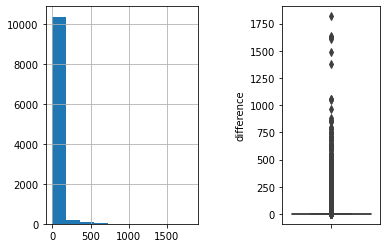

In [1013]:

plt.subplot(121)
hyp_1_view["difference"].hist(bins=10)

plt.subplot(133)
sns.boxplot(y=hyp_1_view["difference"])

Ho = There is no difference in values between Time_Taken_Trip column ( calcuated as od_end_time - od_start_time) and start_scan_to_end_scan column. difference = 0
Ha = There exists significant difference between Time_Taken_Trip and start_scan_to_end_scan
Performing 1 sample t-test and paired t-test to check the hypothesis below:

In [1014]:
t_statistic, p_value = ttest_1samp(hyp_1_view['difference'], 0) # mean taken as 0
alpha = 0.05  # Considering the significance level = 0.05, confidence = 95%
print('t_statistic: ', t_statistic)
print('p-value: ', p_value)
if p_value < alpha:
    print("H0 rejected")
else:
    print("H0 not rejected")

t_statistic:  22.974101812187403
p-value:  4.862586176694111e-114
H0 rejected


In [1015]:
t_statistic, p_value = ttest_rel(hyp_1_view['Time_Taken_Trip'], view['start_scan_to_end_scan'])
alpha = 0.05  
print('t_statistic: ', t_statistic)
print('p-value: ', p_value)
if p_value < alpha:
    print("H0 rejected")
else:
    print("H0 not rejected")

t_statistic:  22.974101812187403
p-value:  4.862586176694111e-114
H0 rejected


#### So, above test and visual analysis proves there ecists significant difference between Time_Taken_Trip and start_scan_to_end_scan columns

### C. Do hypothesis testing/ visual analysis between actual_time aggregated value and OSRM time aggregated value (aggregated values are the values you’ll get after merging the rows on the basis of trip_uuid)

In [1016]:
# Merge and aggregate rows based on Trip_uuid
hyp_2_view=agg_df_with_features.copy()
hyp_2_view = hyp_2_view[['trip_uuid','actual_time', 'osrm_time']] 
hyp_2_view.head()

,trip_uuid,actual_time,osrm_time
0,trip-153671041653548748,1562.0,717.0
1,trip-153671042288605164,143.0,68.0
2,trip-153671043369099517,3347.0,1740.0
3,trip-153671046011330457,59.0,15.0
4,trip-153671052974046625,341.0,117.0


Ho = There is no difference in values between actual_time column and osrm_time column
Ha = There exists significant difference between actual_time and osrm_time
Performing paired t-test to check the hypothesis below:

In [1017]:
t_statistic, p_value = ttest_rel(hyp_2_view['actual_time'], hyp_2_view['osrm_time'])
alpha = 0.05  
print('t_statistic: ', t_statistic)
print('p-value: ', p_value)
if p_value < alpha:
    print("H0 rejected")
else:
    print("H0 not rejected")

t_statistic:  66.83716545248116
p-value:  0.0
H0 rejected


In [1018]:
hyp_2_view['difference'] = hyp_2_view['actual_time'] - hyp_2_view['osrm_time']

<AxesSubplot:ylabel='difference'>

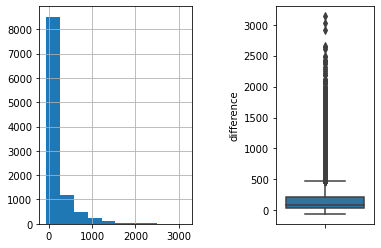

In [1019]:

plt.subplot(121)
hyp_2_view["difference"].hist(bins=10)

plt.subplot(133)
sns.boxplot(y=hyp_2_view["difference"])

#### So, above test and visual analysis proves actual_time aggregated value and OSRM time aggregated value have significant difference

### D. Do hypothesis testing/ visual analysis between actual_time aggregated value and segment actual time aggregated value (aggregated values are the values you’ll get after merging the rows on the basis of trip_uuid)

In [1020]:
hyp_4=agg_df_with_features.copy()
desired_columns = ['trip_uuid','segment_actual_time', 'actual_time']
hyp_4 = hyp_4[desired_columns]
hyp_4

,trip_uuid,segment_actual_time,actual_time
0,trip-153671041653548748,1548.0,1562.0
1,trip-153671042288605164,141.0,143.0
2,trip-153671043369099517,3308.0,3347.0
3,trip-153671046011330457,59.0,59.0
4,trip-153671052974046625,340.0,341.0
...,...,...,...
10649,trip-153800579708680929,46.0,47.0
10650,trip-153800585467019097,296.0,305.0
10651,trip-153800603160412602,184.0,186.0
10652,trip-153800605670819251,623.0,627.0


Ho = There is no difference in values between actual_time column and osrm_time column
Ha = There exists significant difference between actual_time and osrm_time
Performing paired t-test to check the hypothesis below:

In [1021]:
hyp_4['difference'] = hyp_4['actual_time'] - hyp_4['segment_actual_time']
hyp_4

,trip_uuid,segment_actual_time,actual_time,difference
0,trip-153671041653548748,1548.0,1562.0,14.0
1,trip-153671042288605164,141.0,143.0,2.0
2,trip-153671043369099517,3308.0,3347.0,39.0
3,trip-153671046011330457,59.0,59.0,0.0
4,trip-153671052974046625,340.0,341.0,1.0
...,...,...,...,...
10649,trip-153800579708680929,46.0,47.0,1.0
10650,trip-153800585467019097,296.0,305.0,9.0
10651,trip-153800603160412602,184.0,186.0,2.0
10652,trip-153800605670819251,623.0,627.0,4.0


In [1022]:
t_statistic, p_value = ttest_1samp(hyp_4['difference'], 0) # mean taken as 0
alpha = 0.05  # Considering the significance level = 0.05, confidence = 95%
print('t_statistic: ', t_statistic)
print('p-value: ', p_value)
if p_value < alpha:
    print("H0 rejected")
else:
    print("H0 not rejected")

t_statistic:  58.84033929120431
p-value:  0.0
H0 rejected


In [1023]:
t_statistic, p_value = ttest_rel(hyp_4['actual_time'], hyp_4['segment_actual_time'])
alpha = 0.05  
print('t_statistic: ', t_statistic)
print('p-value: ', p_value)
if p_value < alpha:
    print("H0 rejected")
else:
    print("H0 not rejected")

t_statistic:  58.84033929120431
p-value:  0.0
H0 rejected


<AxesSubplot:ylabel='difference'>

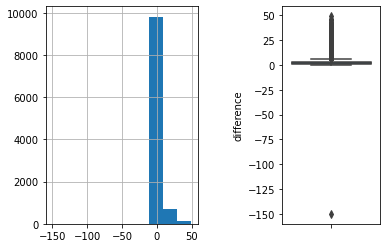

In [1024]:

plt.subplot(121)
hyp_4["difference"].hist(bins=10)

plt.subplot(133)
sns.boxplot(y=hyp_4["difference"])

#### So, above visual analysis proves actual_time aggregated value and segment_actual_time aggregated value have significant difference and hypothesis is rejected

### E. Do hypothesis testing/ visual analysis between osrm distance aggregated value and segment osrm distance aggregated value (aggregated values are the values you’ll get after merging the rows on the basis of trip_uuid)



In [1025]:
hyp_5=agg_df_with_features.copy()
desired_columns = ['trip_uuid','osrm_distance', 'segment_osrm_distance']
hyp_5 = hyp_5[desired_columns]
hyp_5

,trip_uuid,osrm_distance,segment_osrm_distance
0,trip-153671041653548748,991.3523,1320.4733
1,trip-153671042288605164,85.1110,84.1894
2,trip-153671043369099517,2354.0665,2545.2678
3,trip-153671046011330457,19.6800,19.8766
4,trip-153671052974046625,146.7918,146.7919
...,...,...,...
10649,trip-153800579708680929,36.1421,49.7720
10650,trip-153800585467019097,207.8727,207.8731
10651,trip-153800603160412602,111.3083,111.3083
10652,trip-153800605670819251,328.7627,324.6602


Ho = There is no difference in values between actual_time column and osrm_time column
Ha = There exists significant difference between actual_time and osrm_time
Performing paired t-test to check the hypothesis below:

In [1026]:
hyp_5['difference'] = hyp_5['segment_osrm_distance'] - hyp_5['osrm_distance']

In [1027]:
t_statistic, p_value = ttest_1samp(hyp_5['difference'], 0) # mean taken as 0
alpha = 0.05  # Considering the significance level = 0.05, confidence = 95%
print('t_statistic: ', t_statistic)
print('p-value: ', p_value)
if p_value < alpha:
    print("H0 rejected")
else:
    print("H0 not rejected")

t_statistic:  31.899509642300846
p-value:  2.3939923730285044e-213
H0 rejected


In [1028]:
t_statistic, p_value = ttest_rel(hyp_5['segment_osrm_distance'], hyp_5['osrm_distance'])
alpha = 0.05  
print('t_statistic: ', t_statistic)
print('p-value: ', p_value)
if p_value < alpha:
    print("H0 rejected")
else:
    print("H0 not rejected")

t_statistic:  31.899509642300846
p-value:  2.3939923730285044e-213
H0 rejected


In [1029]:
hyp_5['difference'].value_counts()

 0.000000e+00    1635
 1.000000e-04     169
-1.000000e-04     164
-3.552714e-15      98
 1.000000e-04      96
                 ... 
 6.375050e+01       1
 7.410100e+00       1
 1.271480e+01       1
 1.092792e+02       1
-5.057000e+00       1
Name: difference, Length: 6826, dtype: int64

<AxesSubplot:ylabel='difference'>

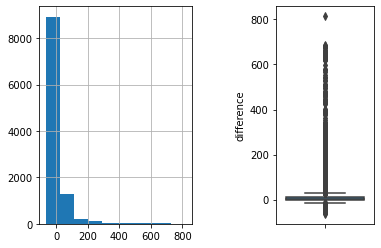

In [1030]:

plt.subplot(121)
hyp_5["difference"].hist(bins=10)

plt.subplot(133)
sns.boxplot(y=hyp_5["difference"])

#### So, above visual analysis proves segment_osrm_distance aggregated value and osrm_distance aggregated value have significant difference, hypothesis rejected

### F. Do hypothesis testing/ visual analysis between osrm time aggregated value and segment osrm time aggregated value (aggregated values are the values you’ll get after merging the rows on the basis of trip_uuid)

In [1031]:
hyp_6=agg_df_with_features.copy()
desired_columns = ['trip_uuid','osrm_time', 'segment_osrm_time']
hyp_6 = hyp_6[desired_columns]
hyp_6

,trip_uuid,osrm_time,segment_osrm_time
0,trip-153671041653548748,717.0,1008.0
1,trip-153671042288605164,68.0,65.0
2,trip-153671043369099517,1740.0,1941.0
3,trip-153671046011330457,15.0,16.0
4,trip-153671052974046625,117.0,115.0
...,...,...,...
10649,trip-153800579708680929,26.0,39.0
10650,trip-153800585467019097,163.0,154.0
10651,trip-153800603160412602,93.0,92.0
10652,trip-153800605670819251,329.0,338.0


Ho = There is no difference in values between actual_time column and osrm_time column
Ha = There exists significant difference between actual_time and osrm_time
Performing paired t-test to check the hypothesis below:

In [1032]:
hyp_6['difference'] = hyp_6['segment_osrm_time'] - hyp_6['osrm_time']

In [1033]:
t_statistic, p_value = ttest_1samp(hyp_6['difference'], 0) # mean taken as 0
alpha = 0.05  # Considering the significance level = 0.05, confidence = 95%
print('t_statistic: ', t_statistic)
print('p-value: ', p_value)
if p_value < alpha:
    print("H0 rejected")
else:
    print("H0 not rejected")

t_statistic:  37.092487527608384
p-value:  2.3642879937239463e-283
H0 rejected


In [1034]:
t_statistic, p_value = ttest_rel(hyp_6['segment_osrm_time'], hyp_6['osrm_time'])
alpha = 0.05  
print('t_statistic: ', t_statistic)
print('p-value: ', p_value)
if p_value < alpha:
    print("H0 rejected")
else:
    print("H0 not rejected")

t_statistic:  37.092487527608384
p-value:  2.3642879937239463e-283
H0 rejected


<AxesSubplot:ylabel='difference'>

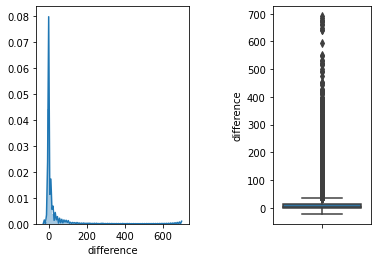

In [1035]:
plt.subplot(121)
sns.distplot(hyp_6["difference"])

plt.subplot(133)
sns.boxplot(y=hyp_6["difference"])

In [1036]:
hyp_6['difference'].value_counts()

 0.0      1781
-1.0      1438
-2.0       717
 1.0       489
 2.0       416
          ... 
 259.0       1
 393.0       1
 660.0       1
 546.0       1
 215.0       1
Name: difference, Length: 346, dtype: int64

 #### So, above visual analysis proves segment_osrm_time aggregated value and osrm_time aggregated value have significant difference, hypothesis rejected

### G. Find outliers in the numerical variables (you might find outliers in almost all the variables), and check it using visual analysis


In [1037]:
agg_df_with_features.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10654 entries, 0 to 10653
Data columns (total 38 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   trip_uuid                       10654 non-null  object        
 1   data                            10654 non-null  object        
 2   trip_creation_time              10654 non-null  datetime64[ns]
 3   route_schedule_uuid             10654 non-null  object        
 4   route_type                      10654 non-null  object        
 5   actual_distance_to_destination  10654 non-null  float64       
 6   actual_time                     10654 non-null  float64       
 7   segment_actual_time             10654 non-null  float64       
 8   osrm_time                       10654 non-null  float64       
 9   segment_osrm_time               10654 non-null  float64       
 10  osrm_distance                   10654 non-null  float64       
 11  se

In [1038]:
num_cols = agg_df_with_features.select_dtypes(include=['float64', 'int64']).columns.tolist()
num_cols

['actual_distance_to_destination',
 'actual_time',
 'segment_actual_time',
 'osrm_time',
 'segment_osrm_time',
 'osrm_distance',
 'segment_osrm_distance',
 'start_scan_to_end_scan',
 'cutoff_factor',
 'factor',
 'segment_factor',
 'Trip_Creation_Year',
 'Trip_Creation_Month',
 'Trip_Creation_Day',
 'Trip_Creation_Hour',
 'Trip_Creation_Minute',
 'Trip_Creation_Second',
 'Speed',
 'Time_Taken_Trip']

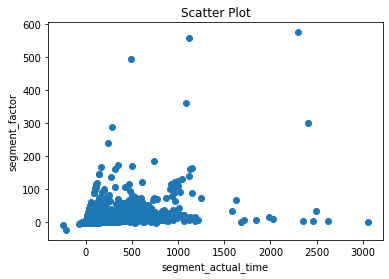

In [1039]:
# Create 1 scatter plot using Matplotlib
plt.scatter(data['segment_actual_time'], data['segment_factor'])
plt.xlabel('segment_actual_time')
plt.ylabel('segment_factor')
plt.title('Scatter Plot')
plt.show()

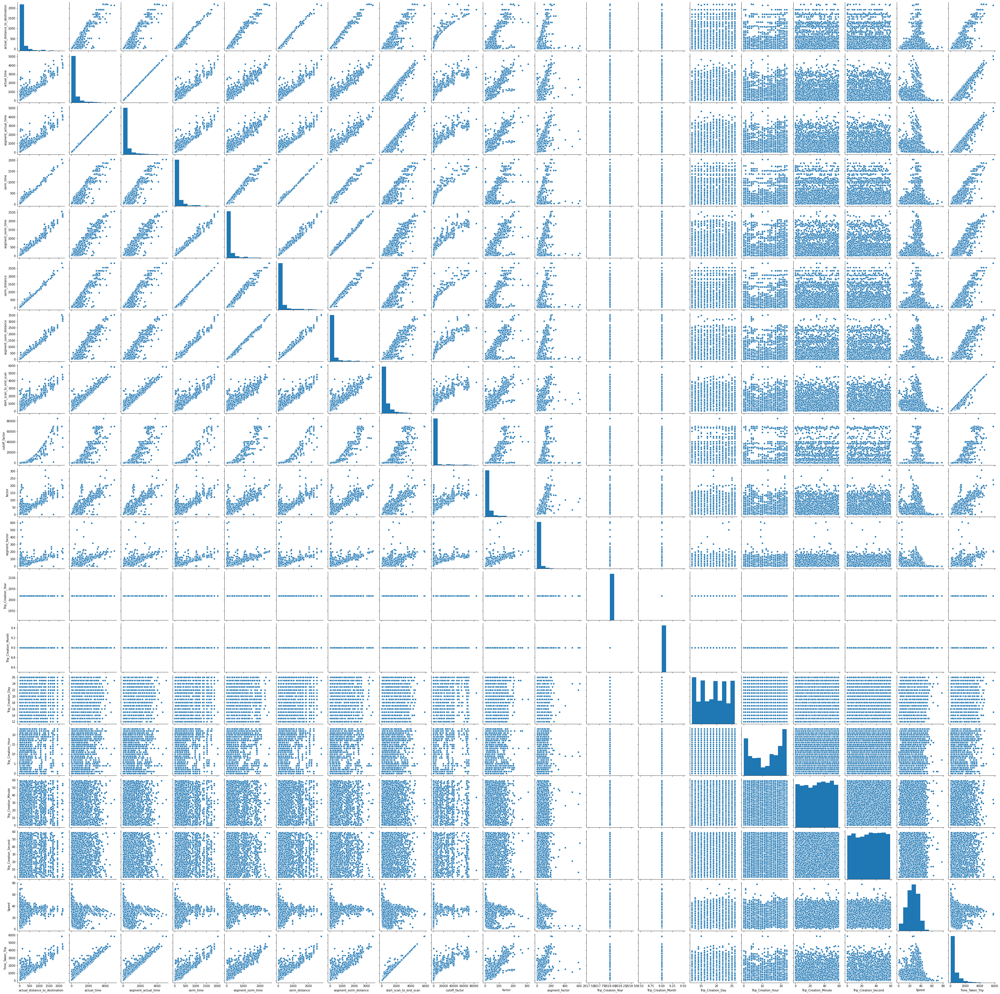

In [1040]:
# Create all scatter plots for all numeric features in pairs where we see outliers
sns.pairplot(agg_df_with_features[num_cols])
plt.show()


### H. Handle the outliers using the IQR method.


In [1041]:
df=agg_df_with_features.copy()

In [1042]:
# Define the outlier treatment
# outlier_treatment = 'median'

# Handle outliers using IQR method
for col in num_cols:
    q1 = df[col].quantile(0.25)
    q3 = df[col].quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    
    median = df[col].median()
    df[col] = np.where((df[col] < lower_bound) | (df[col] > upper_bound), median, df[col])

df

,trip_uuid,data,trip_creation_time,route_schedule_uuid,route_type,actual_distance_to_destination,actual_time,segment_actual_time,osrm_time,segment_osrm_time,osrm_distance,segment_osrm_distance,start_scan_to_end_scan,source_center,source_name,destination_center,destination_name,is_cutoff,cutoff_factor,cutoff_timestamp,factor,segment_factor,Destination_State,Destination_City,Destination_Place,Destination_Code,Source_State,Source_City,Source_Place,Source_Code,Trip_Creation_Year,Trip_Creation_Month,Trip_Creation_Day,Trip_Creation_Hour,Trip_Creation_Minute,Trip_Creation_Second,Speed,Time_Taken_Trip
0,trip-153671041653548748,training,2018-09-12 00:00:16.535741,thanos::sroute:d7c989ba-a29b-4a0b-b2f4-288cdc60074b,FTL,51.942531,157.0,155.0,62.0,68.0,70.2954,73.53655,287.0,IND462022AAA,Bhopal_Trnsport_H (Madhya Pradesh),IND000000ACB,Gurgaon_Bilaspur_HB (Haryana),False,132.0,2018-09-13 12:40:43,11.068920,11.329801,Haryana,Gurgaon,Bilaspur,HB,Madhya Pradesh,Bhopal,Trnsport,H,2018.0,9.0,12.0,0.0,0.0,16.0,31.679879,294.904157
1,trip-153671042288605164,training,2018-09-12 00:00:22.886430,thanos::sroute:3a1b0ab2-bb0b-4c53-8c59-eb2a2c0d68b9,Carting,73.186911,143.0,141.0,68.0,65.0,85.1110,84.18940,180.0,IND572101AAA,Tumkur_Veersagr_I (Karnataka),IND562101AAA,Chikblapur_ShntiSgr_D (Karnataka),False,234.0,2018-09-12 02:41:24,16.495132,22.865079,Karnataka,Chikblapur,ShntiSgr,D,Karnataka,Tumkur,Veersagr,I,2018.0,9.0,12.0,0.0,0.0,22.0,30.707795,181.611874
2,trip-153671043369099517,training,2018-09-12 00:00:33.691250,thanos::sroute:de5e208e-7641-45e6-8100-4d9fb1e5720d,FTL,51.942531,157.0,155.0,62.0,68.0,70.2954,73.53655,287.0,IND562132AAA,Bengaluru_Nelmngla_H (Karnataka),IND160002AAC,Chandigarh_Mehmdpur_H (Punjab),False,132.0,2018-09-14 16:54:36,11.068920,11.329801,Punjab,Chandigarh,Mehmdpur,H,Karnataka,Bengaluru,Nelmngla,H,2018.0,9.0,12.0,0.0,0.0,33.0,34.551615,294.904157
3,trip-153671046011330457,training,2018-09-12 00:01:00.113710,thanos::sroute:f0176492-a679-4597-8332-bbd1c7f9f442,Carting,17.175274,59.0,59.0,15.0,16.0,19.6800,19.87660,100.0,IND400072AAB,Mumbai Hub (Maharashtra),IND401104AAA,Mumbai_MiraRd_IP (Maharashtra),False,26.0,2018-09-12 01:13:56,6.488889,7.698413,Maharashtra,Mumbai,MiraRd,IP,Maharashtra,Maharashtra,Maharashtra,Other_Mah,2018.0,9.0,12.0,0.0,1.0,0.0,17.466381,100.494935
4,trip-153671052974046625,training,2018-09-12 00:02:09.740725,thanos::sroute:d9f07b12-65e0-4f3b-bec8-df0613461b0f,FTL,127.448500,341.0,340.0,117.0,115.0,146.7918,146.79190,717.0,IND583101AAA,Bellary_Dc (Karnataka),IND583101AAA,Bellary_Dc (Karnataka),False,236.0,2018-09-12 05:17:30,18.017463,23.553097,Karnataka,Bellary,Other_Bellary,Dc,Karnataka,Bellary,Other_Bellary,Dc,2018.0,9.0,12.0,0.0,2.0,9.0,22.424956,718.349042
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10649,trip-153800579708680929,training,2018-09-26 23:49:57.087036,thanos::sroute:233c5ce2-a1e2-4550-945c-28c357cafe57,Carting,33.876461,47.0,46.0,26.0,39.0,36.1421,49.77200,107.0,IND390022AAA,Vadodara_Karelibaug_DPC (Gujarat),IND388320AAA,Anand_Vaghasi_IP (Gujarat),False,87.0,2018-09-27 01:07:55,4.951515,5.517857,Gujarat,Anand,Vaghasi,IP,Gujarat,Vadodara,Karelibaug,DPC,2018.0,9.0,26.0,23.0,49.0,57.0,43.246545,107.073021
10650,trip-153800585467019097,training,2018-09-26 23:50:54.670423,thanos::sroute:9e13f8b8-837d-4541-8c0e-4475cfafc0bf,Carting,174.336373,305.0,296.0,163.0,154.0,207.8727,207.87310,459.0,IND630561AAA,Sivaganga_Wardno3_D (Tamil Nadu),IND630561AAA,Sivaganga_Wardno3_D (Tamil Nadu),False,731.0,2018-09-27 06:37:27,38.672625,41.059957,Tamil Nadu,Sivaganga,Wardno3,D,Tamil Nadu,Sivaganga,Wardno3,D,2018.0,9.0,26.0,23.0,50.0,54.0,34.295680,461.677957
10651,trip-153800603160412602,training,2018-09-26 23:53:51.604388,thanos::sroute:463e331a-fd38-44d5-b1f7-e2fa024b2739,FTL,103.789477,186.0,184.0,93.0,92.0,111.3083,111.30830,230.0,IND424006AAA,Dhule_MIDCAvdn_I (Maharashtra),IND423105AAA,Malega

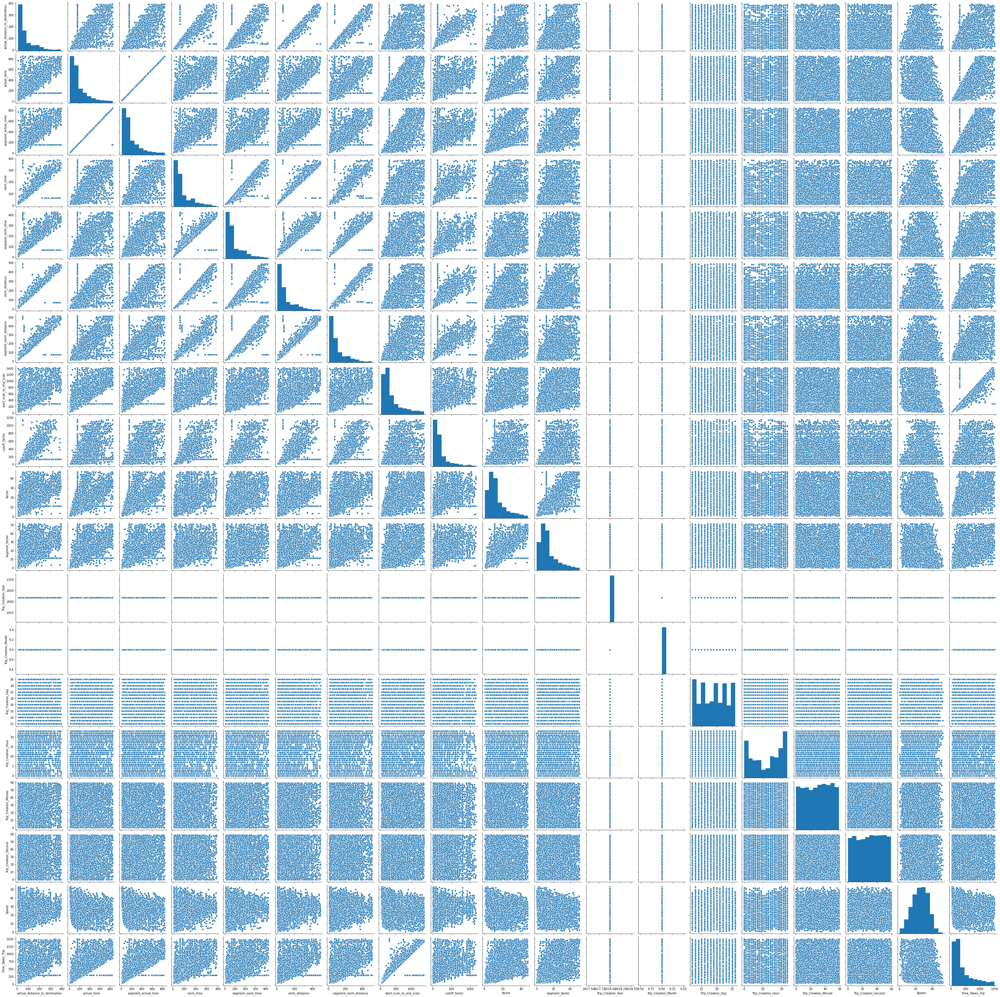

In [1043]:
# Create all scatter plots for all numeric features in pairs where outliers are removed
sns.pairplot(df[num_cols])
plt.show()


### I. Do one-hot encoding of categorical variables (like route_type)



In [1044]:
cat_cols=agg_df_with_features.dtypes=="object"
cat_cols= list(cat_cols[cat_cols].index)
cat_cols

['trip_uuid',
 'data',
 'route_schedule_uuid',
 'route_type',
 'source_center',
 'source_name',
 'destination_center',
 'destination_name',
 'Destination_State',
 'Destination_City',
 'Destination_Place',
 'Destination_Code',
 'Source_State',
 'Source_City',
 'Source_Place',
 'Source_Code']

In [1045]:
agg_df_with_features['route_type'].value_counts()

Carting    6245
FTL        4409
Name: route_type, dtype: int64

In [1046]:
agg_df_with_features['data'].value_counts()

training    10654
Name: data, dtype: int64

In [1047]:
agg_df_with_features['Destination_Code'].value_counts()

H               2108
HB              1839
D               1238
I               1055
DPC              656
                ... 
Old City           1
Shahdara           1
IND852118A1B       1
IND505326AAB       1
Other_Pun          1
Name: Destination_Code, Length: 69, dtype: int64

In [1048]:
# Perform one-hot encoding using get_dummies()
encoded_df = pd.get_dummies(agg_df_with_features['route_type'], prefix='route')
encoded_df2 = pd.get_dummies(agg_df_with_features['data'], prefix='data')

# Concatenate the original DataFrame with the encoded DataFrame
df_encoded = pd.concat([agg_df_with_features, encoded_df,encoded_df2], axis=1)
df_encoded

,trip_uuid,data,trip_creation_time,route_schedule_uuid,route_type,actual_distance_to_destination,actual_time,segment_actual_time,osrm_time,segment_osrm_time,osrm_distance,segment_osrm_distance,start_scan_to_end_scan,source_center,source_name,destination_center,destination_name,is_cutoff,cutoff_factor,cutoff_timestamp,factor,segment_factor,Destination_State,Destination_City,Destination_Place,Destination_Code,Source_State,Source_City,Source_Place,Source_Code,Trip_Creation_Year,Trip_Creation_Month,Trip_Creation_Day,Trip_Creation_Hour,Trip_Creation_Minute,Trip_Creation_Second,Speed,Time_Taken_Trip,route_Carting,route_FTL,data_training
0,trip-153671041653548748,training,2018-09-12 00:00:16.535741,thanos::sroute:d7c989ba-a29b-4a0b-b2f4-288cdc60074b,FTL,824.732854,1562.0,1548.0,717.0,1008.0,991.3523,1320.4733,2259.0,IND462022AAA,Bhopal_Trnsport_H (Madhya Pradesh),IND000000ACB,Gurgaon_Bilaspur_HB (Haryana),False,8809,2018-09-13 12:40:43,76.520099,78.892604,Haryana,Gurgaon,Bilaspur,HB,Madhya Pradesh,Bhopal,Trnsport,H,2018,9,12,0,0,16,31.679879,2260.109800,0,1,1
1,trip-153671042288605164,training,2018-09-12 00:00:22.886430,thanos::sroute:3a1b0ab2-bb0b-4c53-8c59-eb2a2c0d68b9,Carting,73.186911,143.0,141.0,68.0,65.0,85.1110,84.1894,180.0,IND572101AAA,Tumkur_Veersagr_I (Karnataka),IND562101AAA,Chikblapur_ShntiSgr_D (Karnataka),False,234,2018-09-12 02:41:24,16.495132,22.865079,Karnataka,Chikblapur,ShntiSgr,D,Karnataka,Tumkur,Veersagr,I,2018,9,12,0,0,22,30.707795,181.611874,1,0,1
2,trip-153671043369099517,training,2018-09-12 00:00:33.691250,thanos::sroute:de5e208e-7641-45e6-8100-4d9fb1e5720d,FTL,1927.404273,3347.0,3308.0,1740.0,1941.0,2354.0665,2545.2678,3933.0,IND562132AAA,Bengaluru_Nelmngla_H (Karnataka),IND160002AAC,Chandigarh_Mehmdpur_H (Punjab),False,67750,2018-09-14 16:54:36,151.622912,159.940285,Punjab,Chandigarh,Mehmdpur,H,Karnataka,Bengaluru,Nelmngla,H,2018,9,12,0,0,33,34.551615,3934.362520,0,1,1
3,trip-153671046011330457,training,2018-09-12 00:01:00.113710,thanos::sroute:f0176492-a679-4597-8332-bbd1c7f9f442,Carting,17.175274,59.0,59.0,15.0,16.0,19.6800,19.8766,100.0,IND400072AAB,Mumbai Hub (Maharashtra),IND401104AAA,Mumbai_MiraRd_IP (Maharashtra),False,26,2018-09-12 01:13:56,6.488889,7.698413,Maharashtra,Mumbai,MiraRd,IP,Maharashtra,Maharashtra,Maharashtra,Other_Mah,2018,9,12,0,1,0,17.466381,100.494935,1,0,1
4,trip-153671052974046625,training,2018-09-12 00:02:09.740725,thanos::sroute:d9f07b12-65e0-4f3b-bec8-df0613461b0f,FTL,127.448500,341.0,340.0,117.0,115.0,146.7918,146.7919,717.0,IND583101AAA,Bellary_Dc (Karnataka),IND583101AAA,Bellary_Dc (Karnataka),False,236,2018-09-12 05:17:30,18.017463,23.553097,Karnataka,Bellary,Other_Bellary,Dc,Karnataka,Bellary,Other_Bellary,Dc,2018,9,12,0,2,9,22.424956,718.349042,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10649,trip-153800579708680929,training,2018-09-26 23:49:57.087036,thanos::sroute:233c5ce2-a1e2-4550-945c-28c357cafe57,Carting,33.876461,47.0,46.0,26.0,39.0,36.1421,49.7720,107.0,IND390022AAA,Vadodara_Karelibaug_DPC (Gujarat),IND388320AAA,Anand_Vaghasi_IP (Gujarat),False,87,2018-09-27 01:07:55,4.951515,5.517857,Gujarat,Anand,Vaghasi,IP,Gujarat,Vadodara,Karelibaug,DPC,2018,9,26,23,49,57,43.246545,107.073021,1,0,1
10650,trip-153800585467019097,training,2018-09-26 23:50:54.670423,thanos::sroute:9e13f8b8-837d-4541-8c0e-4475cfafc0bf,Carting,174.336373,305.0,296.0,163.0,154.0,207.8727,207.8731,459.0,IND630561AAA,Sivaganga_Wardno3_D (Tamil Nadu),IND630561AAA,Sivaganga_Wardno3_D (Tamil Nadu),False,731,2018-09-27 06:37:27,38.672625,41.059957,Tamil Nadu,Sivaganga,Wardno3,D,Tamil Nadu,Sivaganga,Wardno3,D,2018,9,26,23,50,54,34.295680,461.677957,1,0,1
10651,trip-153800603160412602,training,2018-09-26 23:53:51.604388,thanos::sroute:463e331a-fd38-44d5-b1f7-e2fa024b2739,FTL,103.789477,186.0,184.0,93.0,92.0,111.3083,111.3083,230.0,IND424006AAA,Dhule_MIDCAvdn_I (Maharashtra),IND

In [1049]:
agg_df_with_features_encoded=df_encoded.copy()

#### We can do one hot encoding only for route_type & data as all other categorical columns have higher no of unique values, so we can do Label encoding

In [1050]:
df=agg_df_with_features_encoded.copy()

In [1051]:
# All categorical list except route_type and data (one hot encoding applied already)
categorical_columns = [col for col in cat_cols if col not in ['route_type', 'data']]
print(categorical_columns)

# Perform label encoding on all categorical columns
label_encoder = LabelEncoder()
df[categorical_columns] = df[categorical_columns].apply(lambda x: label_encoder.fit_transform(x))

df

['trip_uuid', 'route_schedule_uuid', 'source_center', 'source_name', 'destination_center', 'destination_name', 'Destination_State', 'Destination_City', 'Destination_Place', 'Destination_Code', 'Source_State', 'Source_City', 'Source_Place', 'Source_Code']


,trip_uuid,data,trip_creation_time,route_schedule_uuid,route_type,actual_distance_to_destination,actual_time,segment_actual_time,osrm_time,segment_osrm_time,osrm_distance,segment_osrm_distance,start_scan_to_end_scan,source_center,source_name,destination_center,destination_name,is_cutoff,cutoff_factor,cutoff_timestamp,factor,segment_factor,Destination_State,Destination_City,Destination_Place,Destination_Code,Source_State,Source_City,Source_Place,Source_Code,Trip_Creation_Year,Trip_Creation_Month,Trip_Creation_Day,Trip_Creation_Hour,Trip_Creation_Minute,Trip_Creation_Second,Speed,Time_Taken_Trip,route_Carting,route_FTL,data_training
0,0,training,2018-09-12 00:00:16.535741,1137,FTL,824.732854,1562.0,1548.0,717.0,1008.0,991.3523,1320.4733,2259.0,356,117,5,314,False,8809,2018-09-13 12:40:43,76.520099,78.892604,10,231,73,17,20,91,579,15,2018,9,12,0,0,16,31.679879,2260.109800,0,1,1
1,1,training,2018-09-12 00:00:22.886430,281,Carting,73.186911,143.0,141.0,68.0,65.0,85.1110,84.1894,180.0,484,729,550,191,False,234,2018-09-12 02:41:24,16.495132,22.865079,21,141,586,7,18,552,600,20,2018,9,12,0,0,22,30.707795,181.611874,1,0,1
2,2,training,2018-09-12 00:00:33.691250,1174,FTL,1927.404273,3347.0,3308.0,1740.0,1941.0,2354.0665,2545.2678,3933.0,477,92,93,165,False,67750,2018-09-14 16:54:36,151.622912,159.940285,30,134,342,16,18,73,328,15,2018,9,12,0,0,33,34.551615,3934.362520,0,1,1
3,3,training,2018-09-12 00:01:00.113710,1284,Carting,17.175274,59.0,59.0,15.0,16.0,19.6800,19.8766,100.0,268,510,326,569,False,26,2018-09-12 01:13:56,6.488889,7.698413,24,432,351,30,21,338,256,42,2018,9,12,0,1,0,17.466381,100.494935,1,0,1
4,4,training,2018-09-12 00:02:09.740725,1151,FTL,127.448500,341.0,340.0,117.0,115.0,146.7918,146.7919,717.0,507,79,588,79,False,236,2018-09-12 05:17:30,18.017463,23.553097,21,74,416,11,18,71,349,10,2018,9,12,0,2,9,22.424956,718.349042,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10649,10649,training,2018-09-26 23:49:57.087036,175,Carting,33.876461,47.0,46.0,26.0,39.0,36.1421,49.7720,107.0,250,743,294,29,False,87,2018-09-27 01:07:55,4.951515,5.517857,9,26,658,30,9,566,199,8,2018,9,26,23,49,57,43.246545,107.073021,1,0,1
10650,10650,training,2018-09-26 23:50:54.670423,803,Carting,174.336373,305.0,296.0,163.0,154.0,207.8727,207.8731,459.0,565,677,641,771,False,731,2018-09-27 06:37:27,38.672625,41.059957,32,604,689,7,28,509,615,6,2018,9,26,23,50,54,34.295680,461.677957,1,0,1
10651,10651,training,2018-09-26 23:53:51.604388,332,FTL,103.789477,186.0,184.0,93.0,92.0,111.3083,111.3083,230.0,329,233,376,519,False,257,2018-09-27 02:11:56,11.673230,15.984706,24,396,540,7,21,156,247,20,2018,9,26,23,53,51,33.480476,231.177157,0,1,1
10652,10652,training,2018-09-26 23:54:16.708455,1364,FTL,235.890506,627.0,623.0,329.0,338.0,328.7627,324.6602,689.0,106,467,125,513,False,542,2018-09-27 14:20:42,26.666180,28.521912,35,391,9,21,30,340,7,20,2018,9,26,23,54,16,22.573254,931.207509,0,1,1


In [1052]:
agg_df_with_features_encoded=df.copy()
agg_df_with_features_encoded

,trip_uuid,data,trip_creation_time,route_schedule_uuid,route_type,actual_distance_to_destination,actual_time,segment_actual_time,osrm_time,segment_osrm_time,osrm_distance,segment_osrm_distance,start_scan_to_end_scan,source_center,source_name,destination_center,destination_name,is_cutoff,cutoff_factor,cutoff_timestamp,factor,segment_factor,Destination_State,Destination_City,Destination_Place,Destination_Code,Source_State,Source_City,Source_Place,Source_Code,Trip_Creation_Year,Trip_Creation_Month,Trip_Creation_Day,Trip_Creation_Hour,Trip_Creation_Minute,Trip_Creation_Second,Speed,Time_Taken_Trip,route_Carting,route_FTL,data_training
0,0,training,2018-09-12 00:00:16.535741,1137,FTL,824.732854,1562.0,1548.0,717.0,1008.0,991.3523,1320.4733,2259.0,356,117,5,314,False,8809,2018-09-13 12:40:43,76.520099,78.892604,10,231,73,17,20,91,579,15,2018,9,12,0,0,16,31.679879,2260.109800,0,1,1
1,1,training,2018-09-12 00:00:22.886430,281,Carting,73.186911,143.0,141.0,68.0,65.0,85.1110,84.1894,180.0,484,729,550,191,False,234,2018-09-12 02:41:24,16.495132,22.865079,21,141,586,7,18,552,600,20,2018,9,12,0,0,22,30.707795,181.611874,1,0,1
2,2,training,2018-09-12 00:00:33.691250,1174,FTL,1927.404273,3347.0,3308.0,1740.0,1941.0,2354.0665,2545.2678,3933.0,477,92,93,165,False,67750,2018-09-14 16:54:36,151.622912,159.940285,30,134,342,16,18,73,328,15,2018,9,12,0,0,33,34.551615,3934.362520,0,1,1
3,3,training,2018-09-12 00:01:00.113710,1284,Carting,17.175274,59.0,59.0,15.0,16.0,19.6800,19.8766,100.0,268,510,326,569,False,26,2018-09-12 01:13:56,6.488889,7.698413,24,432,351,30,21,338,256,42,2018,9,12,0,1,0,17.466381,100.494935,1,0,1
4,4,training,2018-09-12 00:02:09.740725,1151,FTL,127.448500,341.0,340.0,117.0,115.0,146.7918,146.7919,717.0,507,79,588,79,False,236,2018-09-12 05:17:30,18.017463,23.553097,21,74,416,11,18,71,349,10,2018,9,12,0,2,9,22.424956,718.349042,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10649,10649,training,2018-09-26 23:49:57.087036,175,Carting,33.876461,47.0,46.0,26.0,39.0,36.1421,49.7720,107.0,250,743,294,29,False,87,2018-09-27 01:07:55,4.951515,5.517857,9,26,658,30,9,566,199,8,2018,9,26,23,49,57,43.246545,107.073021,1,0,1
10650,10650,training,2018-09-26 23:50:54.670423,803,Carting,174.336373,305.0,296.0,163.0,154.0,207.8727,207.8731,459.0,565,677,641,771,False,731,2018-09-27 06:37:27,38.672625,41.059957,32,604,689,7,28,509,615,6,2018,9,26,23,50,54,34.295680,461.677957,1,0,1
10651,10651,training,2018-09-26 23:53:51.604388,332,FTL,103.789477,186.0,184.0,93.0,92.0,111.3083,111.3083,230.0,329,233,376,519,False,257,2018-09-27 02:11:56,11.673230,15.984706,24,396,540,7,21,156,247,20,2018,9,26,23,53,51,33.480476,231.177157,0,1,1
10652,10652,training,2018-09-26 23:54:16.708455,1364,FTL,235.890506,627.0,623.0,329.0,338.0,328.7627,324.6602,689.0,106,467,125,513,False,542,2018-09-27 14:20:42,26.666180,28.521912,35,391,9,21,30,340,7,20,2018,9,26,23,54,16,22.573254,931.207509,0,1,1


### J. Normalize/ Standardize the numerical features using MinMaxScaler or StandardScaler.

In [1053]:
agg_df_with_features_encoded.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10654 entries, 0 to 10653
Data columns (total 41 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   trip_uuid                       10654 non-null  int64         
 1   data                            10654 non-null  object        
 2   trip_creation_time              10654 non-null  datetime64[ns]
 3   route_schedule_uuid             10654 non-null  int64         
 4   route_type                      10654 non-null  object        
 5   actual_distance_to_destination  10654 non-null  float64       
 6   actual_time                     10654 non-null  float64       
 7   segment_actual_time             10654 non-null  float64       
 8   osrm_time                       10654 non-null  float64       
 9   segment_osrm_time               10654 non-null  float64       
 10  osrm_distance                   10654 non-null  float64       
 11  se

In [1054]:
num_cols = agg_df_with_features_encoded.select_dtypes(include=['float64', 'int64']).columns.tolist()
num_cols= list(num_cols)
num_cols

['trip_uuid',
 'route_schedule_uuid',
 'actual_distance_to_destination',
 'actual_time',
 'segment_actual_time',
 'osrm_time',
 'segment_osrm_time',
 'osrm_distance',
 'segment_osrm_distance',
 'start_scan_to_end_scan',
 'source_center',
 'source_name',
 'destination_center',
 'destination_name',
 'cutoff_factor',
 'factor',
 'segment_factor',
 'Destination_State',
 'Destination_City',
 'Destination_Place',
 'Destination_Code',
 'Source_State',
 'Source_City',
 'Source_Place',
 'Source_Code',
 'Trip_Creation_Year',
 'Trip_Creation_Month',
 'Trip_Creation_Day',
 'Trip_Creation_Hour',
 'Trip_Creation_Minute',
 'Trip_Creation_Second',
 'Speed',
 'Time_Taken_Trip']

In [1055]:
df=agg_df_with_features_encoded.copy()

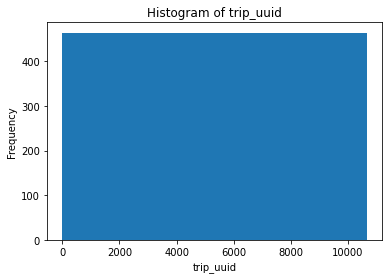

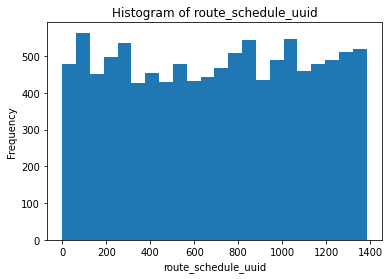

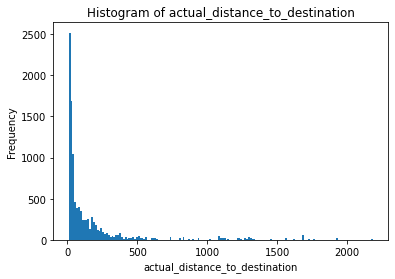

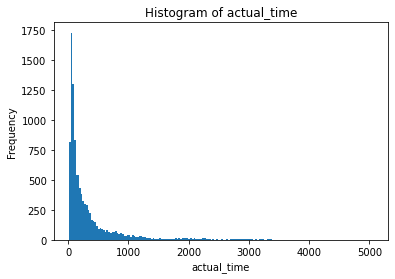

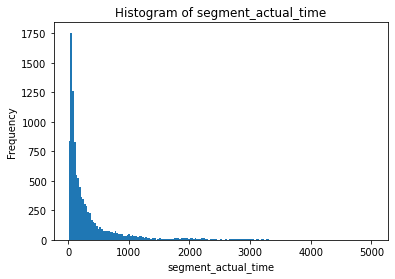

...

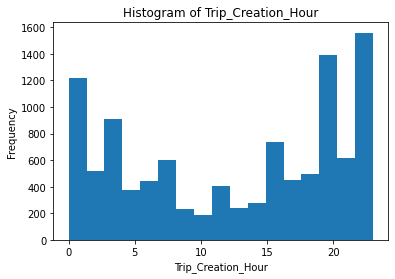

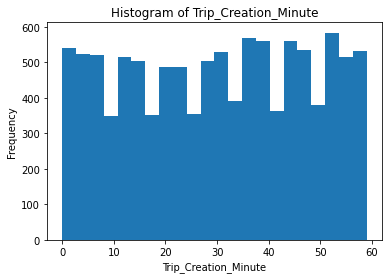

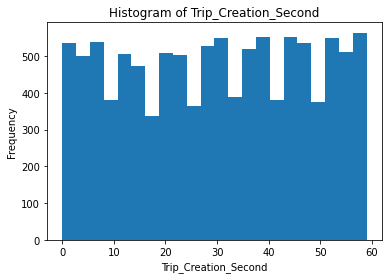

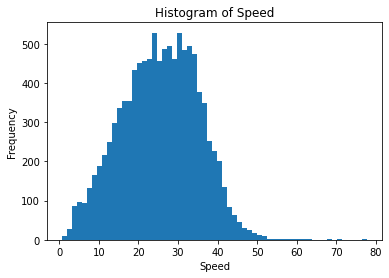

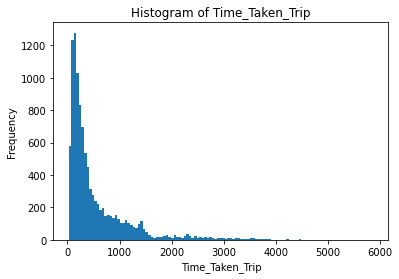

In [1056]:
# Create histograms for numeric feature columns
for col in num_cols:
    plt.hist(df[col], bins='auto')  # 'auto' calculates the optimal number of bins
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.title(f'Histogram of {col}')
    plt.show()

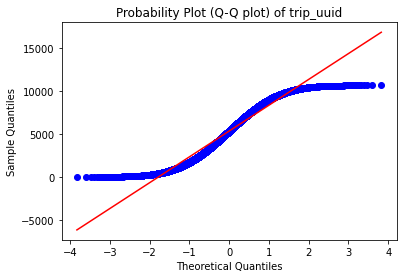

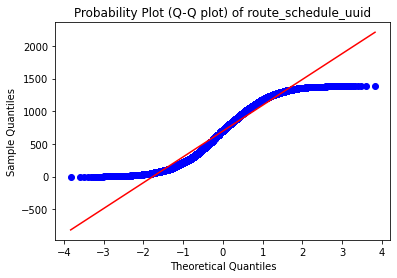

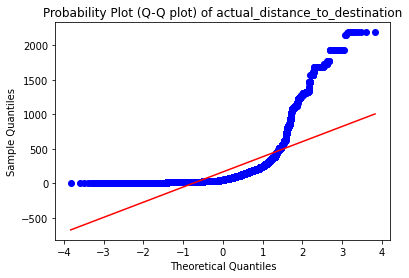

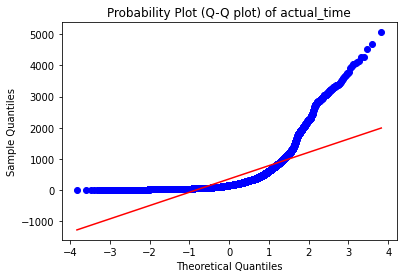

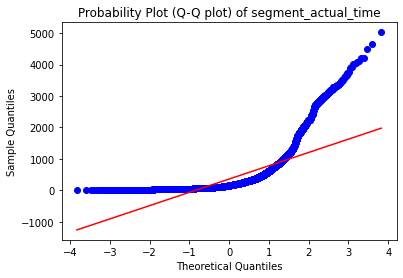

...

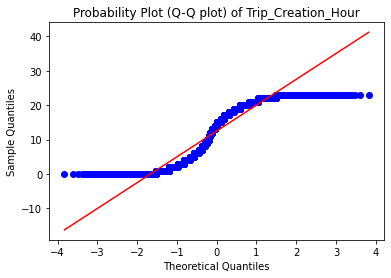

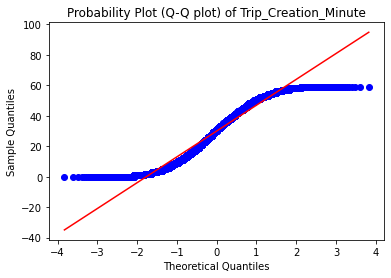

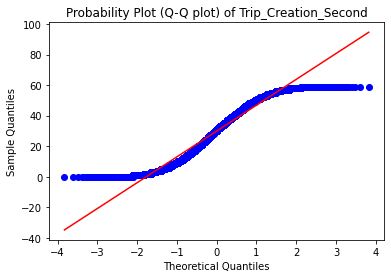

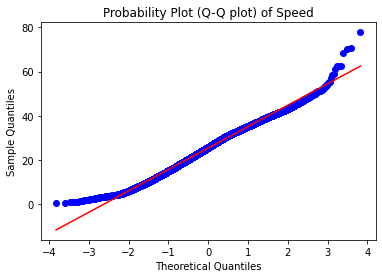

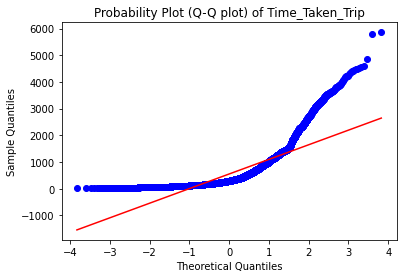

In [1057]:
# Probability plot (Q-Q plot)
for col in num_cols:
    stats.probplot(df[col], dist="norm", plot=plt)
    plt.xlabel('Theoretical Quantiles')
    plt.ylabel('Sample Quantiles')
    plt.title(f'Probability Plot (Q-Q plot) of {col}')
    plt.show()

In [1058]:
from sklearn.preprocessing import MinMaxScaler, StandardScaler

gaussian_cols = []
for col in num_cols:
    _, p_value = shapiro(df[col])
    if p_value > 0.05:  # Assuming a significance level of 0.05
        gaussian_cols.append(col)
gaussian_cols

/Users/jaspreetsingh/opt/anaconda3/lib/python3.8/site-packages/scipy/stats/morestats.py:1681: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
/Users/jaspreetsingh/opt/anaconda3/lib/python3.8/site-packages/scipy/stats/morestats.py:1678: UserWarning: Input data for shapiro has range zero. The results may not be accurate.
  warnings.warn("Input data for shapiro has range zero. The results "


['Trip_Creation_Year', 'Trip_Creation_Month']

In [1059]:

# Specify the columns for StandardScaler
minmax_cols = list(set(num_cols) - set(gaussian_cols))
minmax_cols


['Time_Taken_Trip',
 'Destination_State',
 'Speed',
 'Trip_Creation_Second',
 'destination_name',
 'Destination_Place',
 'Trip_Creation_Minute',
 'cutoff_factor',
 'actual_time',
 'trip_uuid',
 'source_name',
 'segment_osrm_time',
 'Destination_City',
 'Source_Place',
 'Trip_Creation_Hour',
 'Source_City',
 'start_scan_to_end_scan',
 'route_schedule_uuid',
 'factor',
 'Trip_Creation_Day',
 'segment_osrm_distance',
 'Source_Code',
 'segment_actual_time',
 'Source_State',
 'segment_factor',
 'Destination_Code',
 'osrm_distance',
 'destination_center',
 'source_center',
 'actual_distance_to_destination',
 'osrm_time']

In [1060]:
# Normalize the numerical features using MinMaxScaler
min_max_scaler = MinMaxScaler()
df[minmax_cols] = min_max_scaler.fit_transform(df[minmax_cols])

# Standardize the numerical features using StandardScaler
standard_scaler = StandardScaler()
df[gaussian_cols] = standard_scaler.fit_transform(df[gaussian_cols])

df


,trip_uuid,data,trip_creation_time,route_schedule_uuid,route_type,actual_distance_to_destination,actual_time,segment_actual_time,osrm_time,segment_osrm_time,osrm_distance,segment_osrm_distance,start_scan_to_end_scan,source_center,source_name,destination_center,destination_name,is_cutoff,cutoff_factor,cutoff_timestamp,factor,segment_factor,Destination_State,Destination_City,Destination_Place,Destination_Code,Source_State,Source_City,Source_Place,Source_Code,Trip_Creation_Year,Trip_Creation_Month,Trip_Creation_Day,Trip_Creation_Hour,Trip_Creation_Minute,Trip_Creation_Second,Speed,Time_Taken_Trip,route_Carting,route_FTL,data_training
0,0.000000,training,2018-09-12 00:00:16.535741,0.821532,FTL,0.374687,0.307083,0.306497,0.350791,0.391474,0.347060,0.373134,0.382811,0.467806,0.153745,0.005862,0.368113,False,0.103837,2018-09-13 12:40:43,0.247452,0.129781,0.270270,0.342730,0.102672,0.250000,0.62500,0.156357,0.919048,0.245902,0.0,0.0,0.0,0.0,0.000000,0.271186,0.401941,0.382900,0,1,1
1,0.000094,training,2018-09-12 00:00:22.886430,0.203035,Carting,0.029482,0.026316,0.026106,0.030138,0.022683,0.026866,0.021373,0.026879,0.636005,0.957950,0.644783,0.223916,False,0.002655,2018-09-12 02:41:24,0.051636,0.037828,0.567568,0.209199,0.824191,0.102941,0.56250,0.948454,0.952381,0.327869,0.0,0.0,0.0,0.0,0.000000,0.372881,0.389321,0.027074,1,0,1
2,0.000188,training,2018-09-12 00:00:33.691250,0.848266,FTL,0.881175,0.660269,0.657234,0.856225,0.756355,0.828536,0.721625,0.669406,0.626807,0.120894,0.109027,0.193435,False,0.799323,2018-09-14 16:54:36,0.492455,0.262796,0.810811,0.198813,0.481013,0.235294,0.56250,0.125430,0.520635,0.245902,0.0,0.0,0.0,0.0,0.000000,0.559322,0.439223,0.669522,0,1,1
3,0.000282,training,2018-09-12 00:01:00.113710,0.927746,Carting,0.003754,0.009695,0.009765,0.003953,0.003520,0.003748,0.003074,0.013183,0.352168,0.670171,0.382181,0.667057,False,0.000201,2018-09-12 01:13:56,0.018993,0.012937,0.648649,0.640950,0.493671,0.441176,0.65625,0.580756,0.406349,0.688525,0.0,0.0,0.0,0.0,0.016949,0.000000,0.217418,0.013188,1,0,1
4,0.000375,training,2018-09-12 00:02:09.740725,0.831647,FTL,0.054406,0.065493,0.065763,0.054348,0.042237,0.048659,0.039185,0.118815,0.666229,0.103811,0.689332,0.092614,False,0.002679,2018-09-12 05:17:30,0.056602,0.038958,0.567568,0.109792,0.585091,0.161765,0.56250,0.121993,0.553968,0.163934,0.0,0.0,0.0,0.0,0.033898,0.152542,0.281791,0.118960,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10649,0.999625,training,2018-09-26 23:49:57.087036,0.126445,Carting,0.011425,0.007321,0.007174,0.009387,0.012515,0.009564,0.011580,0.014381,0.328515,0.976347,0.344666,0.033998,False,0.000920,2018-09-27 01:07:55,0.013978,0.009358,0.243243,0.038576,0.925457,0.441176,0.28125,0.972509,0.315873,0.131148,0.0,0.0,1.0,1.0,0.830508,0.966102,0.552102,0.014314,1,0,1
10650,0.999718,training,2018-09-26 23:50:54.670423,0.580202,Carting,0.075942,0.058370,0.056995,0.077075,0.057489,0.070240,0.056565,0.074645,0.742444,0.889619,0.751465,0.903869,False,0.008519,2018-09-27 06:37:27,0.123984,0.067690,0.864865,0.896142,0.969058,0.102941,0.87500,0.874570,0.976190,0.098361,0.0,0.0,1.0,1.0,0.847458,0.915254,0.435900,0.075020,1,0,1
10651,0.999812,training,2018-09-26 23:53:51.604388,0.239884,FTL,0.043538,0.034824,0.034675,0.042490,0.033242,0.036122,0.029089,0.035439,0.432326,0.306176,0.440797,0.608441,False,0.002926,2018-09-27 02:11:56,0.035906,0.026536,0.648649,0.587537,0.759494,0.102941,0.65625,0.268041,0.392063,0.327869,0.0,0.0,1.0,1.0,0.898305,0.864407,0.425317,0.035560,0,1,1
10652,0.999906,training,2018-09-26 23:54:16.708455,0.985549,FTL,0.104216,0.122082,0.122160,0.159091,0.129449,0.112953,0.089794,0.114022,0.139290,0.613666,0.146542,0.601407,False,0.006289,2018-09-27 14:20:42,0.084817,0.047112,0.945946,0.580119,0.012658,0.308824,0.93750,0.584192,0.011111,0.327869,0.0,0.0,1.0,1.0,0.915254,0.271186,0.283717,0.155401,0,1,1


In [1061]:
final_df = df.copy()
final_df

,trip_uuid,data,trip_creation_time,route_schedule_uuid,route_type,actual_distance_to_destination,actual_time,segment_actual_time,osrm_time,segment_osrm_time,osrm_distance,segment_osrm_distance,start_scan_to_end_scan,source_center,source_name,destination_center,destination_name,is_cutoff,cutoff_factor,cutoff_timestamp,factor,segment_factor,Destination_State,Destination_City,Destination_Place,Destination_Code,Source_State,Source_City,Source_Place,Source_Code,Trip_Creation_Year,Trip_Creation_Month,Trip_Creation_Day,Trip_Creation_Hour,Trip_Creation_Minute,Trip_Creation_Second,Speed,Time_Taken_Trip,route_Carting,route_FTL,data_training
0,0.000000,training,2018-09-12 00:00:16.535741,0.821532,FTL,0.374687,0.307083,0.306497,0.350791,0.391474,0.347060,0.373134,0.382811,0.467806,0.153745,0.005862,0.368113,False,0.103837,2018-09-13 12:40:43,0.247452,0.129781,0.270270,0.342730,0.102672,0.250000,0.62500,0.156357,0.919048,0.245902,0.0,0.0,0.0,0.0,0.000000,0.271186,0.401941,0.382900,0,1,1
1,0.000094,training,2018-09-12 00:00:22.886430,0.203035,Carting,0.029482,0.026316,0.026106,0.030138,0.022683,0.026866,0.021373,0.026879,0.636005,0.957950,0.644783,0.223916,False,0.002655,2018-09-12 02:41:24,0.051636,0.037828,0.567568,0.209199,0.824191,0.102941,0.56250,0.948454,0.952381,0.327869,0.0,0.0,0.0,0.0,0.000000,0.372881,0.389321,0.027074,1,0,1
2,0.000188,training,2018-09-12 00:00:33.691250,0.848266,FTL,0.881175,0.660269,0.657234,0.856225,0.756355,0.828536,0.721625,0.669406,0.626807,0.120894,0.109027,0.193435,False,0.799323,2018-09-14 16:54:36,0.492455,0.262796,0.810811,0.198813,0.481013,0.235294,0.56250,0.125430,0.520635,0.245902,0.0,0.0,0.0,0.0,0.000000,0.559322,0.439223,0.669522,0,1,1
3,0.000282,training,2018-09-12 00:01:00.113710,0.927746,Carting,0.003754,0.009695,0.009765,0.003953,0.003520,0.003748,0.003074,0.013183,0.352168,0.670171,0.382181,0.667057,False,0.000201,2018-09-12 01:13:56,0.018993,0.012937,0.648649,0.640950,0.493671,0.441176,0.65625,0.580756,0.406349,0.688525,0.0,0.0,0.0,0.0,0.016949,0.000000,0.217418,0.013188,1,0,1
4,0.000375,training,2018-09-12 00:02:09.740725,0.831647,FTL,0.054406,0.065493,0.065763,0.054348,0.042237,0.048659,0.039185,0.118815,0.666229,0.103811,0.689332,0.092614,False,0.002679,2018-09-12 05:17:30,0.056602,0.038958,0.567568,0.109792,0.585091,0.161765,0.56250,0.121993,0.553968,0.163934,0.0,0.0,0.0,0.0,0.033898,0.152542,0.281791,0.118960,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10649,0.999625,training,2018-09-26 23:49:57.087036,0.126445,Carting,0.011425,0.007321,0.007174,0.009387,0.012515,0.009564,0.011580,0.014381,0.328515,0.976347,0.344666,0.033998,False,0.000920,2018-09-27 01:07:55,0.013978,0.009358,0.243243,0.038576,0.925457,0.441176,0.28125,0.972509,0.315873,0.131148,0.0,0.0,1.0,1.0,0.830508,0.966102,0.552102,0.014314,1,0,1
10650,0.999718,training,2018-09-26 23:50:54.670423,0.580202,Carting,0.075942,0.058370,0.056995,0.077075,0.057489,0.070240,0.056565,0.074645,0.742444,0.889619,0.751465,0.903869,False,0.008519,2018-09-27 06:37:27,0.123984,0.067690,0.864865,0.896142,0.969058,0.102941,0.87500,0.874570,0.976190,0.098361,0.0,0.0,1.0,1.0,0.847458,0.915254,0.435900,0.075020,1,0,1
10651,0.999812,training,2018-09-26 23:53:51.604388,0.239884,FTL,0.043538,0.034824,0.034675,0.042490,0.033242,0.036122,0.029089,0.035439,0.432326,0.306176,0.440797,0.608441,False,0.002926,2018-09-27 02:11:56,0.035906,0.026536,0.648649,0.587537,0.759494,0.102941,0.65625,0.268041,0.392063,0.327869,0.0,0.0,1.0,1.0,0.898305,0.864407,0.425317,0.035560,0,1,1
10652,0.999906,training,2018-09-26 23:54:16.708455,0.985549,FTL,0.104216,0.122082,0.122160,0.159091,0.129449,0.112953,0.089794,0.114022,0.139290,0.613666,0.146542,0.601407,False,0.006289,2018-09-27 14:20:42,0.084817,0.047112,0.945946,0.580119,0.012658,0.308824,0.93750,0.584192,0.011111,0.327869,0.0,0.0,1.0,1.0,0.915254,0.271186,0.283717,0.155401,0,1,1


### Business Insights 

<AxesSubplot:>

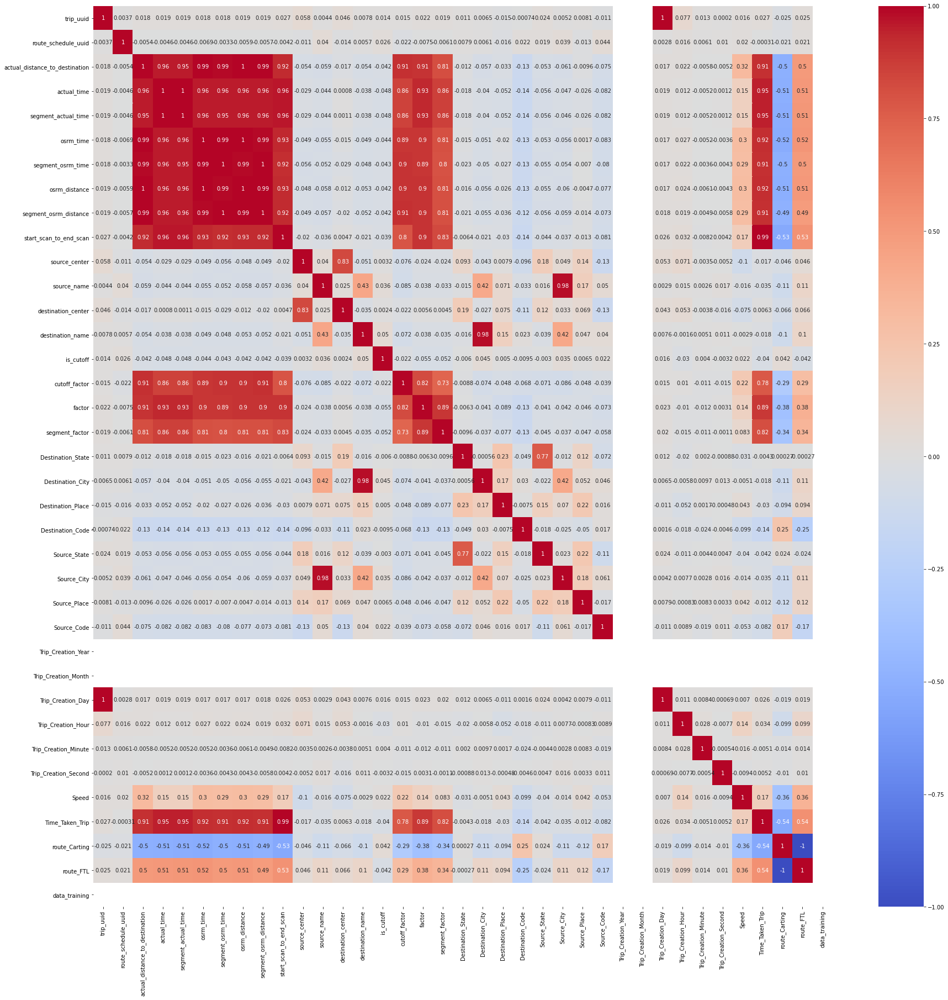

In [1062]:
plt.figure(figsize=(30,30))
sns.heatmap(final_df.corr(method='pearson'),annot=True,cmap="coolwarm")

In [1063]:
agg_trip_source_dest_features[agg_trip_source_dest_features['trip_uuid']=="trip-153671186247781647"]

,trip_uuid,source_center,source_name,destination_center,destination_name,data,trip_creation_time,route_schedule_uuid,route_type,actual_distance_to_destination,actual_time,segment_actual_time,osrm_time,segment_osrm_time,osrm_distance,segment_osrm_distance,od_start_time,od_end_time,start_scan_to_end_scan,is_cutoff,cutoff_factor,cutoff_timestamp,factor,segment_factor,Destination_State,Destination_City,Destination_Place,Destination_Code,Source_State,Source_City,Source_Place,Source_Code,Trip_Creation_Year,Trip_Creation_Month,Trip_Creation_Day,Trip_Creation_Hour,Trip_Creation_Minute,Trip_Creation_Second,Speed
35,trip-153671186247781647,IND209304AAA,Kanpur_Central_H_6 (Uttar Pradesh),IND209801AAA,Unnao_VikasRam_D (Uttar Pradesh),training,2018-09-12 00:24:22.478232,thanos::sroute:ba05c968-4aad-49ce-bf38-21469494acc4,Carting,37.071513,160.0,159.0,33.0,44.0,46.6075,49.9445,2018-09-12 00:24:22.478232,2018-09-12 03:37:31.889013,193.0,False,127,2018-09-12 03:19:32,16.239827,14.714286,Uttar Pradesh,Unnao,VikasRam,D,Uttar Pradesh,Kanpur,Central,H,2018,9,12,0,24,22,13.901817
36,trip-153671186247781647,IND209801AAA,Unnao_VikasRam_D (Uttar Pradesh),IND209304AAA,Kanpur_Central_H_6 (Uttar Pradesh),training,2018-09-12 00:24:22.478232,thanos::sroute:ba05c968-4aad-49ce-bf38-21469494acc4,Carting,37.491674,685.0,684.0,33.0,47.0,47.0734,47.0828,2018-09-12 03:37:31.889013,2018-09-12 18:10:51.317766,873.0,False,127,2018-09-12 17:23:22,74.141238,56.183333,Uttar Pradesh,Kanpur,Central,H,Uttar Pradesh,Unnao,VikasRam,D,2018,9,12,0,24,22,3.283942


In [1064]:
agg_trip_source_dest_features["source_name"].value_counts()

Gurgaon_Bilaspur_HB (Haryana)             777
Bengaluru_Nelmngla_H (Karnataka)          574
Bhiwandi_Mankoli_HB (Maharashtra)         554
Bengaluru_Bomsndra_HB (Karnataka)         343
Pune_Tathawde_H (Maharashtra)             319
                                         ... 
Soro_UttarDPP_D (Orissa)                    1
Palampur_Cnsrvila_D (Himachal Pradesh)      1
Barbil_PunjbiPd_D (Orissa)                  1
Banswara_KhandDPP_D (Rajasthan)             1
Bengaluru_Bomsndra_L (Karnataka)            1
Name: source_name, Length: 1425, dtype: int64

In [1065]:
agg_trip_source_dest_features[agg_trip_source_dest["source_name"]=="Gurgaon_Bilaspur_HB (Haryana)"]

,trip_uuid,source_center,source_name,destination_center,destination_name,data,trip_creation_time,route_schedule_uuid,route_type,actual_distance_to_destination,actual_time,segment_actual_time,osrm_time,segment_osrm_time,osrm_distance,segment_osrm_distance,od_start_time,od_end_time,start_scan_to_end_scan,is_cutoff,cutoff_factor,cutoff_timestamp,factor,segment_factor,Destination_State,Destination_City,Destination_Place,Destination_Code,Source_State,Source_City,Source_Place,Source_Code,Trip_Creation_Year,Trip_Creation_Month,Trip_Creation_Day,Trip_Creation_Hour,Trip_Creation_Minute,Trip_Creation_Second,Speed
4,trip-153671043369099517,IND000000ACB,Gurgaon_Bilaspur_HB (Haryana),IND160002AAC,Chandigarh_Mehmdpur_H (Punjab),training,2018-09-12 00:00:33.691250,thanos::sroute:de5e208e-7641-45e6-8100-4d9fb1e5720d,FTL,237.439610,611.0,608.0,212.0,231.0,281.2109,317.7408,2018-09-14 03:40:17.106733,2018-09-14 17:34:55.442454,834.0,False,1689,2018-09-14 16:54:36,20.854778,27.918923,Punjab,Chandigarh,Mehmdpur,H,Haryana,Gurgaon,Bilaspur,HB,2018,9,12,0,0,33,23.316492
166,trip-153671715851493285,IND000000ACB,Gurgaon_Bilaspur_HB (Haryana),IND751002AAB,Bhubaneshwar_Hub (Orissa),training,2018-09-12 01:52:38.515204,thanos::sroute:15c921f8-8a40-44cc-95ac-59f93d25f780,FTL,1269.396357,2264.0,2242.0,1166.0,1849.0,1638.4813,2311.6569,2018-09-12 01:52:38.515204,2018-09-13 18:10:39.740625,2418.0,False,37107,2018-09-13 17:30:01,102.242984,88.761175,Orissa,Bhubaneshwar,Other_Bhubaneshwar,Hub,Haryana,Gurgaon,Bilaspur,HB,2018,9,12,1,52,38,33.641246
167,trip-153671717917876174,IND000000ACB,Gurgaon_Bilaspur_HB (Haryana),IND302014AAA,Jaipur_Hub (Rajasthan),training,2018-09-12 01:52:59.179033,thanos::sroute:5184d9b4-3aef-4e81-b8d0-fbbd1a72fdcb,FTL,195.971173,361.0,357.0,168.0,207.0,220.9971,257.3218,2018-09-12 01:52:59.179033,2018-09-12 10:47:36.664048,534.0,False,987,2018-09-12 09:44:06,20.608332,17.131070,Rajasthan,Jaipur,Other_Jaipur,Hub,Haryana,Gurgaon,Bilaspur,HB,2018,9,12,1,52,59,32.571386
173,trip-153671735399307935,IND000000ACB,Gurgaon_Bilaspur_HB (Haryana),IND131028AAB,Sonipat_Kundli_H (Haryana),training,2018-09-12 01:55:53.993301,thanos::sroute:6a27be1b-8585-43b1-9c46-f69ee50eb25b,Carting,70.211586,237.0,235.0,100.0,103.0,123.9724,120.8087,2018-09-12 01:55:53.993301,2018-09-12 08:46:44.437564,410.0,False,322,2018-09-12 07:17:28,17.804161,18.605738,Haryana,Sonipat,Kundli,H,Haryana,Gurgaon,Bilaspur,HB,2018,9,12,1,55,53,17.775085
178,trip-153671742249756615,IND000000ACB,Gurgaon_Bilaspur_HB (Haryana),IND821115AAB,Sasaram_Central_I_2 (Bihar),training,2018-09-12 01:57:02.497819,thanos::sroute:828f0a4b-da11-4921-88df-5316ddbffda5,FTL,803.825579,1199.0,1187.0,646.0,741.0,900.4300,1050.7238,2018-09-12 01:57:02.497819,2018-09-13 01:07:23.057952,1390.0,False,15455,2018-09-12 23:40:07,73.123604,63.051076,Bihar,Sasaram,Central,I,Haryana,Gurgaon,Bilaspur,HB,2018,9,12,1,57,2,40.224800
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18654,trip-153799693329620742,IND000000ACB,Gurgaon_Bilaspur_HB (Haryana),IND122001AAA,GGN_DPC (Haryana),training,2018-09-26 21:22:13.296559,thanos::sroute:20f7c97f-614d-4501-96c7-fbd43d5d759d,Carting,29.235315,64.0,62.0,34.0,37.0,35.1567,35.8870,2018-09-26 21:22:13.296559,2018-09-26 23:25:55.734417,123.0,False,83,2018-09-26 22:45:17,7.055177,7.028846,Haryana,GGN,Other_GGN,DPC,Haryana,Gurgaon,Bilaspur,HB,2018,9,26,21,22,13,27.408108
18730,trip-153800006302758138,IND000000ACB,Gurgaon_Bilaspur_HB (Haryana),IND160002AAC,Chandigarh_Mehmdpur_H (Punjab),training,2018-09-26 22:14:23.027831,thanos::sroute:b3fd32d8-4027-4dc5-a425-eb8ccb83e3da,FTL,237.227544,491.0,485.0,212.0,230.0,281.0502,319.5369,2018-09-29 03:12:56.095056,2018-09-29 17:37:35.478498,864.0,False,1689,2018-09-29 16:44:14,21.913016,23.733720,Punjab,Chandigarh,Mehmdpur,H,Haryana,Gurgaon,Bilaspur,HB,2018,9,26,22,14,23,28.989109
18775,trip-153800172646473137,IND000000ACB,Gurgaon_B

In [1066]:
df=agg_trip_source_dest_features.copy()
df

,trip_uuid,source_center,source_name,destination_center,destination_name,data,trip_creation_time,route_schedule_uuid,route_type,actual_distance_to_destination,actual_time,segment_actual_time,osrm_time,segment_osrm_time,osrm_distance,segment_osrm_distance,od_start_time,od_end_time,start_scan_to_end_scan,is_cutoff,cutoff_factor,cutoff_timestamp,factor,segment_factor,Destination_State,Destination_City,Destination_Place,Destination_Code,Source_State,Source_City,Source_Place,Source_Code,Trip_Creation_Year,Trip_Creation_Month,Trip_Creation_Day,Trip_Creation_Hour,Trip_Creation_Minute,Trip_Creation_Second,Speed
0,trip-153671041653548748,IND209304AAA,Kanpur_Central_H_6 (Uttar Pradesh),IND000000ACB,Gurgaon_Bilaspur_HB (Haryana),training,2018-09-12 00:00:16.535741,thanos::sroute:d7c989ba-a29b-4a0b-b2f4-288cdc60074b,FTL,383.759164,732.0,728.0,329.0,534.0,446.5496,670.6205,2018-09-12 16:39:46.858469,2018-09-13 13:40:23.123744,1260.0,False,3749,2018-09-13 12:40:43,31.355359,34.074133,Haryana,Gurgaon,Bilaspur,HB,Uttar Pradesh,Kanpur,Central,H,2018,9,12,0,0,16,31.455669
1,trip-153671041653548748,IND462022AAA,Bhopal_Trnsport_H (Madhya Pradesh),IND209304AAA,Kanpur_Central_H_6 (Uttar Pradesh),training,2018-09-12 00:00:16.535741,thanos::sroute:d7c989ba-a29b-4a0b-b2f4-288cdc60074b,FTL,440.973689,830.0,820.0,388.0,474.0,544.8027,649.8528,2018-09-12 00:00:16.535741,2018-09-12 16:39:46.858469,999.0,False,5060,2018-09-12 14:56:29,45.164741,44.818471,Uttar Pradesh,Kanpur,Central,H,Madhya Pradesh,Bhopal,Trnsport,H,2018,9,12,0,0,16,31.877616
2,trip-153671042288605164,IND561203AAB,Doddablpur_ChikaDPP_D (Karnataka),IND562101AAA,Chikblapur_ShntiSgr_D (Karnataka),training,2018-09-12 00:00:22.886430,thanos::sroute:3a1b0ab2-bb0b-4c53-8c59-eb2a2c0d68b9,Carting,24.644021,47.0,46.0,26.0,26.0,28.1994,28.1995,2018-09-12 02:03:09.655591,2018-09-12 03:01:59.598855,58.0,False,51,2018-09-12 02:41:24,5.239271,5.387302,Karnataka,Chikblapur,ShntiSgr,D,Karnataka,Doddablpur,ChikaDPP,D,2018,9,12,0,0,22,31.460452
3,trip-153671042288605164,IND572101AAA,Tumkur_Veersagr_I (Karnataka),IND561203AAB,Doddablpur_ChikaDPP_D (Karnataka),training,2018-09-12 00:00:22.886430,thanos::sroute:3a1b0ab2-bb0b-4c53-8c59-eb2a2c0d68b9,Carting,48.542890,96.0,95.0,42.0,39.0,56.9116,55.9899,2018-09-12 00:00:22.886430,2018-09-12 02:03:09.655591,122.0,False,183,2018-09-12 01:39:28,11.255861,17.477778,Karnataka,Doddablpur,ChikaDPP,D,Karnataka,Tumkur,Veersagr,I,2018,9,12,0,0,22,30.339306
4,trip-153671043369099517,IND000000ACB,Gurgaon_Bilaspur_HB (Haryana),IND160002AAC,Chandigarh_Mehmdpur_H (Punjab),training,2018-09-12 00:00:33.691250,thanos::sroute:de5e208e-7641-45e6-8100-4d9fb1e5720d,FTL,237.439610,611.0,608.0,212.0,231.0,281.2109,317.7408,2018-09-14 03:40:17.106733,2018-09-14 17:34:55.442454,834.0,False,1689,2018-09-14 16:54:36,20.854778,27.918923,Punjab,Chandigarh,Mehmdpur,H,Haryana,Gurgaon,Bilaspur,HB,2018,9,12,0,0,33,23.316492
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18942,trip-153800605670819251,IND209721AAB,Chhibramau_Bhainpura_D (Uttar Pradesh),IND209625AAA,Farrukhbad_Pnchlght_D (Uttar Pradesh),training,2018-09-26 23:54:16.708455,thanos::sroute:fcd09ac0-86d2-44d0-92ee-11c0e0bc8d1a,FTL,28.076593,62.0,61.0,35.0,34.0,30.6048,30.6048,2018-09-27 03:12:37.363857,2018-09-27 04:27:18.982270,74.0,False,50,2018-09-27 03:27:19,3.664286,3.226190,Uttar Pradesh,Farrukhbad,Pnchlght,D,Uttar Pradesh,Chhibramau,Bhainpura,D,2018,9,26,23,54,16,27.170897
18943,trip-153800605670819251,IND242307AAB,Tilhar_SingCLNY_D (Uttar Pradesh),IND207247AAB,Aliganj_KaimgnjRD_D (Uttar Pradesh),training,2018-09-26 23:54:16.708455,thanos::sroute:fcd09ac0-86d2-44d0-92ee-11c0e0bc8d1a,FTL,75.828788,266.0,264.0,132.0,145.0,139.5450,135.9699,2018-09-27 08:27:33.418894,2018-09-27 13:15:44.426809,288.0,False,207,2018-09-27 12:17:49,7.997220,7.031319,Uttar Pradesh,Aliganj,KaimgnjRD,D,Uttar Pradesh,Tilhar,SingCLNY,D,2018,9,26,

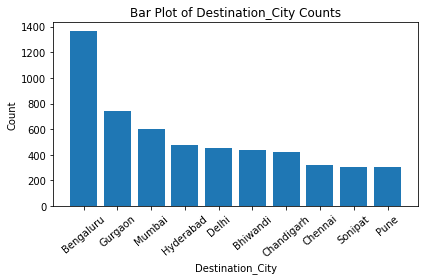

In [1067]:
value_counts = df['Destination_City'].value_counts()
top_10_values = value_counts.head(10)
plt.bar(top_10_values.index, top_10_values.values)
plt.xlabel('Destination_City')
plt.ylabel('Count')
plt.title('Bar Plot of Destination_City Counts')
plt.xticks(rotation=40)

# Display the plot
plt.tight_layout()

plt.show()

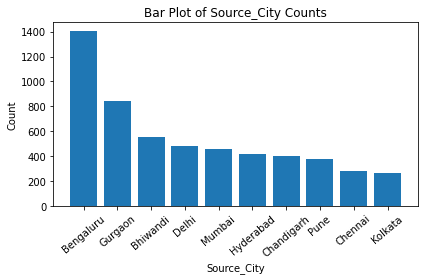

In [1068]:
value_counts = df['Source_City'].value_counts()
top_10_values = value_counts.head(10)
plt.bar(top_10_values.index, top_10_values.values)
plt.xlabel('Source_City')
plt.ylabel('Count')
plt.title('Bar Plot of Source_City Counts')
plt.xticks(rotation=40)

# Display the plot
plt.tight_layout()

plt.show()

In [1069]:
df['corridor'] = df['source_name'] + ' <-> ' + df['destination_name']
df['state_corridor'] = df['Source_State'] + ' <-> ' + df['Destination_State']
df

,trip_uuid,source_center,source_name,destination_center,destination_name,data,trip_creation_time,route_schedule_uuid,route_type,actual_distance_to_destination,actual_time,segment_actual_time,osrm_time,segment_osrm_time,osrm_distance,segment_osrm_distance,od_start_time,od_end_time,start_scan_to_end_scan,is_cutoff,cutoff_factor,cutoff_timestamp,factor,segment_factor,Destination_State,Destination_City,Destination_Place,Destination_Code,Source_State,Source_City,Source_Place,Source_Code,Trip_Creation_Year,Trip_Creation_Month,Trip_Creation_Day,Trip_Creation_Hour,Trip_Creation_Minute,Trip_Creation_Second,Speed,corridor,state_corridor
0,trip-153671041653548748,IND209304AAA,Kanpur_Central_H_6 (Uttar Pradesh),IND000000ACB,Gurgaon_Bilaspur_HB (Haryana),training,2018-09-12 00:00:16.535741,thanos::sroute:d7c989ba-a29b-4a0b-b2f4-288cdc60074b,FTL,383.759164,732.0,728.0,329.0,534.0,446.5496,670.6205,2018-09-12 16:39:46.858469,2018-09-13 13:40:23.123744,1260.0,False,3749,2018-09-13 12:40:43,31.355359,34.074133,Haryana,Gurgaon,Bilaspur,HB,Uttar Pradesh,Kanpur,Central,H,2018,9,12,0,0,16,31.455669,Kanpur_Central_H_6 (Uttar Pradesh) <-> Gurgaon_Bilaspur_HB (Haryana),Uttar Pradesh <-> Haryana
1,trip-153671041653548748,IND462022AAA,Bhopal_Trnsport_H (Madhya Pradesh),IND209304AAA,Kanpur_Central_H_6 (Uttar Pradesh),training,2018-09-12 00:00:16.535741,thanos::sroute:d7c989ba-a29b-4a0b-b2f4-288cdc60074b,FTL,440.973689,830.0,820.0,388.0,474.0,544.8027,649.8528,2018-09-12 00:00:16.535741,2018-09-12 16:39:46.858469,999.0,False,5060,2018-09-12 14:56:29,45.164741,44.818471,Uttar Pradesh,Kanpur,Central,H,Madhya Pradesh,Bhopal,Trnsport,H,2018,9,12,0,0,16,31.877616,Bhopal_Trnsport_H (Madhya Pradesh) <-> Kanpur_Central_H_6 (Uttar Pradesh),Madhya Pradesh <-> Uttar Pradesh
2,trip-153671042288605164,IND561203AAB,Doddablpur_ChikaDPP_D (Karnataka),IND562101AAA,Chikblapur_ShntiSgr_D (Karnataka),training,2018-09-12 00:00:22.886430,thanos::sroute:3a1b0ab2-bb0b-4c53-8c59-eb2a2c0d68b9,Carting,24.644021,47.0,46.0,26.0,26.0,28.1994,28.1995,2018-09-12 02:03:09.655591,2018-09-12 03:01:59.598855,58.0,False,51,2018-09-12 02:41:24,5.239271,5.387302,Karnataka,Chikblapur,ShntiSgr,D,Karnataka,Doddablpur,ChikaDPP,D,2018,9,12,0,0,22,31.460452,Doddablpur_ChikaDPP_D (Karnataka) <-> Chikblapur_ShntiSgr_D (Karnataka),Karnataka <-> Karnataka
3,trip-153671042288605164,IND572101AAA,Tumkur_Veersagr_I (Karnataka),IND561203AAB,Doddablpur_ChikaDPP_D (Karnataka),training,2018-09-12 00:00:22.886430,thanos::sroute:3a1b0ab2-bb0b-4c53-8c59-eb2a2c0d68b9,Carting,48.542890,96.0,95.0,42.0,39.0,56.9116,55.9899,2018-09-12 00:00:22.886430,2018-09-12 02:03:09.655591,122.0,False,183,2018-09-12 01:39:28,11.255861,17.477778,Karnataka,Doddablpur,ChikaDPP,D,Karnataka,Tumkur,Veersagr,I,2018,9,12,0,0,22,30.339306,Tumkur_Veersagr_I (Karnataka) <-> Doddablpur_ChikaDPP_D (Karnataka),Karnataka <-> Karnataka
4,trip-153671043369099517,IND000000ACB,Gurgaon_Bilaspur_HB (Haryana),IND160002AAC,Chandigarh_Mehmdpur_H (Punjab),training,2018-09-12 00:00:33.691250,thanos::sroute:de5e208e-7641-45e6-8100-4d9fb1e5720d,FTL,237.439610,611.0,608.0,212.0,231.0,281.2109,317.7408,2018-09-14 03:40:17.106733,2018-09-14 17:34:55.442454,834.0,False,1689,2018-09-14 16:54:36,20.854778,27.918923,Punjab,Chandigarh,Mehmdpur,H,Haryana,Gurgaon,Bilaspur,HB,2018,9,12,0,0,33,23.316492,Gurgaon_Bilaspur_HB (Haryana) <-> Chandigarh_Mehmdpur_H (Punjab),Haryana <-> Punjab
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18942,trip-153800605670819251,IND209721AAB,Chhibramau_Bhainpura_D (Uttar Pradesh),IND209625AAA,Farrukhbad_Pnchlght_D (Uttar Pradesh),training,2018-09-26 23:54:16.708455,thanos::sroute:fcd09ac0-86d2-44d0-92ee-11c0e0bc8d1a,FTL,28.076593,62.0,61.0,35.0,34.0,30.6048,30.6048,2018-09-27 03:12:37.363857,2018-09-27 04:27:18.982270,74.0,False,50,2018-09-27 03:27:19,3.664286,3.226190,Uttar Pradesh,Farrukhbad,Pnchlght,D,Uttar Pradesh,

In [1070]:
df["corridor"].value_counts()

Bengaluru_Nelmngla_H (Karnataka) <-> Bengaluru_Bomsndra_HB (Karnataka)               100
Bengaluru_Nelmngla_H (Karnataka) <-> Bengaluru_KGAirprt_HB (Karnataka)               100
Pune_Tathawde_H (Maharashtra) <-> Bhiwandi_Mankoli_HB (Maharashtra)                   92
Bengaluru_Bomsndra_HB (Karnataka) <-> Bengaluru_Nelmngla_H (Karnataka)                83
Bengaluru_Bomsndra_HB (Karnataka) <-> Bengaluru_KGAirprt_HB (Karnataka)               81
                                                                                    ... 
Kasganj_BnkrGate_D (Uttar Pradesh) <-> Aligarh_KhirByps_I (Uttar Pradesh)              1
Araria_Wardn13_D (Bihar) <-> IND852118A1B_IND852118A1B_IND852118A1B(IND852118A1B)      1
Tezu_Farmnala_D (Arunachal Pradesh) <-> Dibrugarh_Bokule_H (Assam)                     1
Usilampatti_MrutiNGR_D (Tamil Nadu) <-> Kattappana_Palikval_D (Kerala)                 1
Kothanalloor_Majoor_D (Kerala) <-> Vaikom_KotyamRD_D (Kerala)                          1
Name: corridor, Lengt

In [1071]:
busy_state_corridors = df["state_corridor"].value_counts()
busy_state_corridors.head(50)

Karnataka <-> Karnataka                  2323
Maharashtra <-> Maharashtra              2220
Tamil Nadu <-> Tamil Nadu                1531
Uttar Pradesh <-> Uttar Pradesh          1076
Telangana <-> Telangana                   921
West Bengal <-> West Bengal               908
Gujarat <-> Gujarat                       880
Andhra Pradesh <-> Andhra Pradesh         768
Haryana <-> Haryana                       763
Bihar <-> Bihar                           742
Rajasthan <-> Rajasthan                   725
Punjab <-> Punjab                         615
Kerala <-> Kerala                         500
Madhya Pradesh <-> Madhya Pradesh         412
Delhi <-> Haryana                         351
Assam <-> Assam                           343
Haryana <-> Delhi                         240
Uttarakhand <-> Uttarakhand               212
Jharkhand <-> Jharkhand                   167
Delhi <-> Delhi                           162
Himachal Pradesh <-> Himachal Pradesh     124
Orissa <-> Orissa                 

In [1072]:
busiest_corridor_state = busy_state_corridors.index[0]  # 'Maharashtra<->Maharashtra'
busiest_corridor_state

'Karnataka <-> Karnataka'

In [1073]:
plt.close('all')

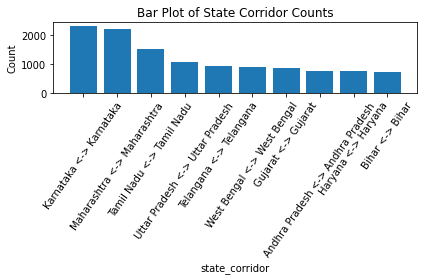

In [1074]:
value_counts = df['state_corridor'].value_counts()
top_10_values = value_counts.head(10)
plt.bar(top_10_values.index, top_10_values.values)
plt.xlabel('state_corridor')
plt.ylabel('Count')
plt.title('Bar Plot of State Corridor Counts')
plt.xticks(rotation=55)

# Display the plot
plt.tight_layout()

plt.show()

In [1075]:
df[df['state_corridor']=='Karnataka <-> Karnataka']['route_type'].value_counts()

Carting    1566
FTL         757
Name: route_type, dtype: int64

In [1076]:
df[df['state_corridor']=='Delhi <-> Haryana']['route_type'].value_counts()

Carting    300
FTL         51
Name: route_type, dtype: int64

In [1077]:
df

,trip_uuid,source_center,source_name,destination_center,destination_name,data,trip_creation_time,route_schedule_uuid,route_type,actual_distance_to_destination,actual_time,segment_actual_time,osrm_time,segment_osrm_time,osrm_distance,segment_osrm_distance,od_start_time,od_end_time,start_scan_to_end_scan,is_cutoff,cutoff_factor,cutoff_timestamp,factor,segment_factor,Destination_State,Destination_City,Destination_Place,Destination_Code,Source_State,Source_City,Source_Place,Source_Code,Trip_Creation_Year,Trip_Creation_Month,Trip_Creation_Day,Trip_Creation_Hour,Trip_Creation_Minute,Trip_Creation_Second,Speed,corridor,state_corridor
0,trip-153671041653548748,IND209304AAA,Kanpur_Central_H_6 (Uttar Pradesh),IND000000ACB,Gurgaon_Bilaspur_HB (Haryana),training,2018-09-12 00:00:16.535741,thanos::sroute:d7c989ba-a29b-4a0b-b2f4-288cdc60074b,FTL,383.759164,732.0,728.0,329.0,534.0,446.5496,670.6205,2018-09-12 16:39:46.858469,2018-09-13 13:40:23.123744,1260.0,False,3749,2018-09-13 12:40:43,31.355359,34.074133,Haryana,Gurgaon,Bilaspur,HB,Uttar Pradesh,Kanpur,Central,H,2018,9,12,0,0,16,31.455669,Kanpur_Central_H_6 (Uttar Pradesh) <-> Gurgaon_Bilaspur_HB (Haryana),Uttar Pradesh <-> Haryana
1,trip-153671041653548748,IND462022AAA,Bhopal_Trnsport_H (Madhya Pradesh),IND209304AAA,Kanpur_Central_H_6 (Uttar Pradesh),training,2018-09-12 00:00:16.535741,thanos::sroute:d7c989ba-a29b-4a0b-b2f4-288cdc60074b,FTL,440.973689,830.0,820.0,388.0,474.0,544.8027,649.8528,2018-09-12 00:00:16.535741,2018-09-12 16:39:46.858469,999.0,False,5060,2018-09-12 14:56:29,45.164741,44.818471,Uttar Pradesh,Kanpur,Central,H,Madhya Pradesh,Bhopal,Trnsport,H,2018,9,12,0,0,16,31.877616,Bhopal_Trnsport_H (Madhya Pradesh) <-> Kanpur_Central_H_6 (Uttar Pradesh),Madhya Pradesh <-> Uttar Pradesh
2,trip-153671042288605164,IND561203AAB,Doddablpur_ChikaDPP_D (Karnataka),IND562101AAA,Chikblapur_ShntiSgr_D (Karnataka),training,2018-09-12 00:00:22.886430,thanos::sroute:3a1b0ab2-bb0b-4c53-8c59-eb2a2c0d68b9,Carting,24.644021,47.0,46.0,26.0,26.0,28.1994,28.1995,2018-09-12 02:03:09.655591,2018-09-12 03:01:59.598855,58.0,False,51,2018-09-12 02:41:24,5.239271,5.387302,Karnataka,Chikblapur,ShntiSgr,D,Karnataka,Doddablpur,ChikaDPP,D,2018,9,12,0,0,22,31.460452,Doddablpur_ChikaDPP_D (Karnataka) <-> Chikblapur_ShntiSgr_D (Karnataka),Karnataka <-> Karnataka
3,trip-153671042288605164,IND572101AAA,Tumkur_Veersagr_I (Karnataka),IND561203AAB,Doddablpur_ChikaDPP_D (Karnataka),training,2018-09-12 00:00:22.886430,thanos::sroute:3a1b0ab2-bb0b-4c53-8c59-eb2a2c0d68b9,Carting,48.542890,96.0,95.0,42.0,39.0,56.9116,55.9899,2018-09-12 00:00:22.886430,2018-09-12 02:03:09.655591,122.0,False,183,2018-09-12 01:39:28,11.255861,17.477778,Karnataka,Doddablpur,ChikaDPP,D,Karnataka,Tumkur,Veersagr,I,2018,9,12,0,0,22,30.339306,Tumkur_Veersagr_I (Karnataka) <-> Doddablpur_ChikaDPP_D (Karnataka),Karnataka <-> Karnataka
4,trip-153671043369099517,IND000000ACB,Gurgaon_Bilaspur_HB (Haryana),IND160002AAC,Chandigarh_Mehmdpur_H (Punjab),training,2018-09-12 00:00:33.691250,thanos::sroute:de5e208e-7641-45e6-8100-4d9fb1e5720d,FTL,237.439610,611.0,608.0,212.0,231.0,281.2109,317.7408,2018-09-14 03:40:17.106733,2018-09-14 17:34:55.442454,834.0,False,1689,2018-09-14 16:54:36,20.854778,27.918923,Punjab,Chandigarh,Mehmdpur,H,Haryana,Gurgaon,Bilaspur,HB,2018,9,12,0,0,33,23.316492,Gurgaon_Bilaspur_HB (Haryana) <-> Chandigarh_Mehmdpur_H (Punjab),Haryana <-> Punjab
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18942,trip-153800605670819251,IND209721AAB,Chhibramau_Bhainpura_D (Uttar Pradesh),IND209625AAA,Farrukhbad_Pnchlght_D (Uttar Pradesh),training,2018-09-26 23:54:16.708455,thanos::sroute:fcd09ac0-86d2-44d0-92ee-11c0e0bc8d1a,FTL,28.076593,62.0,61.0,35.0,34.0,30.6048,30.6048,2018-09-27 03:12:37.363857,2018-09-27 04:27:18.982270,74.0,False,50,2018-09-27 03:27:19,3.664286,3.226190,Uttar Pradesh,Farrukhbad,Pnchlght,D,Uttar Pradesh,

In [1078]:
avg_dist_ftl = np.average(df[df['route_type'] == 'FTL']['actual_distance_to_destination'])
avg_dist_cart = np.average(df[df['route_type'] == 'Carting']['actual_distance_to_destination'])
print('avg_dist_ftl: ', avg_dist_ftl)
print('avg_dist_cart: ', avg_dist_cart)

avg_dist_ftl:  147.7821325112911
avg_dist_cart:  29.287526345144514


In [1079]:
tot_dist_ftl = np.sum(df[df['route_type'] == 'FTL']['actual_distance_to_destination']) 
tot_time_ftl = np.sum(df[df['route_type'] == 'FTL']['actual_time'])/60
avg_speed_ftl = tot_dist_ftl/tot_time_ftl

tot_dist_cart = np.sum(df[df['route_type'] == 'Carting']['actual_distance_to_destination']) 
tot_time_cart = np.sum(df[df['route_type'] == 'Carting']['actual_time'])/60
avg_speed_cart = tot_dist_cart/tot_time_cart

print('tot_dist_ftl, tot_time_ftl, avg_speed_ftl:', tot_dist_ftl, tot_time_ftl, avg_speed_ftl)
print('tot_dist_cart, tot_time_cart, avg_speed_cart:', tot_dist_cart, tot_time_cart, avg_speed_cart)

df[df['route_type'] == 'FTL'].describe()


tot_dist_ftl, tot_time_ftl, avg_speed_ftl: 1526293.8645766145 51112.53333333333 29.861440336420053
tot_dist_cart, tot_time_cart, avg_speed_cart: 252429.18956880056 13085.316666666668 19.29102642290918


,actual_distance_to_destination,actual_time,segment_actual_time,osrm_time,segment_osrm_time,osrm_distance,segment_osrm_distance,start_scan_to_end_scan,cutoff_factor,factor,segment_factor,Trip_Creation_Year,Trip_Creation_Month,Trip_Creation_Day,Trip_Creation_Hour,Trip_Creation_Minute,Trip_Creation_Second,Speed
count,10328.000000,10328.000000,10328.000000,10328.000000,10328.000000,10328.000000,10328.000000,10328.000000,10328.000000,10328.000000,10328.000000,10328.0,10328.0,10328.000000,10328.000000,10328.000000,10328.000000,10328.000000
mean,147.782133,296.935709,294.381681,140.463013,156.468145,182.355812,197.711349,402.481603,2244.504841,14.077290,14.501376,2018.0,9.0,19.004744,13.699361,30.155015,30.242641,30.740512
std,268.898915,488.417034,483.583115,237.274650,276.032411,325.553647,366.568081,546.898361,8534.210341,23.721781,24.436352,0.0,0.0,4.327124,7.933279,17.403417,17.272255,10.052593
min,15.021774,15.000000,15.000000,11.000000,11.000000,15.779200,15.779200,23.000000,15.000000,0.407895,-0.361111,2018.0,9.0,12.000000,0.000000,0.000000,0.000000,0.434947
25%,32.219864,66.000000,66.000000,35.000000,36.000000,40.634100,41.235275,99.000000,54.000000,3.553489,3.599426,2018.0,9.0,15.000000,6.000000,15.000000,16.000000,24.402005
50%,56.391250,122.000000,121.000000,60.000000,63.000000,71.797350,73.641400,198.000000,121.000000,5.979496,6.255926,2018.0,9.0,19.000000,17.000000,31.000000,31.000000,31.369970
75%,125.455471,273.000000,271.000000,128.000000,137.000000,155.500275,165.554600,469.000000,454.000000,12.636618,13.343532,2018.0,9.0,23.000000,21.000000,45.000000,45.000000,37.250049
max,1927.447705,4532.000000,4504.000000,1686.000000,1914.000000,2326.199100,2588.753200,4535.000000,84757.000000,307.205029,497.047619,2018.0,9.0,26.000000,23.000000,59.000000,59.000000,127.798742


In [1080]:
df[df['route_type'] == 'Carting'].describe()

,actual_distance_to_destination,actual_time,segment_actual_time,osrm_time,segment_osrm_time,osrm_distance,segment_osrm_distance,start_scan_to_end_scan,cutoff_factor,factor,segment_factor,Trip_Creation_Year,Trip_Creation_Month,Trip_Creation_Day,Trip_Creation_Hour,Trip_Creation_Minute,Trip_Creation_Second,Speed
count,8619.000000,8619.000000,8619.000000,8619.000000,8619.000000,8619.000000,8619.000000,8619.000000,8619.000000,8619.000000,8619.000000,8619.0,8619.0,8619.000000,8619.000000,8619.000000,8619.000000,8619.000000
mean,29.287526,91.091658,90.013111,34.559810,39.176239,37.981556,42.363528,176.741617,96.918784,8.829674,9.526774,2018.0,9.0,18.895928,11.860657,29.805430,29.820629,24.028582
std,20.097105,101.594179,101.200267,21.908415,32.709750,26.077879,35.391404,163.738350,155.894005,9.401245,15.285918,0.0,0.0,4.337867,8.408419,17.233145,17.311960,10.143689
min,9.001351,10.000000,10.000000,6.000000,6.000000,9.072900,9.072900,20.000000,9.000000,0.750000,-0.389831,2018.0,9.0,12.000000,0.000000,0.000000,0.000000,0.719074
25%,15.771549,43.000000,42.000000,19.000000,19.000000,20.327000,21.222700,84.000000,24.000000,4.650505,4.253205,2018.0,9.0,15.000000,3.000000,15.000000,14.500000,16.845852
50%,23.735347,65.000000,64.000000,29.000000,30.000000,31.334400,32.712800,131.000000,50.000000,6.739222,6.703175,2018.0,9.0,19.000000,13.000000,30.000000,30.000000,23.653617
75%,36.746846,104.000000,102.000000,43.000000,49.000000,45.144750,51.294200,210.000000,125.000000,10.045622,10.450824,2018.0,9.0,22.500000,20.000000,45.000000,45.000000,30.855262
max,198.176906,2536.000000,2533.000000,216.000000,418.000000,293.792000,552.589400,2701.000000,3354.000000,182.446843,590.702381,2018.0,9.0,26.000000,23.000000,59.000000,59.000000,102.366465


In [1081]:
df[(df['route_type'] == 'FTL')&(df['state_corridor'] == busiest_corridor_state)].describe()
# 31.912020 mean
# 1.669481 25%
# 39.480885 75%
# 54.012860 max

,actual_distance_to_destination,actual_time,segment_actual_time,osrm_time,segment_osrm_time,osrm_distance,segment_osrm_distance,start_scan_to_end_scan,cutoff_factor,factor,segment_factor,Trip_Creation_Year,Trip_Creation_Month,Trip_Creation_Day,Trip_Creation_Hour,Trip_Creation_Minute,Trip_Creation_Second,Speed
count,757.000000,757.000000,757.000000,757.000000,757.000000,757.000000,757.000000,757.000000,757.000000,757.000000,757.000000,757.0,757.0,757.000000,757.000000,757.000000,757.000000,757.000000
mean,61.287239,124.704095,123.764861,63.260238,66.179657,76.055533,78.097347,218.474240,197.867900,6.033540,7.264355,2018.0,9.0,18.885073,14.001321,29.368560,28.846764,31.912020
std,51.300662,111.550661,110.746566,46.863019,52.020646,62.782362,65.220897,193.970538,337.721405,4.760903,19.811264,0.0,0.0,4.218096,7.109592,17.026752,17.702054,9.240109
min,17.102157,25.000000,25.000000,16.000000,16.000000,19.200100,19.200100,28.000000,17.000000,1.000000,-0.060606,2018.0,9.0,12.000000,0.000000,0.000000,0.000000,1.669481
25%,32.867046,62.000000,62.000000,34.000000,34.000000,40.311400,40.222400,86.000000,54.000000,3.333333,3.093750,2018.0,9.0,15.000000,10.000000,15.000000,14.000000,25.557829
50%,42.528008,87.000000,86.000000,47.000000,48.000000,53.880100,55.498300,138.000000,64.000000,4.509565,4.873550,2018.0,9.0,19.000000,16.000000,30.000000,27.000000,31.532798
75%,60.328874,140.000000,139.000000,74.000000,76.000000,80.447600,83.883800,272.000000,126.000000,6.663688,7.578150,2018.0,9.0,22.000000,20.000000,43.000000,44.000000,39.480885
max,347.381295,889.000000,887.000000,298.000000,339.000000,387.387000,387.871300,1086.000000,2987.000000,41.632035,497.047619,2018.0,9.0,26.000000,23.000000,59.000000,59.000000,54.012860


In [1082]:
df[(df['route_type'] == 'Carting')&(df['state_corridor'] == busiest_corridor_state)].describe()
# 24.895445 mean
# 2.275537 25%
# 31.313888 75%
# 62.323234 max

,actual_distance_to_destination,actual_time,segment_actual_time,osrm_time,segment_osrm_time,osrm_distance,segment_osrm_distance,start_scan_to_end_scan,cutoff_factor,factor,segment_factor,Trip_Creation_Year,Trip_Creation_Month,Trip_Creation_Day,Trip_Creation_Hour,Trip_Creation_Minute,Trip_Creation_Second,Speed
count,1566.000000,1566.000000,1566.000000,1566.000000,1566.000000,1566.000000,1566.000000,1566.000000,1566.000000,1566.000000,1566.000000,1566.0,1566.0,1566.000000,1566.000000,1566.000000,1566.000000,1566.000000
mean,28.815683,79.782886,78.658365,38.429119,42.003831,36.590362,40.911420,168.209451,81.906130,6.964674,7.151859,2018.0,9.0,18.955300,12.021073,30.500639,29.066411,24.895445
std,12.999308,51.516765,51.202550,15.168482,17.946744,16.056120,18.702292,109.563004,63.057655,4.073871,6.609695,0.0,0.0,4.144735,8.064608,17.424552,16.982552,9.242807
min,9.231960,10.000000,10.000000,8.000000,8.000000,9.330100,9.330100,25.000000,9.000000,1.000000,-0.058824,2018.0,9.0,12.000000,0.000000,0.000000,0.000000,2.275537
25%,19.715684,45.000000,44.000000,26.000000,28.000000,25.642650,27.796950,94.000000,46.000000,4.328017,3.916667,2018.0,9.0,15.000000,4.000000,15.000000,14.000000,18.096432
50%,28.086955,68.000000,67.000000,38.000000,41.000000,36.191150,39.954000,139.000000,81.500000,6.127977,5.863403,2018.0,9.0,19.000000,12.500000,32.000000,29.000000,24.247143
75%,39.372339,94.750000,93.000000,50.000000,54.000000,46.749875,52.841675,211.000000,129.000000,8.464746,8.657260,2018.0,9.0,22.000000,20.000000,45.000000,43.000000,31.313888
max,80.205913,478.000000,478.000000,97.000000,103.000000,105.666600,109.853500,971.000000,404.000000,51.617201,121.800000,2018.0,9.0,26.000000,23.000000,59.000000,59.000000,62.323234


In [1083]:
# max in carting is high in following trip_uuid, data maybe recorded incorrect
df[(df['Speed']>50)&(df['route_type'] == 'Carting')&(df['state_corridor'] == busiest_corridor_state)]

,trip_uuid,source_center,source_name,destination_center,destination_name,data,trip_creation_time,route_schedule_uuid,route_type,actual_distance_to_destination,actual_time,segment_actual_time,osrm_time,segment_osrm_time,osrm_distance,segment_osrm_distance,od_start_time,od_end_time,start_scan_to_end_scan,is_cutoff,cutoff_factor,cutoff_timestamp,factor,segment_factor,Destination_State,Destination_City,Destination_Place,Destination_Code,Source_State,Source_City,Source_Place,Source_Code,Trip_Creation_Year,Trip_Creation_Month,Trip_Creation_Day,Trip_Creation_Hour,Trip_Creation_Minute,Trip_Creation_Second,Speed,corridor,state_corridor
2178,trip-153687104623307177,IND560300AAA,Bengaluru_KGAirprt_HB (Karnataka),IND560002AAA,Bengaluru_KHRoad_I (Karnataka),training,2018-09-13 20:37:26.233313,thanos::sroute:23463ff4-1a97-4ea3-91c9-f1e85d4b2535,Carting,27.286247,31.0,30.0,32.0,31.0,31.7235,31.7235,2018-09-13 20:37:26.233313,2018-09-13 21:56:23.903976,78.0,False,81,2018-09-13 21:37:22.000000,3.842262,1.868687,Karnataka,Bengaluru,KHRoad,I,Karnataka,Bengaluru,KGAirprt,HB,2018,9,13,20,37,26,52.812091,Bengaluru_KGAirprt_HB (Karnataka) <-> Bengaluru_KHRoad_I (Karnataka),Karnataka <-> Karnataka
2561,trip-153688185778807195,IND562101AAA,Chikblapur_ShntiSgr_D (Karnataka),IND561207AAB,Bagepalli_TBCross_D (Karnataka),training,2018-09-13 23:37:37.788359,thanos::sroute:3a1b0ab2-bb0b-4c53-8c59-eb2a2c0d68b9,Carting,39.471382,38.0,37.0,39.0,38.0,40.8746,40.8746,2018-09-14 02:54:54.433469,2018-09-14 04:04:32.681896,69.0,False,129,2018-09-14 03:47:25.000000,4.603841,3.498377,Karnataka,Bagepalli,TBCross,D,Karnataka,Chikblapur,ShntiSgr,D,2018,9,13,23,37,37,62.323234,Chikblapur_ShntiSgr_D (Karnataka) <-> Bagepalli_TBCross_D (Karnataka),Karnataka <-> Karnataka
6177,trip-153713750600731554,IND563101AAB,Kolar_Ambedkar_D (Karnataka),IND563131AAA,Mulbagal_Sunku_D (Karnataka),training,2018-09-16 22:38:26.007549,thanos::sroute:86079dce-0c01-4256-971b-65a8abc78e09,Carting,29.350653,35.0,34.0,23.0,22.0,30.9953,30.9954,2018-09-17 00:58:35.537137,2018-09-17 02:45:31.930901,106.0,False,83,2018-09-17 01:37:18.000000,6.167194,5.714286,Karnataka,Mulbagal,Sunku,D,Karnataka,Kolar,Ambedkar,D,2018,9,16,22,38,26,50.315405,Kolar_Ambedkar_D (Karnataka) <-> Mulbagal_Sunku_D (Karnataka),Karnataka <-> Karnataka
6236,trip-153714019538844196,IND562101AAA,Chikblapur_ShntiSgr_D (Karnataka),IND561207AAB,Bagepalli_TBCross_D (Karnataka),training,2018-09-16 23:23:15.388677,thanos::sroute:3a1b0ab2-bb0b-4c53-8c59-eb2a2c0d68b9,Carting,39.058981,46.0,44.0,38.0,36.0,40.3368,40.3368,2018-09-17 02:50:29.817903,2018-09-17 04:02:35.894232,72.0,False,129,2018-09-17 03:45:21.000000,5.457291,7.458333,Karnataka,Bagepalli,TBCross,D,Karnataka,Chikblapur,ShntiSgr,D,2018,9,16,23,23,15,50.946497,Chikblapur_ShntiSgr_D (Karnataka) <-> Bagepalli_TBCross_D (Karnataka),Karnataka <-> Karnataka
11518,trip-153749061219261431,IND562101AAA,Chikblapur_ShntiSgr_D (Karnataka),IND561207AAB,Bagepalli_TBCross_D (Karnataka),training,2018-09-21 00:43:32.192858,thanos::sroute:3a1b0ab2-bb0b-4c53-8c59-eb2a2c0d68b9,Carting,39.363695,43.0,42.0,39.0,36.0,40.8762,40.8763,2018-09-21 03:35:08.081097,2018-09-21 04:39:53.814903,64.0,False,129,2018-09-21 04:23:25.000000,4.989364,7.263889,Karnataka,Bagepalli,TBCross,D,Karnataka,Chikblapur,ShntiSgr,D,2018,9,21,0,43,32,54.926086,Chikblapur_ShntiSgr_D (Karnataka) <-> Bagepalli_TBCross_D (Karnataka),Karnataka <-> Karnataka
12782,trip-153757387394275443,IND562101AAA,Chikblapur_ShntiSgr_D (Karnataka),IND561207AAB,Bagepalli_TBCross_D (Karnataka),training,2018-09-21 23:51:13.841820,thanos::sroute:3a1b0ab2-bb0b-4c53-8c59-eb2a2c0d68b9,Carting,39.679429,44.0,42.0,39.0,38.0,41.3534,41.3534,2018-09-22 03:04:02.470353,2018-09-22 04:07:03.033135,63.0,False,129,2018-09-22 03:53:23.000000,5.393020,6.075000,Karnataka,Bagepalli,TBCross,D,Karnataka,Chikblapur,ShntiSgr,D,2018,9,21,23,51,13,54.108313,Chikblapur_ShntiSgr_D (Karnataka) <-> Bagepalli_TBCross_D (Karnataka),Karnataka <-> Karnataka
13673,trip-153764261

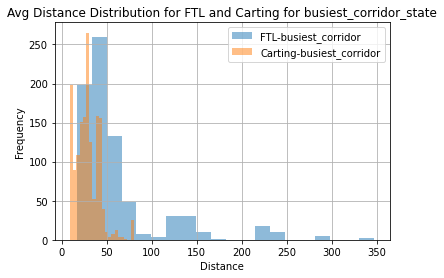

In [1084]:

# Filter data for each category and create overlapping histograms
df[(df['route_type'] == 'FTL') & (df['state_corridor'] == busiest_corridor_state)]["actual_distance_to_destination"].hist(bins=20, alpha=0.5, label='FTL-busiest_corridor')
df[(df['route_type'] == 'Carting') & (df['state_corridor'] == busiest_corridor_state)]["actual_distance_to_destination"].hist(bins=20, alpha=0.5, label='Carting-busiest_corridor')

# df[(df['route_type'] == 'FTL')]["actual_distance_to_destination"].hist(bins=20, alpha=0.5, label='FTL')
# df[(df['route_type'] == 'Carting')]["actual_distance_to_destination"].hist(bins=20, alpha=0.5, label='Carting')

# Add labels and title
plt.xlabel('Distance')
plt.ylabel('Frequency')
plt.title('Avg Distance Distribution for FTL and Carting for busiest_corridor_state')

# Add legend
plt.legend()

# Display the plot
plt.show()


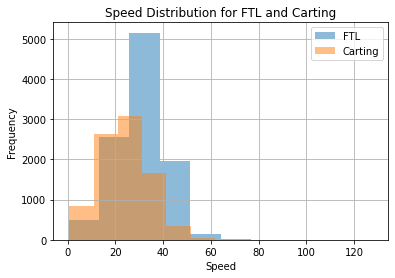

In [1085]:

# Filter data for each category and create overlapping histograms
df[df['route_type'] == 'FTL']["Speed"].hist(bins=10, alpha=0.5, label='FTL')
df[df['route_type'] == 'Carting']["Speed"].hist(bins=10, alpha=0.5, label='Carting')

# Add labels and title
plt.xlabel('Speed')
plt.ylabel('Frequency')
plt.title('Speed Distribution for FTL and Carting')

# Add legend
plt.legend()

# Display the plot
plt.show()

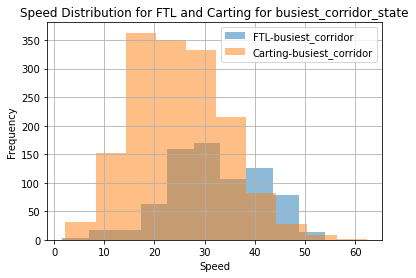

In [1086]:

# Filter data for each category and create overlapping histograms
df[(df['route_type'] == 'FTL') & (df['state_corridor'] == busiest_corridor_state)]["Speed"].hist(bins=10, alpha=0.5, label='FTL-busiest_corridor')
df[(df['route_type'] == 'Carting') & (df['state_corridor'] == busiest_corridor_state)]["Speed"].hist(bins=10, alpha=0.5, label='Carting-busiest_corridor')

# Add labels and title
plt.xlabel('Speed')
plt.ylabel('Frequency')
plt.title('Speed Distribution for FTL and Carting for busiest_corridor_state')

# Add legend
plt.legend()

# Display the plot
plt.show()


In [1087]:
ftl_bad_performing_busiestcorridor = df[(df['route_type'] == 'FTL') & (df['Speed'] < 20 ) & (df['actual_distance_to_destination'] < 100 ) & (df['state_corridor'] == busiest_corridor_state)]
ftl_bad_performing_busiestcorridor

,trip_uuid,source_center,source_name,destination_center,destination_name,data,trip_creation_time,route_schedule_uuid,route_type,actual_distance_to_destination,actual_time,segment_actual_time,osrm_time,segment_osrm_time,osrm_distance,segment_osrm_distance,od_start_time,od_end_time,start_scan_to_end_scan,is_cutoff,cutoff_factor,cutoff_timestamp,factor,segment_factor,Destination_State,Destination_City,Destination_Place,Destination_Code,Source_State,Source_City,Source_Place,Source_Code,Trip_Creation_Year,Trip_Creation_Month,Trip_Creation_Day,Trip_Creation_Hour,Trip_Creation_Minute,Trip_Creation_Second,Speed,corridor,state_corridor
8,trip-153671052974046625,IND583119AAA,Sandur_WrdN1DPP_D (Karnataka),IND583101AAA,Bellary_Dc (Karnataka),training,2018-09-12 00:02:09.740725,thanos::sroute:d9f07b12-65e0-4f3b-bec8-df0613461b0f,FTL,41.317614,131.0,130.0,44.0,44.0,53.5761,53.5761,2018-09-12 03:54:43.114421,2018-09-12 12:00:30.683231,485.0,False,63,2018-09-12 05:17:30.000000,5.810606,5.871795,Karnataka,Bellary,Other_Bellary,Dc,Karnataka,Sandur,WrdN1DPP,D,2018,9,12,0,2,9,18.924098,Sandur_WrdN1DPP_D (Karnataka) <-> Bellary_Dc (Karnataka),Karnataka <-> Karnataka
154,trip-153671655901475301,IND571114AAA,HDKote_BegurRD_D (Karnataka),IND570020AAA,Mysore_Yadvgiri_IP (Karnataka),training,2018-09-12 01:42:39.014985,thanos::sroute:02473c6f-831f-4008-be51-be7290ad2760,FTL,43.006869,140.0,139.0,54.0,53.0,58.8804,58.8803,2018-09-12 08:48:20.471487,2018-09-12 15:32:19.902107,403.0,False,65,2018-09-12 09:27:24.000000,6.449735,5.097143,Karnataka,Mysore,Yadvgiri,IP,Karnataka,HDKote,BegurRD,D,2018,9,12,1,42,39,18.431515,HDKote_BegurRD_D (Karnataka) <-> Mysore_Yadvgiri_IP (Karnataka),Karnataka <-> Karnataka
578,trip-153675104692374277,IND580028AAA,Hubli_Adargchi_IP (Karnataka),IND591123AAC,Ramdurg_GndhiNGR_D (Karnataka),training,2018-09-12 11:17:26.924003,thanos::sroute:75a84ec5-a02c-421c-96f4-1601912b7bb4,FTL,74.927864,513.0,512.0,87.0,294.0,111.8522,332.4634,2018-09-12 11:17:26.924003,2018-09-12 23:15:56.111970,718.0,False,316,2018-09-12 22:17:20.000000,11.562812,8.299311,Karnataka,Ramdurg,GndhiNGR,D,Karnataka,Hubli,Adargchi,IP,2018,9,12,11,17,26,8.763493,Hubli_Adargchi_IP (Karnataka) <-> Ramdurg_GndhiNGR_D (Karnataka),Karnataka <-> Karnataka
1019,trip-153678644514042052,IND573116AAA,Channaraya_patna_D (Karnataka),IND571426AAA,Krishnarajpet_MuruPost_D (Karnataka),training,2018-09-12 21:07:25.140692,thanos::sroute:f8c83fd0-6554-44f3-9408-32465bd1f01c,FTL,30.604224,162.0,161.0,29.0,29.0,32.2457,32.2457,2018-09-12 23:07:14.588082,2018-09-13 02:22:40.959364,195.0,False,52,2018-09-12 23:27:20.000000,12.586207,8.000000,Karnataka,Krishnarajpet,MuruPost,D,Karnataka,Channaraya,patna,D,2018,9,12,21,7,25,11.334898,Channaraya_patna_D (Karnataka) <-> Krishnarajpet_MuruPost_D (Karnataka),Karnataka <-> Karnataka
1771,trip-153683721761581127,IND580028AAA,Hubli_Adargchi_IP (Karnataka),IND591123AAC,Ramdurg_GndhiNGR_D (Karnataka),training,2018-09-13 11:13:37.616071,thanos::sroute:75a84ec5-a02c-421c-96f4-1601912b7bb4,FTL,75.033351,567.0,566.0,87.0,92.0,111.7367,104.1482,2018-09-13 11:13:37.616071,2018-09-13 23:32:45.125982,739.0,False,207,2018-09-13 22:43:21.000000,11.285333,28.432461,Karnataka,Ramdurg,GndhiNGR,D,Karnataka,Hubli,Adargchi,IP,2018,9,13,11,13,37,7.940037,Hubli_Adargchi_IP (Karnataka) <-> Ramdurg_GndhiNGR_D (Karnataka),Karnataka <-> Karnataka
1978,trip-153686161970246164,IND575004AAB,Mangalore_Kuntikna_H (Karnataka),IND574117AAA,Uchila_Busstand_D (Karnataka),training,2018-09-13 18:00:19.702751,thanos::sroute:f8968c72-5222-4d81-9eed-8a6d88f11652,FTL,33.792602,102.0,102.0,32.0,31.0,35.6651,35.6651,2018-09-13 18:00:19.702751,2018-09-14 02:11:46.564650,491.0,False,55,2018-09-14 00:37:21.000000,6.428879,7.241379,Karnataka,Uchila,Busstand,D,Karnataka,Mangalore,Kuntikna,H,2018,9,13,18,0,19,19.878001,Mangalore_Kuntikna_H (Karnataka) <-> Uchila_Busstand_D (Karnataka),Karnataka <-> Karnataka
4040,trip-153697367003889450,IND571114AAA,HDKote_BegurRD_D (Karnataka),IND570020AAA

In [1088]:
len(ftl_bad_performing_busiestcorridor)


57

In [1089]:
corridor_bad_ftl = ftl_bad_performing_busiestcorridor['corridor']
corridor_bad_ftl

8                         Sandur_WrdN1DPP_D (Karnataka) <-> Bellary_Dc (Karnataka)
154                HDKote_BegurRD_D (Karnataka) <-> Mysore_Yadvgiri_IP (Karnataka)
578               Hubli_Adargchi_IP (Karnataka) <-> Ramdurg_GndhiNGR_D (Karnataka)
1019       Channaraya_patna_D (Karnataka) <-> Krishnarajpet_MuruPost_D (Karnataka)
1771              Hubli_Adargchi_IP (Karnataka) <-> Ramdurg_GndhiNGR_D (Karnataka)
1978            Mangalore_Kuntikna_H (Karnataka) <-> Uchila_Busstand_D (Karnataka)
4040               HDKote_BegurRD_D (Karnataka) <-> Mysore_Yadvgiri_IP (Karnataka)
4044        Tirumakudalu_Narasipr_D (Karnataka) <-> Mysore_Yadvgiri_IP (Karnataka)
4936      Channaraya_patna_D (Karnataka) <-> Ramanathapura_Central_D_2 (Karnataka)
4937              Hassan_Pandrnga_I (Karnataka) <-> Channaraya_patna_D (Karnataka)
5294           Mysore_Yadvgiri_IP (Karnataka) <-> Malavalli_SulthnRd_D (Karnataka)
6349                      Sandur_WrdN1DPP_D (Karnataka) <-> Bellary_Dc (Karnataka)
6782

In [1090]:
cart_b_ftl_time = np.average(ftl_bad_performing_busiestcorridor['actual_time'])

In [1091]:

# Finding how much time will it take for carting to cover actual_distance_to_destination<100 for same corridors average
# cart_b_c = (df[(df['route_type'] == 'Carting') & (df['actual_distance_to_destination'] < 100) & (df['state_corridor'] == busiest_corridor_state)])
cart_b_c = df[(df['route_type'] == 'Carting') & df['corridor'].isin(corridor_bad_ftl) & (df['actual_distance_to_destination'] < 100) & (df['state_corridor'] == busiest_corridor_state)]
cart_b_c


,trip_uuid,source_center,source_name,destination_center,destination_name,data,trip_creation_time,route_schedule_uuid,route_type,actual_distance_to_destination,actual_time,segment_actual_time,osrm_time,segment_osrm_time,osrm_distance,segment_osrm_distance,od_start_time,od_end_time,start_scan_to_end_scan,is_cutoff,cutoff_factor,cutoff_timestamp,factor,segment_factor,Destination_State,Destination_City,Destination_Place,Destination_Code,Source_State,Source_City,Source_Place,Source_Code,Trip_Creation_Year,Trip_Creation_Month,Trip_Creation_Day,Trip_Creation_Hour,Trip_Creation_Minute,Trip_Creation_Second,Speed,corridor,state_corridor
304,trip-153672451189544188,IND562132AAA,Bengaluru_Nelmngla_H (Karnataka),IND560099AAB,Bengaluru_Bomsndra_HB (Karnataka),training,2018-09-12 03:55:11.895830,thanos::sroute:5b8cc767-dbd3-49ad-bf75-02b2a17a50d9,Carting,39.516663,94.0,93.0,50.0,52.0,49.9665,51.7720,2018-09-12 03:55:11.895830,2018-09-12 07:38:51.631777,223.0,False,129,2018-09-12 06:53:33,10.118069,8.414665,Karnataka,Bengaluru,Bomsndra,HB,Karnataka,Bengaluru,Nelmngla,H,2018,9,12,3,55,11,25.223402,Bengaluru_Nelmngla_H (Karnataka) <-> Bengaluru_Bomsndra_HB (Karnataka),Karnataka <-> Karnataka
345,trip-153672808393094644,IND560099AAB,Bengaluru_Bomsndra_HB (Karnataka),IND562132AAA,Bengaluru_Nelmngla_H (Karnataka),training,2018-09-12 04:54:43.931216,thanos::sroute:c9198c6a-5b3a-4208-b274-13c16d923c70,Carting,39.461546,108.0,107.0,56.0,52.0,45.9978,52.4359,2018-09-12 04:54:43.931216,2018-09-12 09:40:32.656938,285.0,False,129,2018-09-12 07:33:25,11.565934,10.269444,Karnataka,Bengaluru,Nelmngla,H,Karnataka,Bengaluru,Bomsndra,HB,2018,9,12,4,54,43,21.923081,Bengaluru_Bomsndra_HB (Karnataka) <-> Bengaluru_Nelmngla_H (Karnataka),Karnataka <-> Karnataka
542,trip-153674578163234417,IND562132AAA,Bengaluru_Nelmngla_H (Karnataka),IND560099AAB,Bengaluru_Bomsndra_HB (Karnataka),training,2018-09-12 09:49:41.632577,thanos::sroute:69e71920-3c56-40fe-a2e9-2156906b9bab,Carting,40.591956,120.0,119.0,55.0,56.0,53.2285,55.0339,2018-09-12 09:49:41.632577,2018-09-12 14:43:02.419680,293.0,False,130,2018-09-12 13:03:31,13.504501,10.257692,Karnataka,Bengaluru,Bomsndra,HB,Karnataka,Bengaluru,Nelmngla,H,2018,9,12,9,49,41,20.295978,Bengaluru_Nelmngla_H (Karnataka) <-> Bengaluru_Bomsndra_HB (Karnataka),Karnataka <-> Karnataka
631,trip-153676110479625615,IND560099AAB,Bengaluru_Bomsndra_HB (Karnataka),IND562132AAA,Bengaluru_Nelmngla_H (Karnataka),training,2018-09-12 14:05:04.796621,thanos::sroute:4d5c8dc5-b60e-4450-a4fe-c83bd859405f,Carting,39.407062,136.0,134.0,54.0,52.0,45.8323,52.2703,2018-09-12 14:05:04.796621,2018-09-12 17:41:27.960251,216.0,False,129,2018-09-12 16:21:21,15.983171,12.206944,Karnataka,Bengaluru,Nelmngla,H,Karnataka,Bengaluru,Bomsndra,HB,2018,9,12,14,5,4,17.385469,Bengaluru_Bomsndra_HB (Karnataka) <-> Bengaluru_Nelmngla_H (Karnataka),Karnataka <-> Karnataka
705,trip-153676963602718837,IND560099AAB,Bengaluru_Bomsndra_HB (Karnataka),IND562132AAA,Bengaluru_Nelmngla_H (Karnataka),training,2018-09-12 16:27:16.027430,thanos::sroute:6db906b2-bc4f-43c2-b8bf-bac1227b11ca,Carting,39.470437,83.0,82.0,56.0,53.0,46.0681,52.5061,2018-09-12 16:27:16.027430,2018-09-12 21:59:18.777034,332.0,False,129,2018-09-12 18:45:28,7.959518,7.006863,Karnataka,Bengaluru,Nelmngla,H,Karnataka,Bengaluru,Bomsndra,HB,2018,9,12,16,27,16,28.532846,Bengaluru_Bomsndra_HB (Karnataka) <-> Bengaluru_Nelmngla_H (Karnataka),Karnataka <-> Karnataka
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18229,trip-153796688528463626,IND562132AAA,Bengaluru_Nelmngla_H (Karnataka),IND560099AAB,Bengaluru_Bomsndra_HB (Karnataka),training,2018-09-26 13:01:25.284893,thanos::sroute:cfe4ce81-31d0-43cc-931f-c9fc8b46815d,Carting,39.443262,86.0,84.0,50.0,53.0,49.8524,51.6578,2018-09-26 13:01:25.284893,2018-09-26 18:31:43.637062,330.0,False,129,2018-09-26 17:17:20,8.014813,7.934421,Karnataka,Bengaluru,Bomsnd

In [1092]:
cart_b_c_time = np.average(cart_b_c['actual_time'])

In [1093]:
time_saved = cart_b_ftl_time - cart_b_c_time
print('We can save avg ', time_saved, 'mins if we start using carting over FTL in following corridors:')
corridor_bad_ftl

We can save avg  118.46411483253588 mins if we start using carting over FTL in following corridors:


8                         Sandur_WrdN1DPP_D (Karnataka) <-> Bellary_Dc (Karnataka)
154                HDKote_BegurRD_D (Karnataka) <-> Mysore_Yadvgiri_IP (Karnataka)
578               Hubli_Adargchi_IP (Karnataka) <-> Ramdurg_GndhiNGR_D (Karnataka)
1019       Channaraya_patna_D (Karnataka) <-> Krishnarajpet_MuruPost_D (Karnataka)
1771              Hubli_Adargchi_IP (Karnataka) <-> Ramdurg_GndhiNGR_D (Karnataka)
1978            Mangalore_Kuntikna_H (Karnataka) <-> Uchila_Busstand_D (Karnataka)
4040               HDKote_BegurRD_D (Karnataka) <-> Mysore_Yadvgiri_IP (Karnataka)
4044        Tirumakudalu_Narasipr_D (Karnataka) <-> Mysore_Yadvgiri_IP (Karnataka)
4936      Channaraya_patna_D (Karnataka) <-> Ramanathapura_Central_D_2 (Karnataka)
4937              Hassan_Pandrnga_I (Karnataka) <-> Channaraya_patna_D (Karnataka)
5294           Mysore_Yadvgiri_IP (Karnataka) <-> Malavalli_SulthnRd_D (Karnataka)
6349                      Sandur_WrdN1DPP_D (Karnataka) <-> Bellary_Dc (Karnataka)
6782

In [1094]:
df2 = df[df['Source_State']=='Karnataka']['Destination_State'].value_counts()
df2

Karnataka         2323
Haryana             35
Maharashtra         33
Andhra Pradesh      33
Telangana           26
Goa                 23
Tamil Nadu          21
Kerala              20
Orissa              12
Madhya Pradesh       7
Rajasthan            7
IND577116AAA         4
West Bengal          3
Gujarat              1
Name: Destination_State, dtype: int64

In [1095]:
s=np.sum(df2)
s

2548

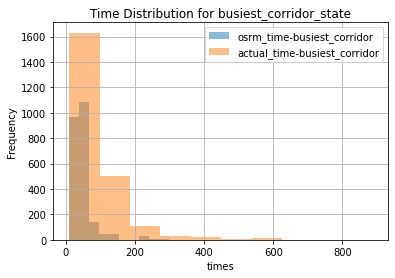

In [1096]:

# Filter data for each category and create overlapping histograms
df[(df['state_corridor'] == busiest_corridor_state)]["osrm_time"].hist(bins=10, alpha=0.5, label='osrm_time-busiest_corridor')
df[(df['state_corridor'] == busiest_corridor_state)]["actual_time"].hist(bins=10, alpha=0.5, label='actual_time-busiest_corridor')

# Add labels and title
plt.xlabel('times')
plt.ylabel('Frequency')
plt.title('Time Distribution for busiest_corridor_state')

# Add legend
plt.legend()

# Display the plot
plt.show()


In [1097]:
# df2 = df[df['Source_State']=='Karnataka']['osrm_time'].value_counts()
# df2
df[df['Source_State']=='Karnataka']['osrm_time'].describe()


count    2548.000000
mean       91.793171
std       219.732803
min         8.000000
25%        31.000000
50%        43.000000
75%        57.000000
max      1532.000000
Name: osrm_time, dtype: float64

In [1098]:
# df2 = df[df['Source_State']=='Karnataka']['actual_time'].value_counts()
# df2
df[df['Source_State']=='Karnataka']['actual_time'].describe()


count    2548.000000
mean      178.556122
std       419.102488
min        10.000000
25%        52.000000
50%        79.000000
75%       124.000000
max      3306.000000
Name: actual_time, dtype: float64

In [1099]:
# df2 = df['osrm_time'].value_counts()
# df2
df['osrm_time'].describe()


count    18947.000000
mean        92.287592
std        183.539863
min          6.000000
25%         25.000000
50%         40.000000
75%         76.000000
max       1686.000000
Name: osrm_time, dtype: float64

In [1100]:
mean_time_actual_bus_corr = df[df['Source_State'] == 'Karnataka']['actual_time'].mean()
mean_time_osrm_bus_corr = df[df['Source_State'] == 'Karnataka']['osrm_time'].mean()
mean_time_actual = df['actual_time'].mean()
mean_time_osrm = df['osrm_time'].mean()

print('Avg OSRM time Diff with all data', mean_time_actual - mean_time_osrm)
print('Avg OSRM time Diff of busiest corridor', mean_time_actual_bus_corr - mean_time_osrm_bus_corr)


Avg OSRM time Diff with all data 111.00955296352984
Avg OSRM time Diff of busiest corridor 86.76295133437989


In [1101]:
mean_time_actual_bus_corr_cart = df[(df['Source_State'] == 'Karnataka')&(df['route_type'] == 'Carting')]['actual_time'].mean()
mean_time_osrm_bus_corr_cart = df[(df['Source_State'] == 'Karnataka')&(df['route_type'] == 'Carting')]['osrm_time'].mean()
mean_time_actual_bus_corr_ftl = df[(df['Source_State'] == 'Karnataka')&(df['route_type'] == 'FTL')]['actual_time'].mean()
mean_time_osrm_bus_corr_ftl = df[(df['Source_State'] == 'Karnataka')&(df['route_type'] == 'FTL')]['osrm_time'].mean()

print('Avg OSRM time Diff with Carting in busiest corridor', mean_time_actual_bus_corr_cart - mean_time_osrm_bus_corr_cart)
print('Avg OSRM time Diff with FTL in busiest corridor', mean_time_actual_bus_corr_ftl - mean_time_osrm_bus_corr_ftl)

Avg OSRM time Diff with Carting in busiest corridor 41.45275840202916
Avg OSRM time Diff with FTL in busiest corridor 160.351184346035


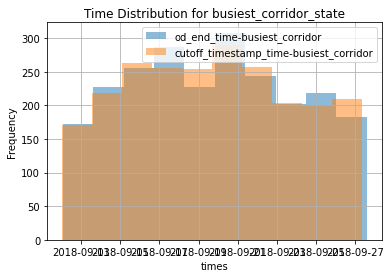

In [1102]:
# od_end_time & cutoff_timestamp

df[(df['state_corridor'] == busiest_corridor_state)]["od_end_time"].hist(bins=10, alpha=0.5, label='od_end_time-busiest_corridor')
df[(df['state_corridor'] == busiest_corridor_state)]["cutoff_timestamp"].hist(bins=10, alpha=0.5, label='cutoff_timestamp_time-busiest_corridor')

# Add labels and title
plt.xlabel('times')
plt.ylabel('Frequency')
plt.title('Time Distribution for busiest_corridor_state')

# Add legend
plt.legend()

# Display the plot
plt.show()


In [1106]:
#case when cutoff_timestamp<od_end_time
selected_df = df[(df['Source_State'] == 'Karnataka') & (df['od_end_time'] > df['cutoff_timestamp'])]
selected_columns = ['actual_time', 'osrm_time', 'actual_distance_to_destination', 'osrm_distance']
description = selected_df[selected_columns].describe()
description
# we checked mean actual_time, osrm_time, osrm_distance, actual_distance_to_destination and give last recommendation


,actual_time,osrm_time,actual_distance_to_destination,osrm_distance
count,2548.000000,2548.000000,2548.000000,2548.000000
mean,178.556122,91.793171,89.589458,110.245997
std,419.102488,219.732803,246.294227,298.996654
min,10.000000,8.000000,9.231960,9.330100
25%,52.000000,31.000000,24.078614,30.216450
50%,79.000000,43.000000,32.909962,41.169200
75%,124.000000,57.000000,45.670023,56.699400
max,3306.000000,1532.000000,1691.261853,2077.103500


# Business Insights & Recommendations

1. FTL has better speed, lesser time than Carting in mostly all cases. (We notice some errors in data where speed of Carting is unreasonably high for few trips which should be error/outliers - handled in final_df).
2. Karnataka<->Karnataka is busiest corridor state (closely followed by Maharashtra<->Maharashtra) used in 2323 trips out of 18,947 subtrips (~12%).
3. Delhi <-> Haryana is busiest interstate corridor (where carting is 6 times more used than FTL).
3. Carting is used for distances upto 100 kms in busiest corridor state 
5. We can use carting for all corridor listed in corridor_bad_ftl (list printed above) to save both time and money. (Avg time in carting for same corridor is lesser than in FTL)
6. Destination city for most of the trips is Bengaluru city (followed by Gurgaon) and source city is also Bengaluru (followed by Gurgaon) for most trips. Bengaluru is the hub for most trips.
7. We notice that most trips whose source is Karnataka, destination state is also Karnataka (~90%). It is true for vice-versa too.
8. Carting is preferred twice as much than FTL in Bengaluru corridor.
9. When Carting, mean difference between OSRM time & actual time is 4 times smaller (hence better) than when using FTL.
10. In busiest corridor state (Karnataka), we see bad performing trips by FTL - speed<20, distance<100. So, our recommendation would be to prefer using Carting for these sources & destinations. It may be cheaper as well (and more aligned to OSRM times as well)
11. The next recommendation would be to prefer long distance when suggested by OSRM. It is so because while analysing all the trips where deadline (cutoff_timestamp) was missed, we saw we took average twice the time we would have taken if followed OSRM suggestion even though distance covered by OSRM suggestion is 33% more average.